# Pose estimation network error comparisons

In this notebook you can follow the calculations performed to compute the euclidean distance errors of the four trained pose estimation networks, the calculation of the false positive rate and some visualisations. The networks we trained are: DLC ResNet-50, DLC ResNet-152, SLEAP U-Net simple (single instance) and SLEAP U-Net topdown. 

In [1]:
import os
import re
import glob
from pprint import pprint
import pandas as pd
import numpy as np
from copy import copy
import seaborn as sns
import matplotlib.pyplot as plt
import h5py
from pathlib import Path
import cv2

from scipy.stats import kruskal
from scikit_posthocs import posthoc_dunn

#### Auxiliary functions

In [2]:
def get_metadata_from_video_name(video_name: str):
    """auxiliary function to generate metadata from our benchmarking dataset file names

    Args:
        video_name (str): path to one or our file names

    Returns:
        tuple : two-element tuple where the first is the video resolution (from 1 to 4 - low to high) and the second is the exposure time (in microseconds). 
    """    
    res = re.findall('RES-\d',video_name)
    res = int(res[0][-1])

    # exp_dict = {'500': 1, '1000': 2, '3000': 3, '10000': 4} 
    exp = re.findall('EXPOSURE-\d+', video_name)
    exp = int(exp[0][9:])

    return (res, exp)

def create_df_header(keypoint_names: list):
    """From a list of keypoint names, create the DeepLabCut output style header. 

    Args:
        keypoint_names (list): list of string with the names of the animal pose keypoints.

    Returns:
        list: list of tuples that form the header of a pd.MultiIndex to be fed to pd.MultiIndex_from_tuples().
    """    
    top_level = []
    bottom_level = []
    for keypt in keypoint_names: 
        top_level.extend([keypt]*2)
        bottom_level.extend(['x', 'y'])

    columns_structure = [top_level, bottom_level]
    columns_structure = list(zip(*columns_structure))

    return columns_structure

def sleap_to_dlc_format(sleap_hdf5_path, indices=None):
    """Converts a sleap hdf5 file to a pandas DataFrame
    Args:
        sleap_hdf5_path (string): path to sleap predictions hdf5 file
        indices (list, optional): list of indices of the frames to extract. Default is to use all frames. 

    Returns:
        _type_: pd.DataFrame
    """    
    with h5py.File(sleap_hdf5_path, "r") as f:
        locations = f["tracks"][:].T
        node_names = [n.decode() for n in f['node_names'][:]]

        if indices == None:
            locations = locations[:,:,:,0].reshape(-1,len(node_names)*2)
        else:
            locations = locations[indices,:,:,0].reshape(-1,len(node_names)*2)

        # print(locations.shape)
        
        columns = create_df_header(node_names)
        results_structure = pd.MultiIndex.from_tuples(columns)
        if indices != None:
            df = pd.DataFrame(data=locations, columns=results_structure, index=indices)
        else:
            df = pd.DataFrame(data=locations, columns=results_structure)
        
        return df

#### Data location and network information

In [3]:
DLC_nx_suffixes = {'DLC_Resnet-50': 'DLC_resnet50_ZF-RoscoSep13shuffle0_3200000', 'DLC_Resnet-152':'DLC_resnet152_ZF-RoscoSep13shuffle1_3850000'}

## 1- Euclidean distance error calculations for the independent dataset

If you wish to rerun these calculations, you need to downlad the datasets from here: 

**Scholz LA, Mancienne T, Stednitz S, Scott E, Lee C** (2025) *Datasets of zebrafish larvae poses - annotated frames and videos.* Dataset. DOI: [10.26188/29276009.v1](https://doi.org/10.26188/29276009.v1) 

In [5]:
downsampled_flag = False 
path_to_verif_frames = r"D:\DLC_Paper\DLC_Tests\labeled-data"
path_to_videos = r"D:\DLC_Paper\DLC_Tests"

In [6]:
videos_list = glob.glob(os.path.join(path_to_verif_frames,'**'))
videos_list = [video for video in videos_list if os.path.isdir(video)]
pprint(videos_list[:10])

['D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1',
 'D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_4',
 'D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-1-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-9-40-42_well_2',
 'D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-1-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-9-40-42_well_6',
 'D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-1-Trial-3-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-BURST--2024-9-3-9-40-42_well_3',
 'D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-1-Trial-3-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-BURST--2024-9-3-9-40-42_well_4',
 'D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-10-Trial-3-FPS-100-GAIN-0-EXPOSURE-10000-RES-3-STIM-TAP--2024-9-3-15-23-19_well_1',
 'D:\\DLC_Paper\\DLC_Tests\\labeled-data\\CLAS-Batch-10-T

In [7]:
video_frames_to_get = dict()
for video in videos_list: 
    video_name = os.path.split(video)[-1]
    selected_frames = glob.glob(os.path.join(video,'*.png'))
    frames_list = []
    for frame in selected_frames:
        frame_num = int(re.findall('\d+', frame)[-1])
        frames_list.extend([frame_num])
    video_frames_to_get.update({video_name: frames_list})

pprint(video_frames_to_get)

{'CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1': [0,
                                                                                                118,
                                                                                                548,
                                                                                                1039,
                                                                                                2061,
                                                                                                2069,
                                                                                                2072,
                                                                                                2898,
                                                                                                2901,
                                                                                       

In [8]:
for DLC_network, DLC_suffix in DLC_nx_suffixes.items():
    for video_name, frames_to_get in video_frames_to_get.items():
        dlc_results_list = glob.glob(os.path.join(path_to_videos,'**','*'+DLC_suffix+'.h5'))
        for dlc_result in dlc_results_list:
            if video_name in dlc_result:
                print(video_name)
                print(frames_to_get)
                result_df = pd.read_hdf(dlc_result)
                frames_df = result_df.iloc[frames_to_get,:]
                frames_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+DLC_network+'.csv'))


CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1
[0, 118, 548, 1039, 2061, 2069, 2072, 2898, 2901, 2903]
CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_4
[1297, 2123, 2124, 2126, 2127, 2128, 2130, 2131, 2134, 2146]
CLAS-Batch-1-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-9-40-42_well_2
[611, 757, 759, 1499, 2001, 2005, 2007, 2019, 2028, 2044]
CLAS-Batch-1-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-9-40-42_well_6
[1359, 1365, 1404, 1524, 1528, 1571, 2035, 2065, 2192, 2198]
CLAS-Batch-1-Trial-3-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-BURST--2024-9-3-9-40-42_well_3
[723, 763, 768, 1231, 1253, 1276, 1347, 1452, 1455, 1459, 1461, 1468, 1499, 1661, 1991, 2005, 2010, 2021, 2023, 2063]
CLAS-Batch-1-Trial-3-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-BURST--2024-9-3-9-40-42_well_4
[1018, 1035, 1499, 2004, 2005, 2006, 2016, 2799, 2804, 2867]
CLAS-Batch-10-Trial-3-FPS-100-GAIN-0-EXPOSU

## 1.1 - Compare DLC tracked data against annotated data - independent dataset

In [9]:
if 'full_DLC_error_df' in globals().keys():
    del full_DLC_error_df

In [10]:
resolution = {1: 133, 2: 100, 3: 66, 4: 33}

for DLC_network, DLC_suffix in DLC_nx_suffixes.items():
    for video in videos_list: 
        # load the annotations and dlc tracking results files 
        annotation_path = glob.glob(os.path.join(video, '*LAS-TM-CL.csv'))[0]
        annotations_df = pd.read_csv(annotation_path, header=[0,1,2])

        video_name = os.path.split(video)[-1]
        dlc_df = pd.read_csv(os.path.join(path_to_verif_frames, video_name+'_'+DLC_network+'.csv'), header=[0,1,2])

        annot_lvl = annotations_df.columns.get_level_values(0)[-1]
        dlc_lvl = dlc_df.columns.get_level_values(0)[-1]

        #  order keypoints nicely
        keypoints = np.unique(annotations_df.columns.get_level_values(1)[3:])
        keypoints = keypoints[[4,5,7,8,9,10,11,12,13,14,6,3,2,1,0]]

        res, exp = get_metadata_from_video_name(video_name)
        error = {'video_name': [video_name]*len(dlc_df), 'resolution' : np.ones((len(dlc_df),))*res, 'exposure': np.ones((len(dlc_df),))*exp}
        
        for keypoint in keypoints:
            if downsampled_flag:
                if res <=3:
                    divider = {3: 2.03, 2: 2.99, 1: 3.925}
                    MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')]/divider[res] - dlc_df[dlc_lvl].loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                if res == 4:
                    MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - dlc_df[dlc_lvl].loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
            else:
                MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - dlc_df[dlc_lvl].loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
            
            MSE = MSE * resolution[res]
            error.update({keypoint: MSE})
        
        error_df = pd.DataFrame(error)
        error_df['all_mean'] = error_df[keypoints].mean(axis=1)
        error_df['all_std'] = error_df[keypoints].mean(axis=1)
        error_df['method'] = DLC_network
        
        error_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+DLC_network+'_ERROR.csv'))

        if 'full_DLC_error_df' in globals().keys():
            full_DLC_error_df = pd.concat((full_DLC_error_df, error_df), ignore_index=True)
        else:
            full_DLC_error_df = error_df

full_DLC_error_df.replace(0, np.nan, inplace=True)

In [11]:
full_DLC_error_df.describe()

,resolution,exposure,swim_bladder,tail_1,tail_2,tail_3,tail_4,tail_5,tail_6,tail_7,tail_8,tail_9,tail_10,R_eye_top,R_eye_bottom,L_eye_top,L_eye_bottom,all_mean,all_std
count,1958.000000,1958.000000,1942.000000,1944.000000,1944.000000,1944.000000,1942.000000,1934.000000,1928.000000,1920.000000,1910.000000,1894.000000,1880.000000,1942.000000,1944.000000,1942.000000,1938.000000,1948.000000,1948.000000
mean,2.500511,3660.878447,235.075970,258.998808,269.536281,277.522264,285.358750,298.080161,319.821962,339.181804,377.242732,378.632991,431.119692,233.773415,214.859162,239.393599,227.854840,289.128040,289.128040
std,1.127874,3828.317645,1070.294898,1056.581009,1049.534818,1039.793299,999.158720,977.136611,1002.883417,1011.963734,1246.805821,984.026718,1005.019345,1098.777545,1053.878219,1112.097305,1093.501188,954.977312,954.977312
min,1.000000,500.000000,0.821594,4.529834,4.361895,1.814753,4.747707,2.155895,3.315171,1.082505,1.268841,6.912199,4.934944,2.084311,1.940148,1.004783,3.224948,34.260312,34.260312
25%,1.000000,500.000000,68.527991,73.311517,77.906842,80.177766,82.031887,83.586305,88.950652,93.339524,103.807613,109.450036,132.956094,62.976848,55.929635,60.875530,59.541885,99.894382,99.894382
50%,3.000000,3000.000000,111.254813,122.017680,127.123377,131.155681,141.117386,150.068915,157.766159,168.548533,184.304760,195.442354,230.305411,109.843482,90.720071,102.315831,99.308601,145.717990,145.717990
75%,4.000000,10000.000000,169.236876,195.744569,209.909453,219.734455,234.211332,253.526930,274.166792,297.836897,317.718505,343.547343,391.554292,167.132302,146.754446,159.726801,150.997178,224.037905,224.037905
max,4.000000,10000.000000,18263.848700,18186.077563,17935.534343,17796.651881,17656.465907,17281.693714,17209.239073,17021.988897,25060.340398,16652.033925,16437.911483,18633.844789,18381.809511,18593.134025,18405.554689,17610.828694,17610.828694


In [12]:
full_DLC_error_df.keys()

Index(['video_name', 'resolution', 'exposure', 'swim_bladder', 'tail_1',
       'tail_2', 'tail_3', 'tail_4', 'tail_5', 'tail_6', 'tail_7', 'tail_8',
       'tail_9', 'tail_10', 'R_eye_top', 'R_eye_bottom', 'L_eye_top',
       'L_eye_bottom', 'all_mean', 'all_std', 'method'],
      dtype='object')

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 15.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


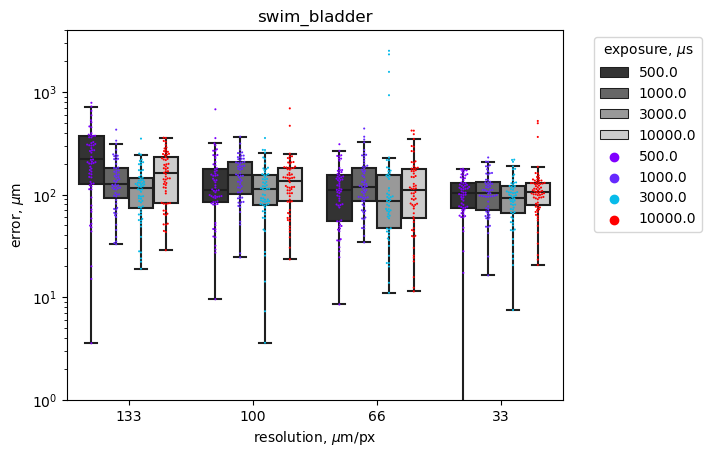

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


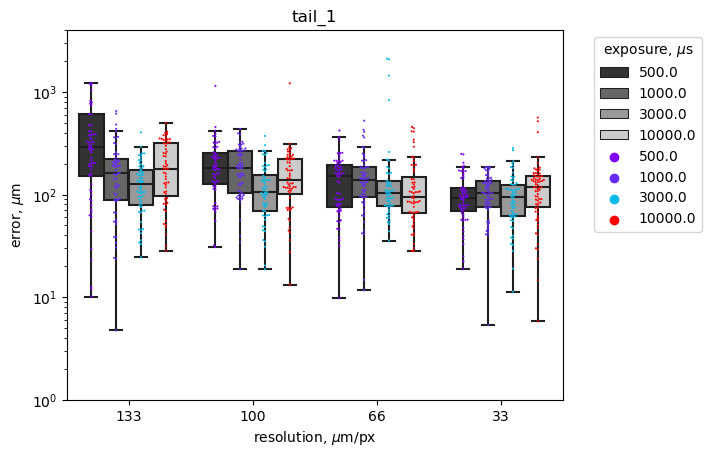

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


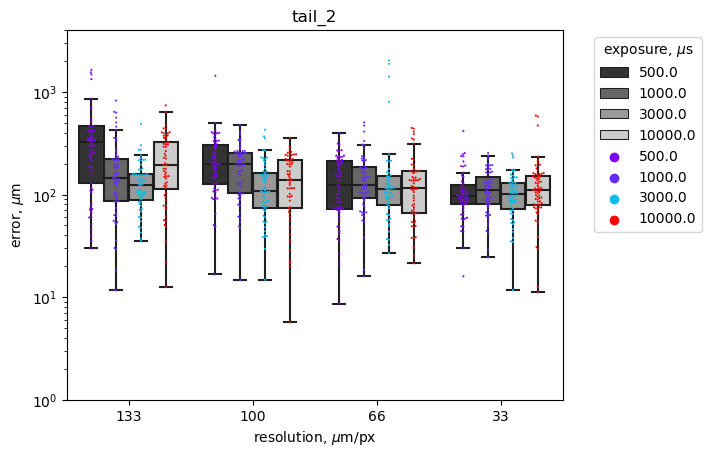

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


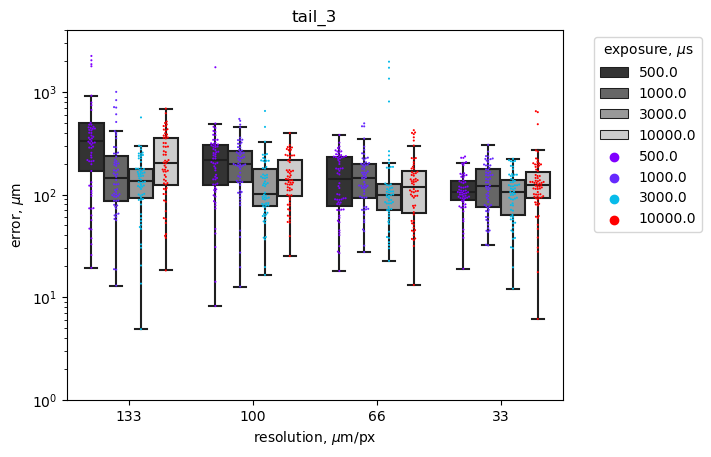

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


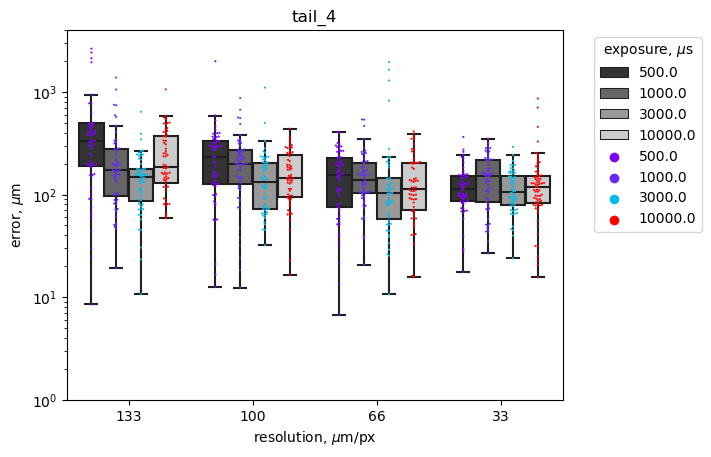

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


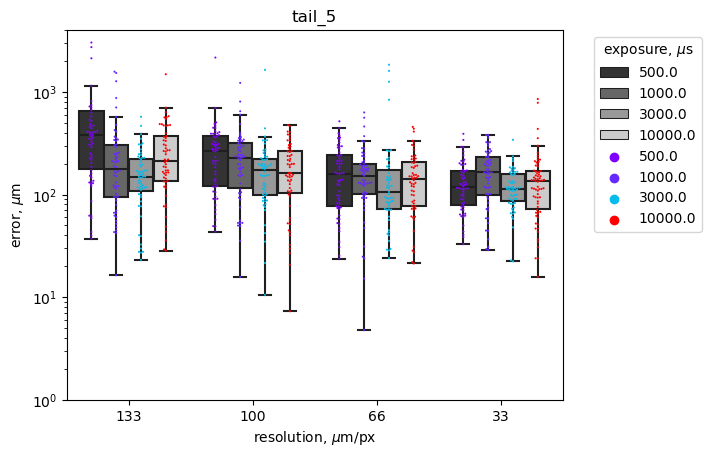

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


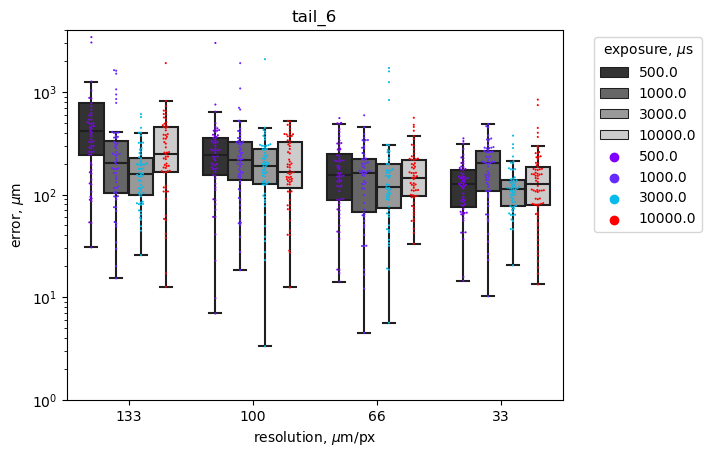

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


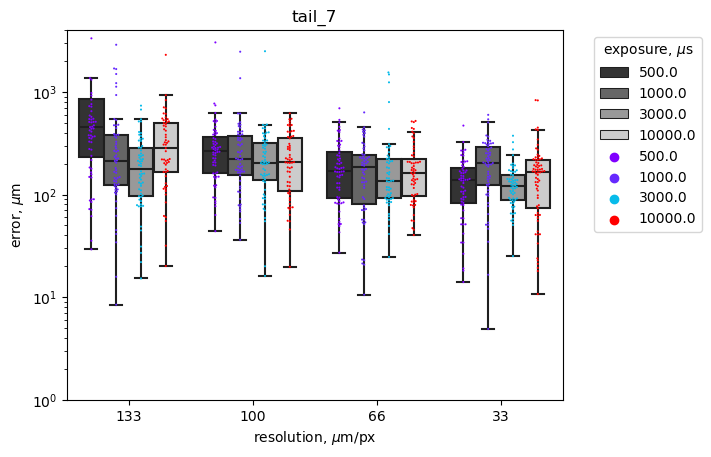

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


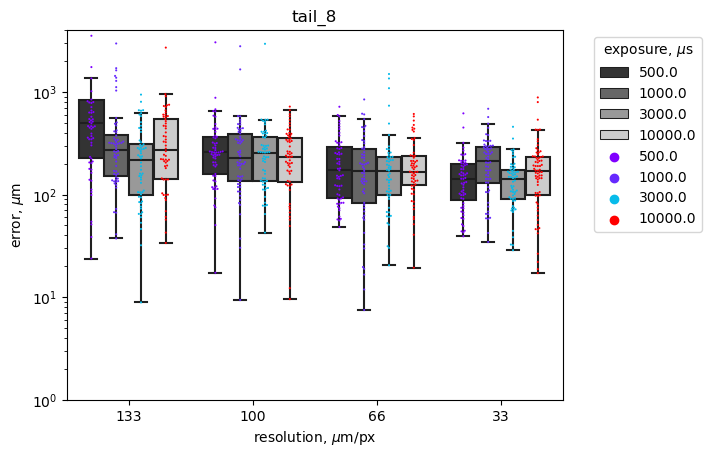

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


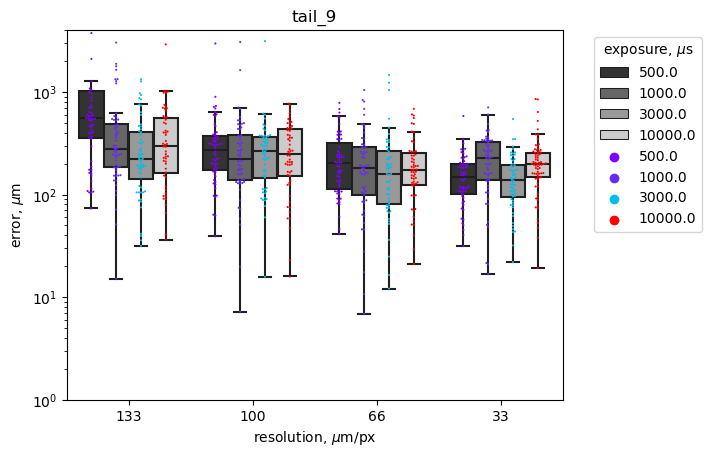

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


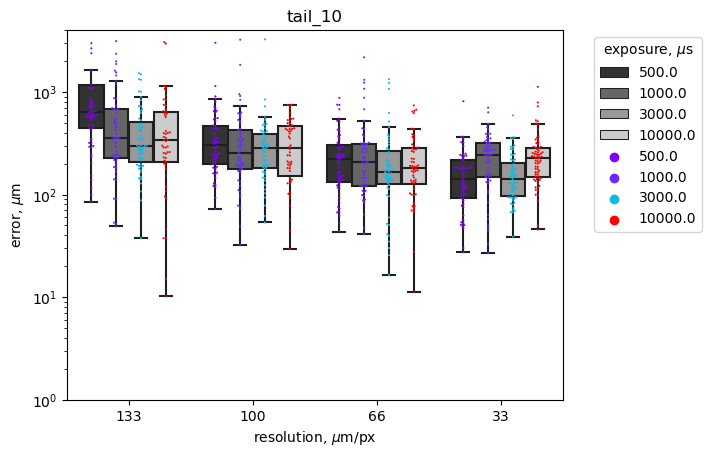

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


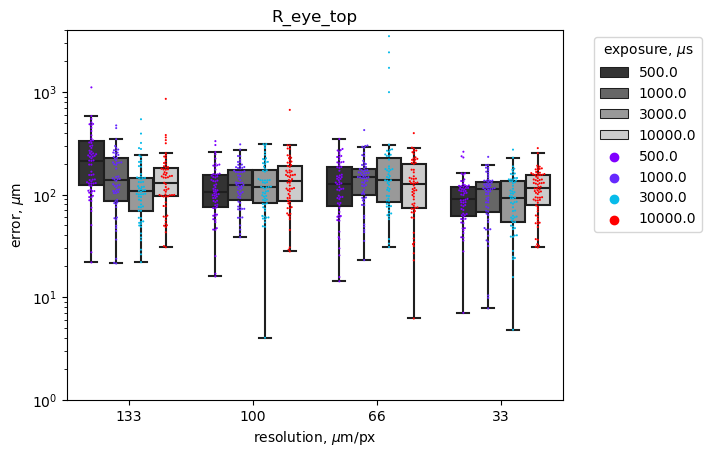

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


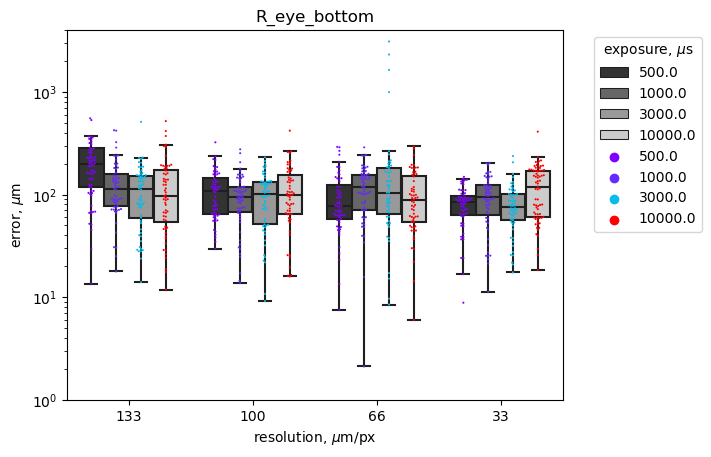

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


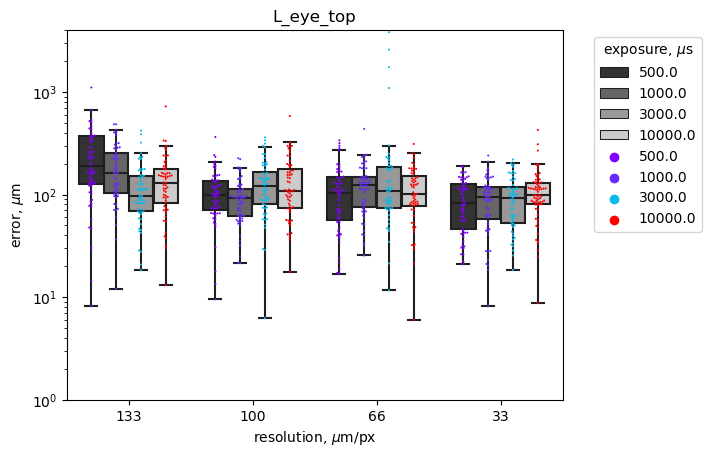

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


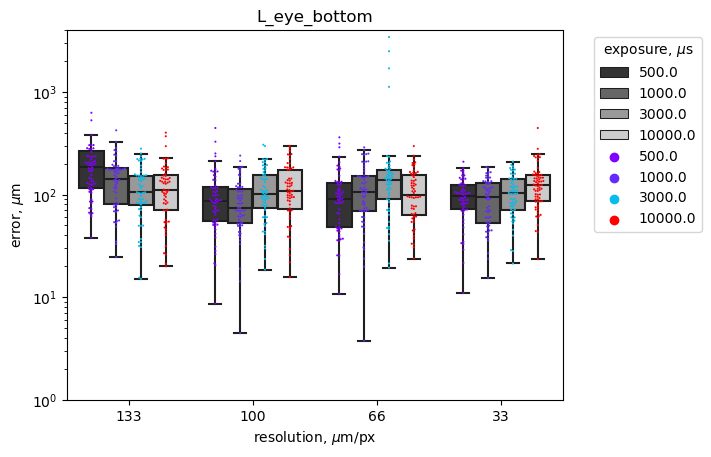

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


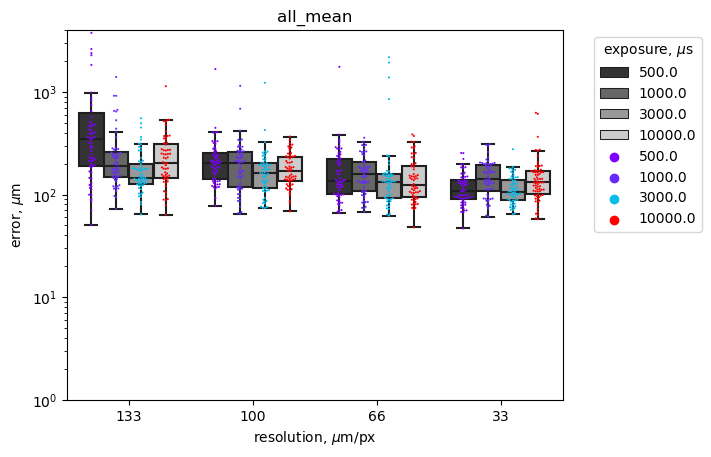

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the marke

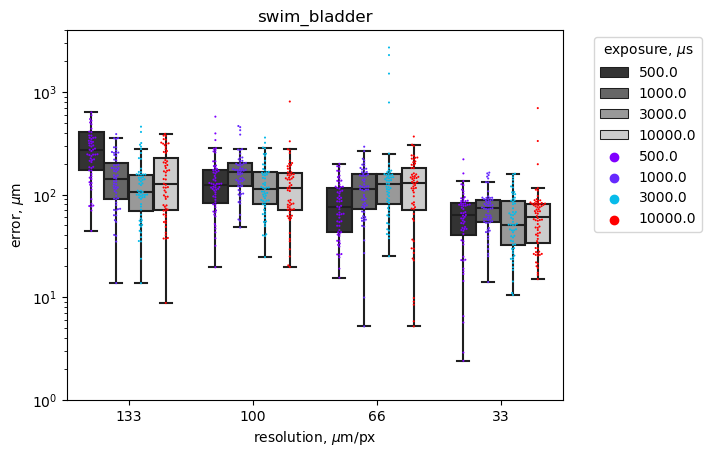

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 22.9% of the points cannot be placed; you may want to decrease the size of the marke

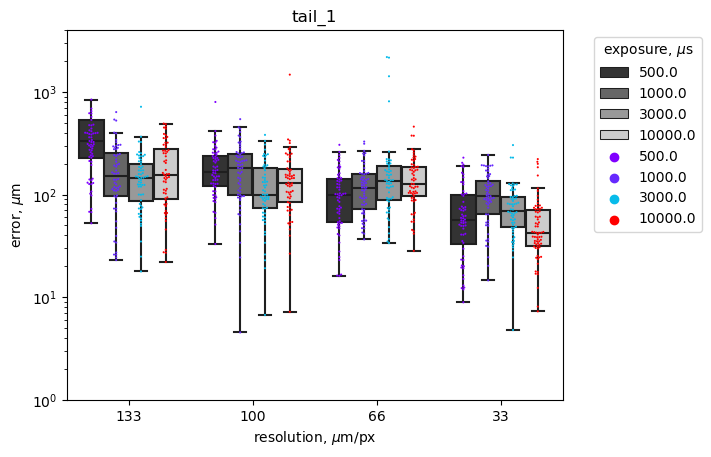

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


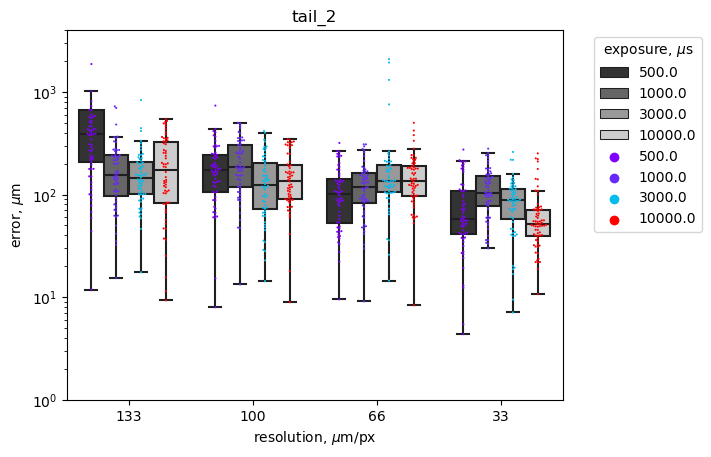

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 18.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


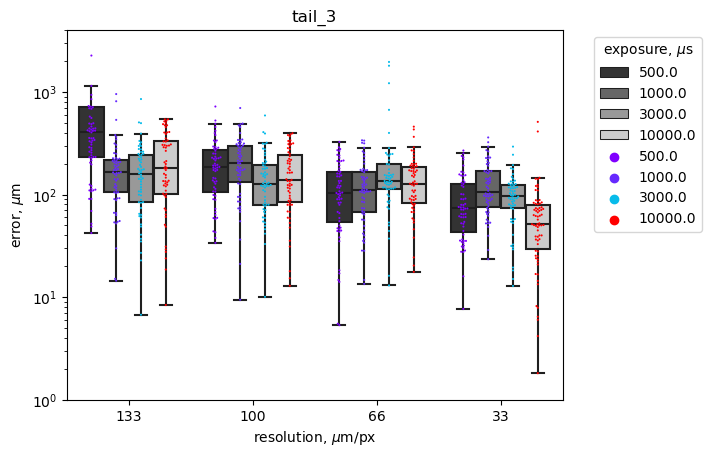

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 15.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


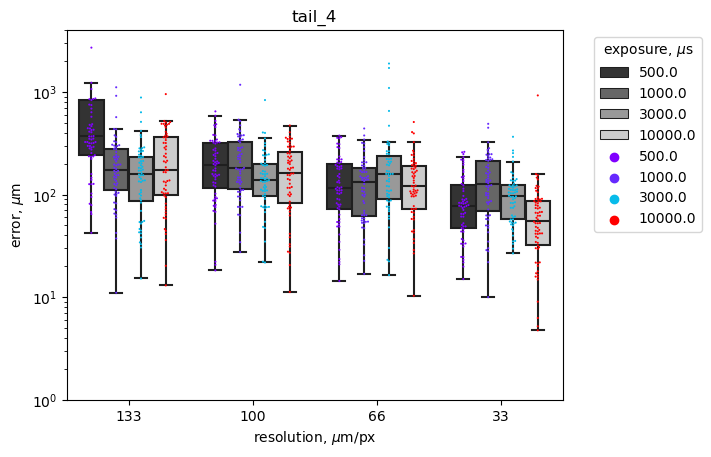

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


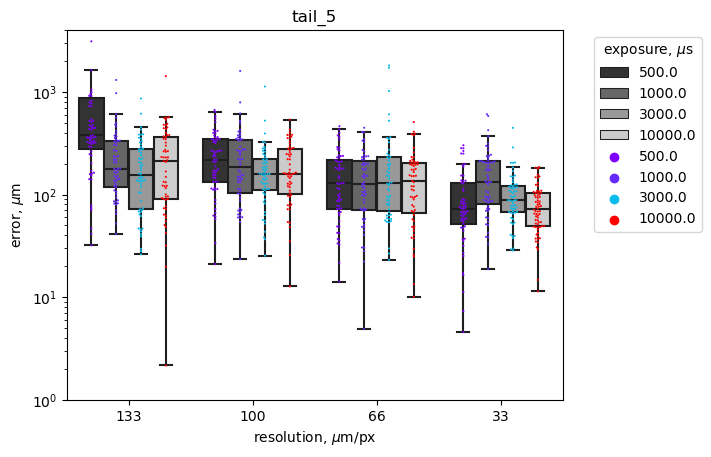

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


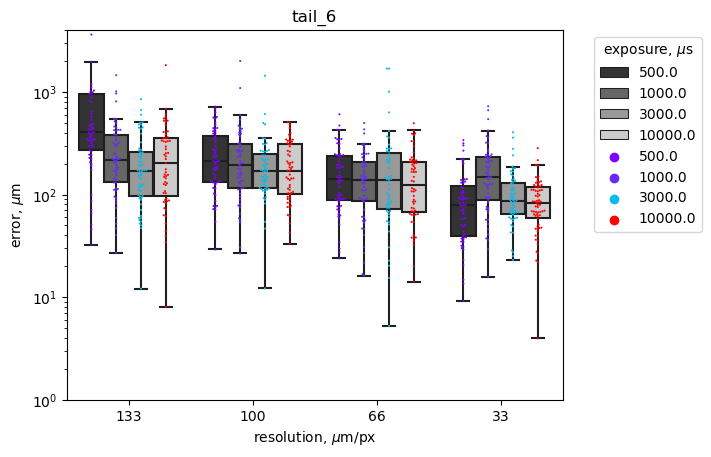

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


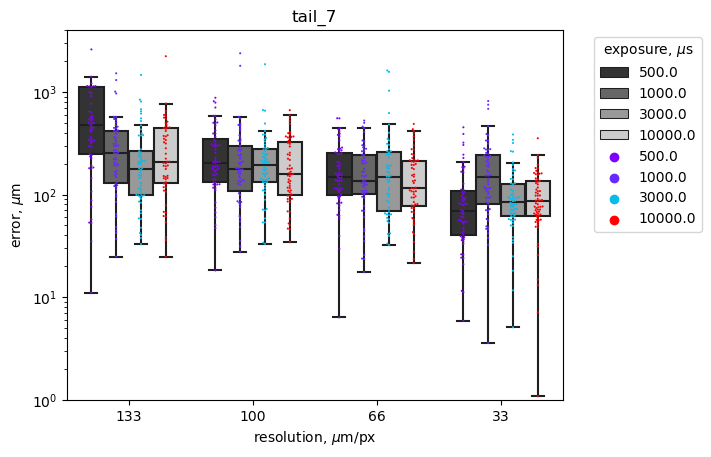

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


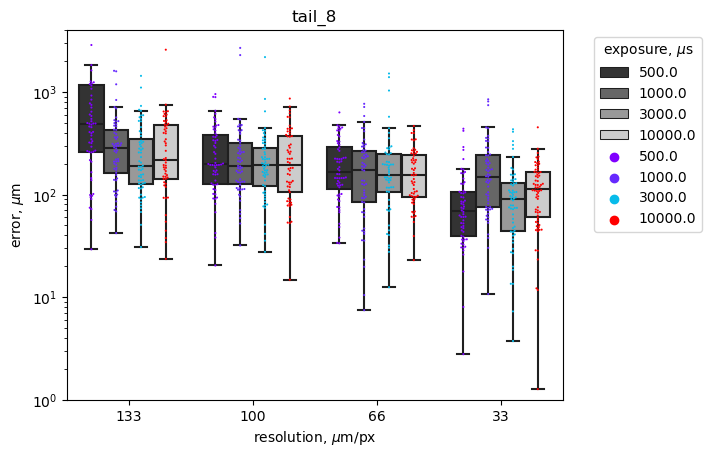

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


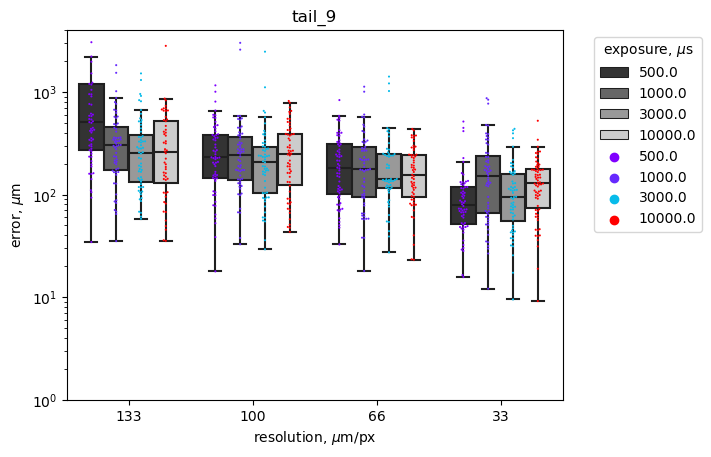

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


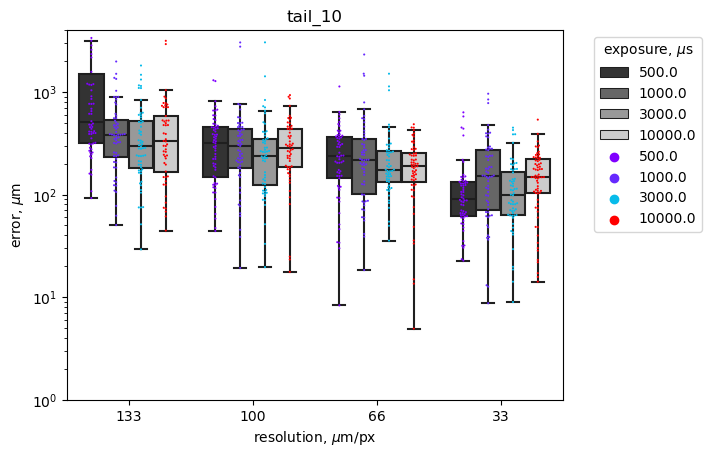

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the marke

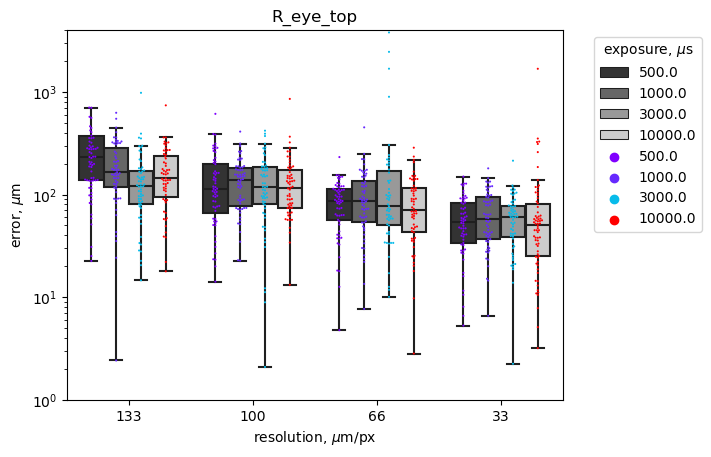

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.7% of the points cannot be placed; you may want to decrease the size of the marke

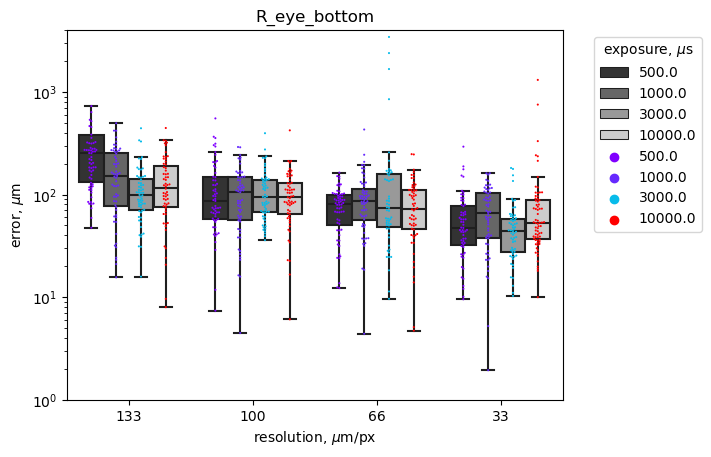

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 18.3% of the points cannot be placed; you may want to decrease the size of the mark

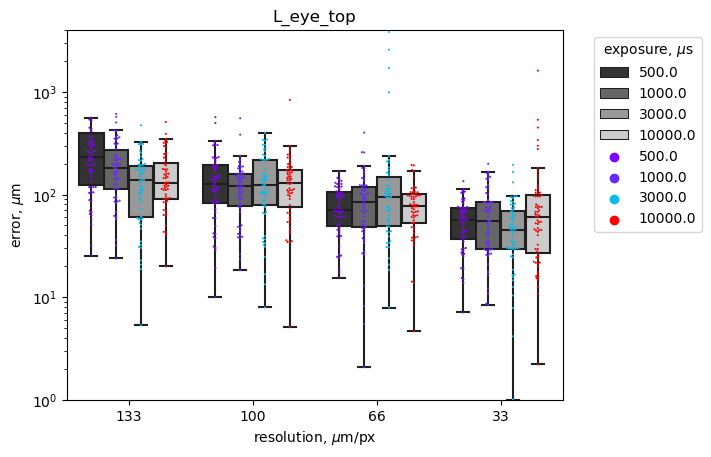

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the marke

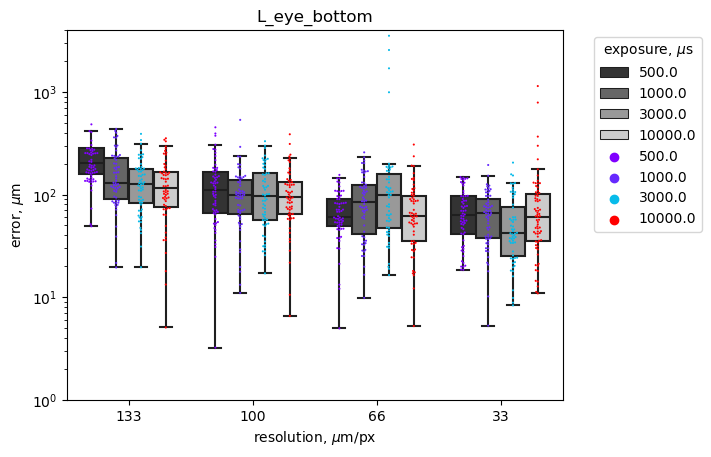

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 18.6% of the points cannot be placed; you may want to decrease the size of the mark

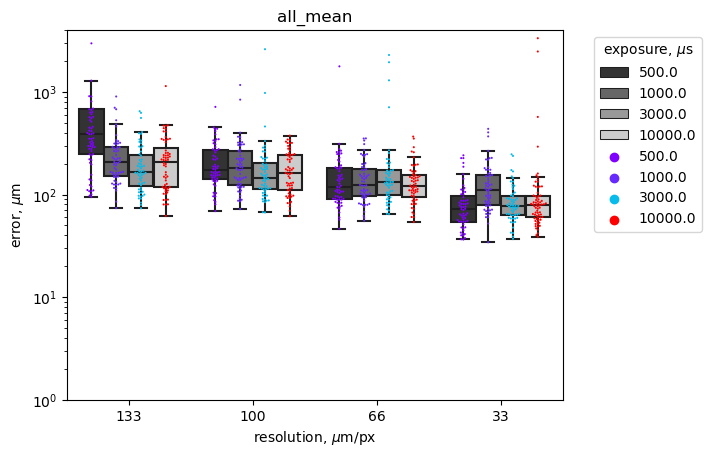

In [13]:
for DLC_network, DLC_suffix in DLC_nx_suffixes.items():
    for keypt in ['swim_bladder', 'tail_1',
       'tail_2', 'tail_3', 'tail_4', 'tail_5', 'tail_6', 'tail_7', 'tail_8',
       'tail_9', 'tail_10', 'R_eye_top', 'R_eye_bottom', 'L_eye_top',
       'L_eye_bottom', 'all_mean']:

        network_mask = full_DLC_error_df['method'] == DLC_network
        sns.boxplot(data=full_DLC_error_df[network_mask], x='resolution', y=keypt, hue='exposure', palette='grey', dodge=True, fliersize=0, label='_Hidden')
        sns.swarmplot(data=full_DLC_error_df[network_mask], x='resolution', y=keypt, hue='exposure', palette='rainbow', dodge=True, size=1.5)
        plt.xticks(ticks=[0,1,2,3], labels=[133, 100, 66, 33])
        plt.xlabel(r'resolution, $ \mu $m/px')
        plt.ylabel(r'error, $ \mu $m')
        plt.yscale('log')
        plt.legend(title='exposure, $ \mu $s', bbox_to_anchor=(1.05, 1.0))
        plt.ylim([1,4000])
        # plt.yticks(np.arange(500,3001,500))
        plt.title(keypt)
        if downsampled_flag:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+DLC_network+'_downsampled.svg'))
        else:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+DLC_network+'.svg'))
        plt.show()

## 1.2 - Compare SLEAP tracked data against annotated data - independent dataset

In [14]:
# SLEAP result file suffixes
SLEAP_nx_suffixes = {'SLEAP_UNet_simple': 'sim.pred', 'SLEAP_UNet_topdown': 'td.pred'}

In [15]:
for sleap_network, sleap_suffix in SLEAP_nx_suffixes.items():
    # code to get only the SLEAP results from the frames that were annotated
    for video_name, frames_to_get in video_frames_to_get.items():
        sleap_results_list = glob.glob(os.path.join(path_to_videos,'**','*'+sleap_suffix+'.h5'))
        for sleap_result in sleap_results_list:
            if video_name in sleap_result:
                print(video_name)
                print(frames_to_get)
                print("video {} is in sleap_result {}".format(video_name, sleap_result))
                
                frames_df = sleap_to_dlc_format(sleap_result, indices=frames_to_get)
                frames_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+sleap_network+'.csv'))

CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1
[0, 118, 548, 1039, 2061, 2069, 2072, 2898, 2901, 2903]
video CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1 is in sleap_result D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-500\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1.sim.pred.h5
CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_4
[1297, 2123, 2124, 2126, 2127, 2128, 2130, 2131, 2134, 2146]
video CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_4 is in sleap_result D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-500\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_4.sim.pred.h5
CLAS-Batch-1-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-9-40-42_well_2
[611, 757, 759, 1499, 2001, 2005, 2007, 2019, 2028, 2044]
video CLAS-Batch-1-Trial-2-FPS-2

In [16]:
if 'full_SLEAP_error_df' in globals().keys():
    del full_SLEAP_error_df

In [17]:
resolution = {1: 133, 2: 100, 3: 66, 4: 33}
for sleap_network, sleap_suffix in SLEAP_nx_suffixes.items():
    for video in videos_list: 
        # load the annotations and dlc tracking results files 
        annotation_path = glob.glob(os.path.join(video, '*LAS-TM-CL.csv'))[0]
        annotations_df = pd.read_csv(annotation_path, header=[0,1,2])

        video_name = os.path.split(video)[-1]
        if 'CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_4' not in video_name:
            sleap_df = pd.read_csv(os.path.join(path_to_verif_frames, video_name+'_'+sleap_network+'.csv'), header=[0,1])

            annot_lvl = annotations_df.columns.get_level_values(0)[-1]

            #  order keypoints nicely
            keypoints = np.unique(annotations_df.columns.get_level_values(1)[3:])
            keypoints = keypoints[[4,5,7,8,9,10,11,12,13,14,6,3,2,1,0]]

            res, exp = get_metadata_from_video_name(video_name)
            error = {'video_name': [video_name]*len(sleap_df), 'resolution' : np.ones((len(sleap_df),))*res, 'exposure': np.ones((len(sleap_df),))*exp}
            
            for keypoint in keypoints:
                if downsampled_flag:
                    if res <=3:
                        divider = {3: 2.03, 2: 2.99, 1: 3.925}
                        MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')]/divider[res] - sleap_df.loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                    if res == 4:
                        MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - sleap_df.loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                else:
                    MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - sleap_df.loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                
                MSE = MSE * resolution[res]
                error.update({keypoint: MSE})
            
            error_df = pd.DataFrame(error)
            error_df['all_mean'] = error_df[keypoints].mean(axis=1)
            error_df['all_std'] = error_df[keypoints].mean(axis=1)
            error_df['method'] = sleap_network

            error_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+sleap_network+'_ERROR.csv'))

            if 'full_SLEAP_error_df' in globals().keys():
                full_SLEAP_error_df = pd.concat((full_SLEAP_error_df, error_df), ignore_index=True)
            else:
                full_SLEAP_error_df = error_df

full_SLEAP_error_df.replace(0,np.nan, inplace=True)

In [18]:
full_SLEAP_error_df.describe()

,resolution,exposure,swim_bladder,tail_1,tail_2,tail_3,tail_4,tail_5,tail_6,tail_7,tail_8,tail_9,tail_10,R_eye_top,R_eye_bottom,L_eye_top,L_eye_bottom,all_mean,all_std
count,1938.000000,1938.000000,1816.000000,1826.000000,1807.000000,1800.000000,1800.000000,1786.000000,1781.000000,1769.000000,1750.000000,1714.000000,1669.000000,1789.000000,1804.000000,1797.000000,1810.000000,1841.000000,1841.000000
mean,2.515996,3693.498452,108.898299,178.480440,129.843396,139.612695,162.450406,183.966955,202.543329,227.114121,272.558026,263.544442,324.472640,182.762115,161.393073,169.153150,164.673074,184.082646,184.082646
std,1.123275,3834.464400,524.802139,944.482642,438.626141,160.612239,173.129272,174.956451,219.448828,230.229690,871.173117,265.741550,482.010187,656.944219,345.770536,432.347400,337.959734,204.041131,204.041131
min,1.000000,500.000000,0.504211,2.554562,2.865513,3.570993,3.247313,1.502962,2.807837,1.031942,1.844968,4.126832,4.362219,2.567273,0.944426,0.769580,1.973960,13.089889,13.089889
25%,2.000000,1000.000000,37.132342,44.815198,52.627460,62.859131,70.842838,83.642371,81.022468,87.715743,98.736105,104.199613,119.842111,55.330180,48.387186,55.727225,50.817526,104.238891,104.238891
50%,3.000000,3000.000000,59.394997,75.873924,85.936810,108.453495,130.696936,148.572321,159.972080,176.372759,186.864658,200.243897,218.903506,99.786911,82.096922,103.472126,93.920451,149.089406,149.089406
75%,4.000000,10000.000000,90.591784,125.513229,138.445668,168.352179,208.874179,241.007978,259.838878,306.599621,328.935144,357.293457,421.850857,213.716335,232.899977,215.371843,215.293704,207.168590,207.168590
max,4.000000,10000.000000,14539.147502,17176.458316,17176.112598,2331.899535,2637.270956,3154.157160,3677.178903,4215.185653,25034.139991,4839.826334,14252.556522,14649.096772,11764.080543,11368.700787,11294.465155,3178.765361,3178.765361


c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


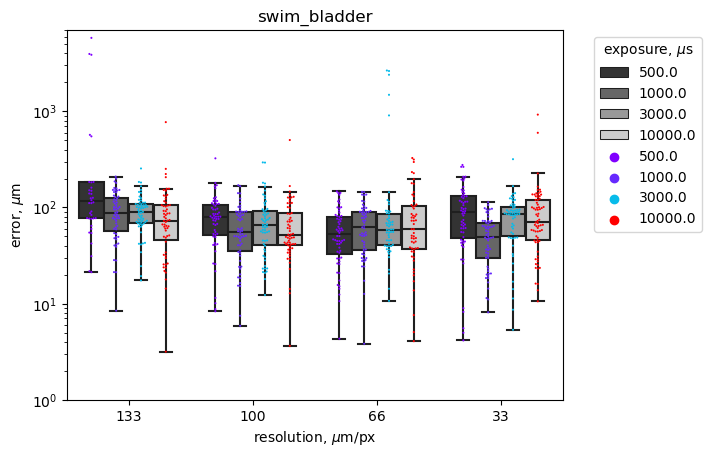

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


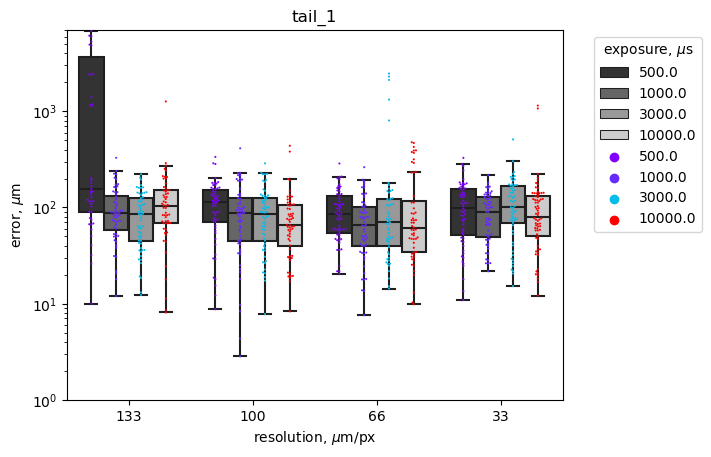

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


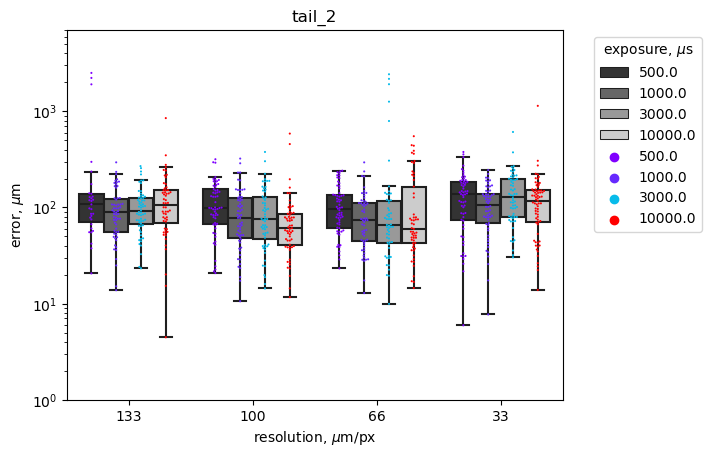

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


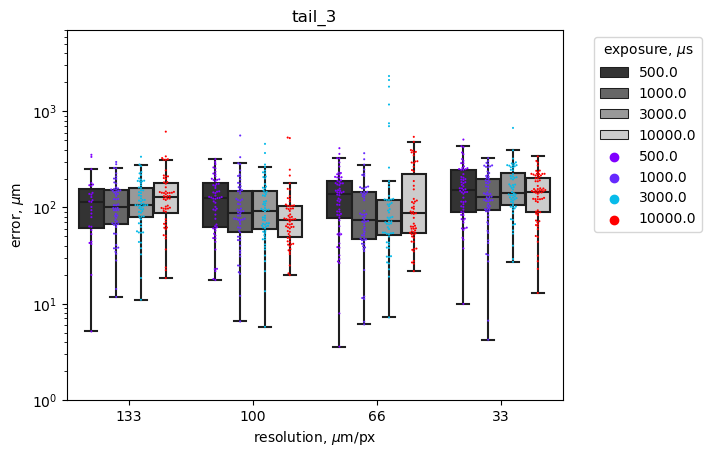

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


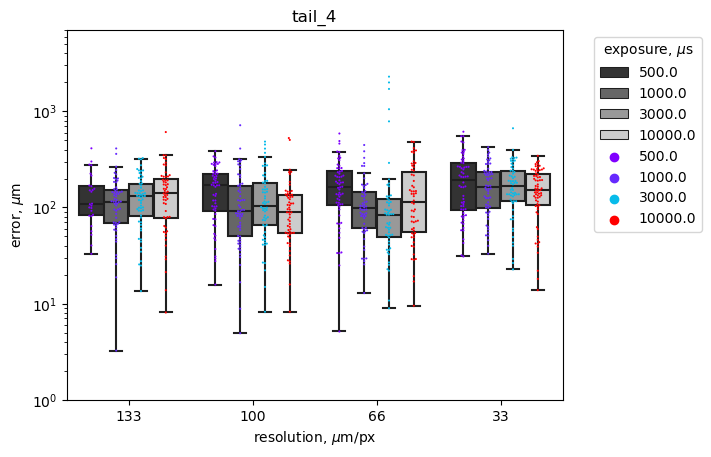

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


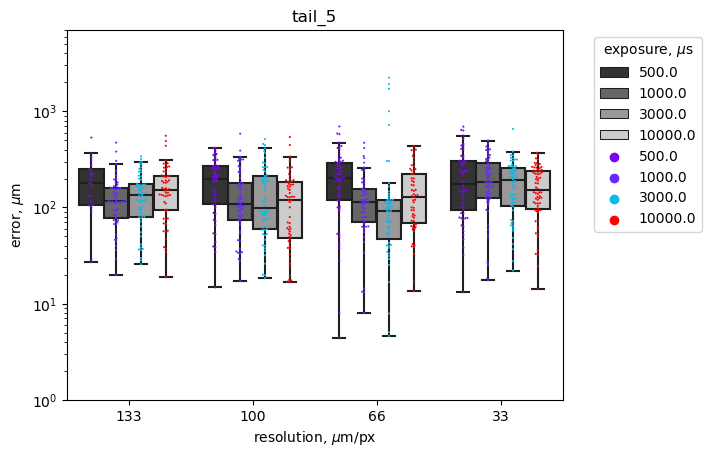

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


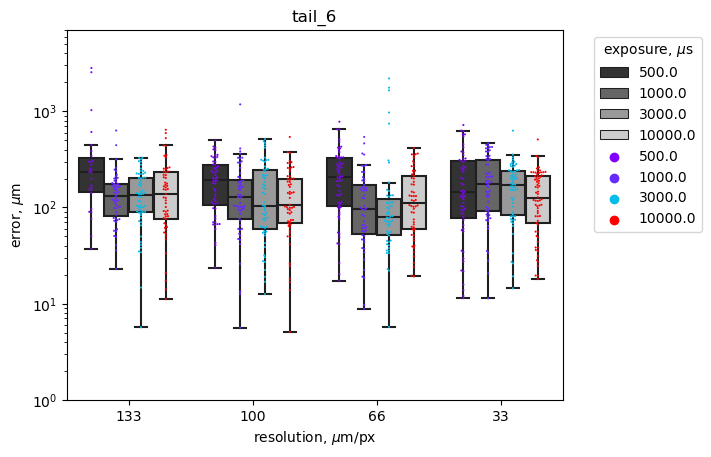

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


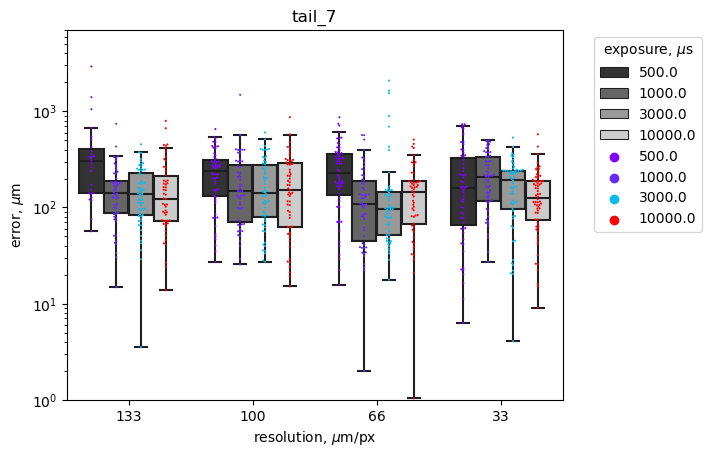

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


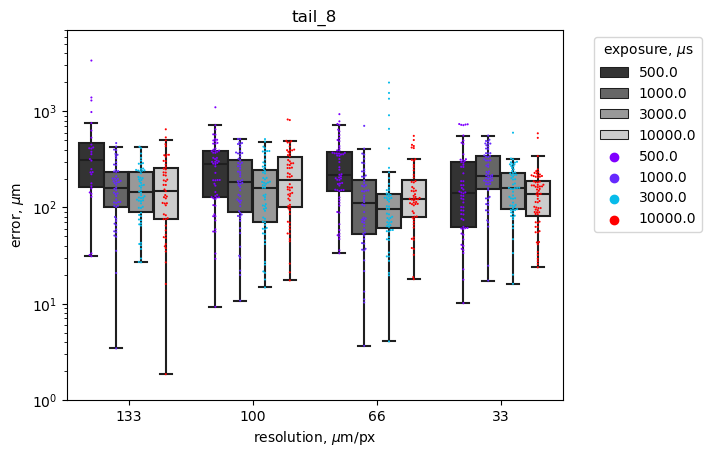

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


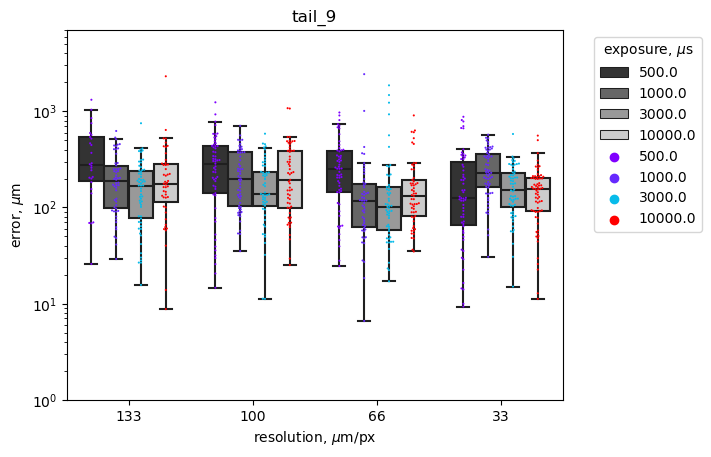

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


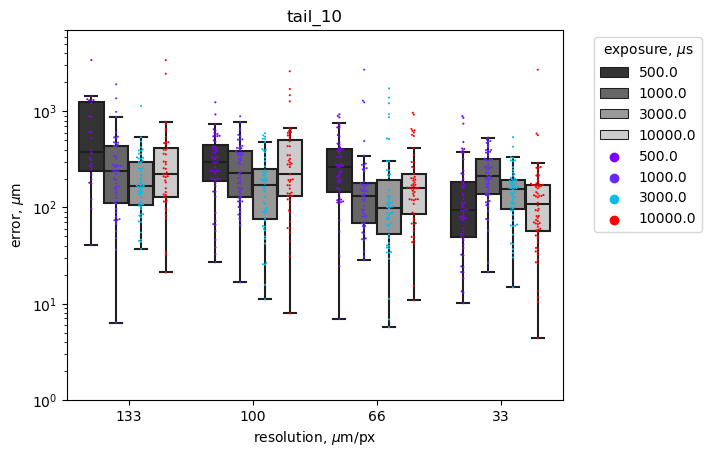

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


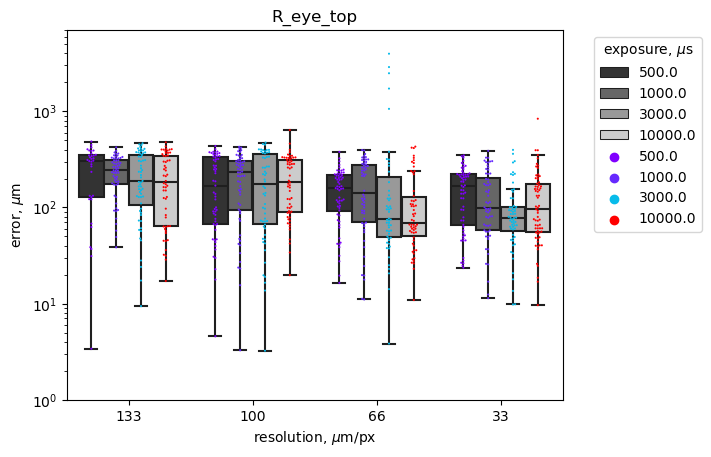

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


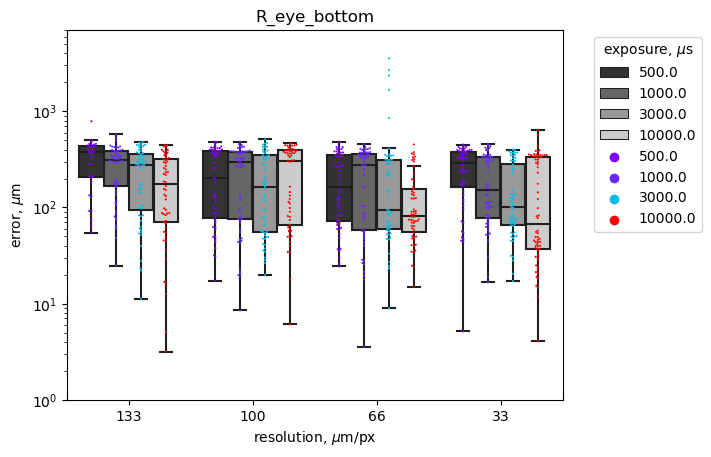

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


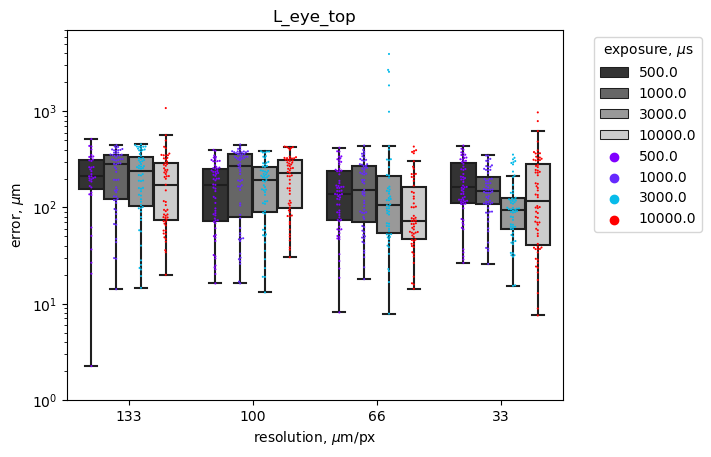

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


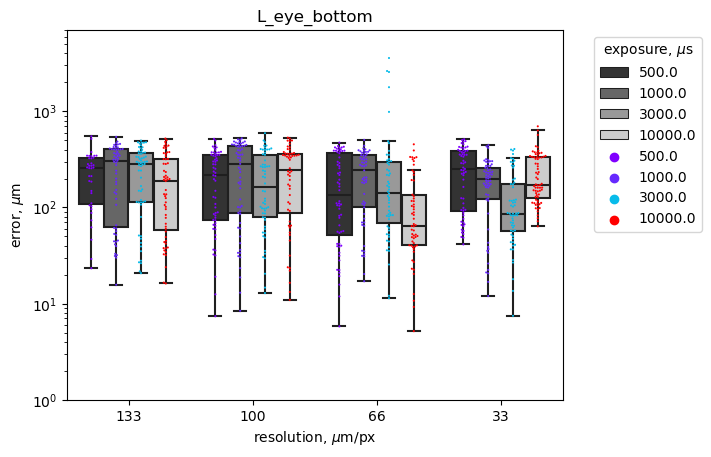

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


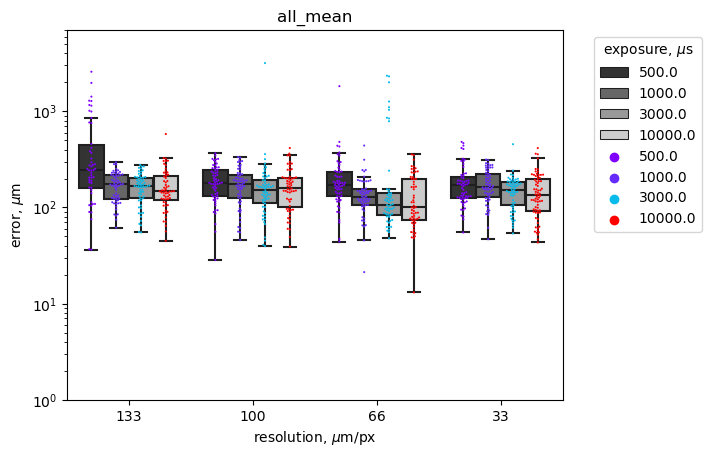

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


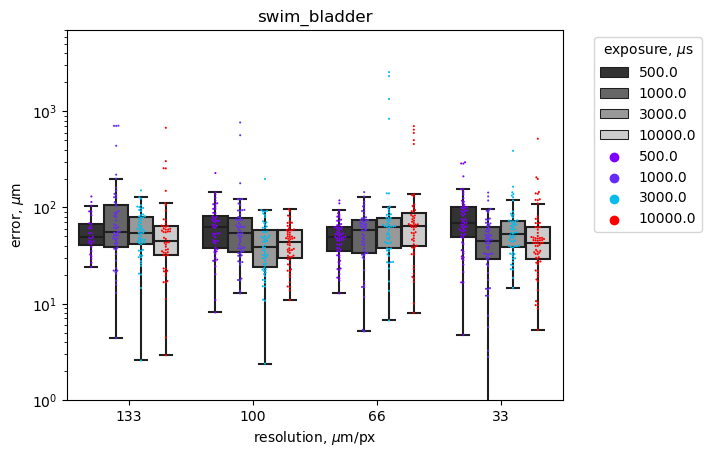

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


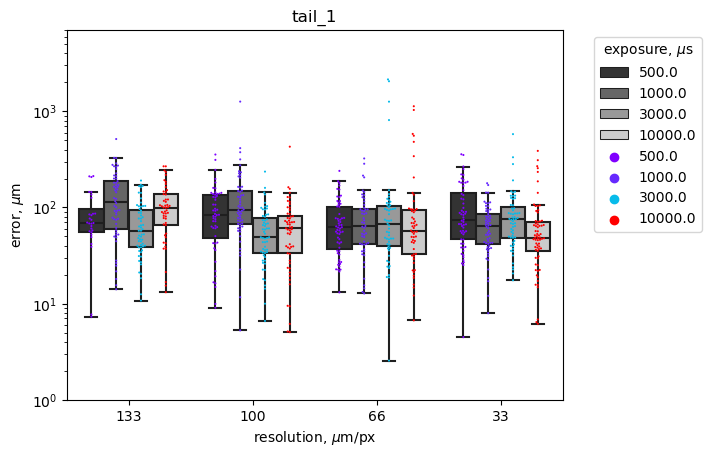

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


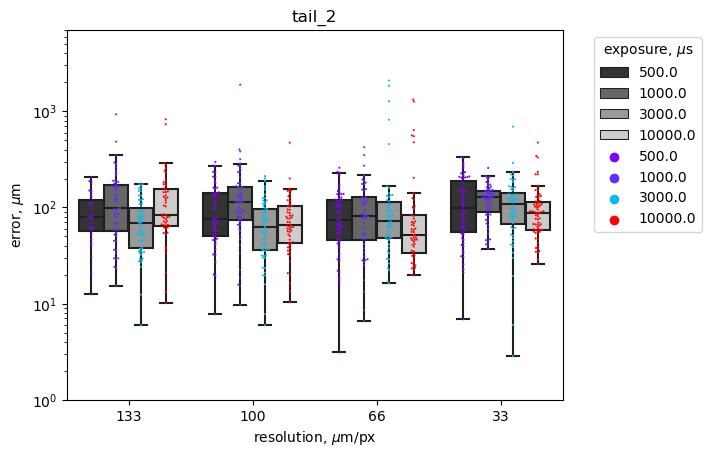

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


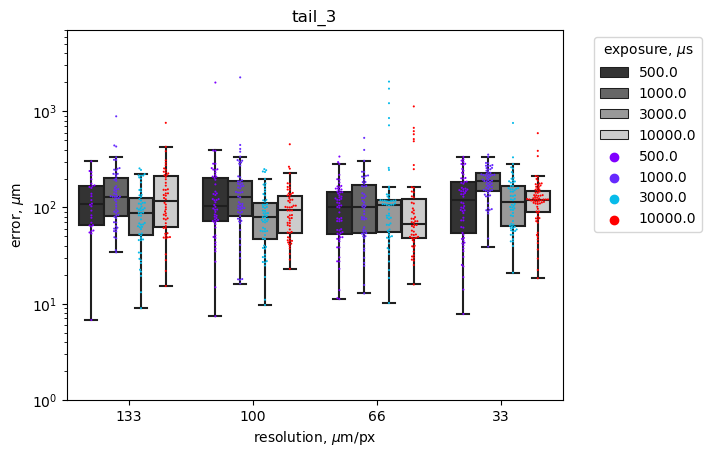

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


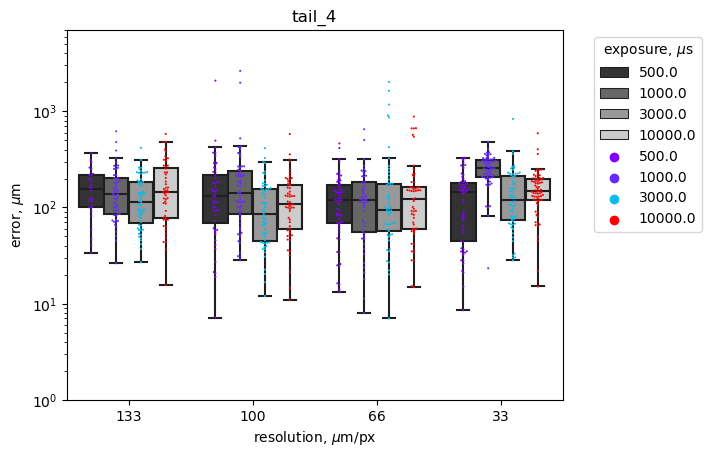

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


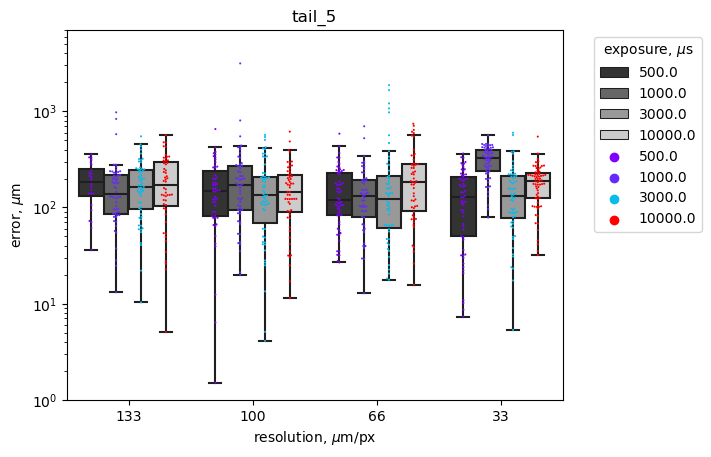

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


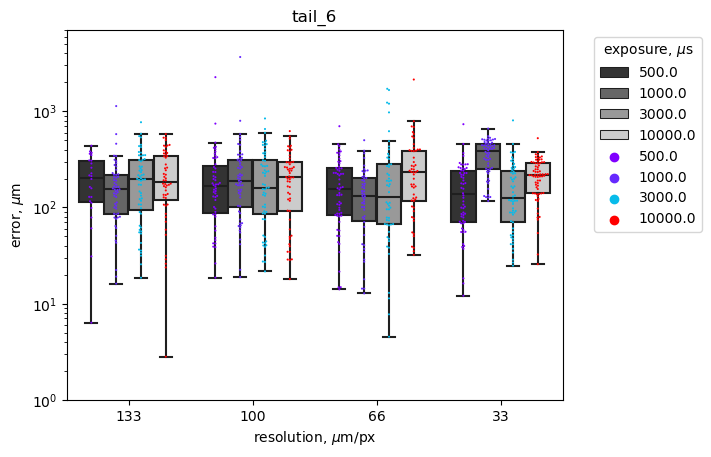

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


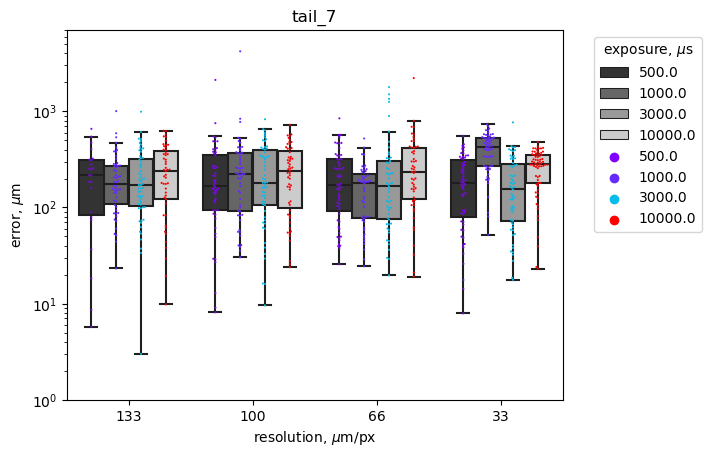

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


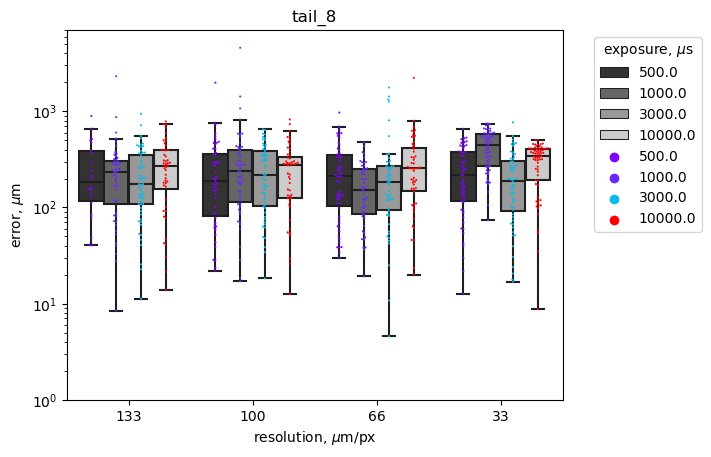

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


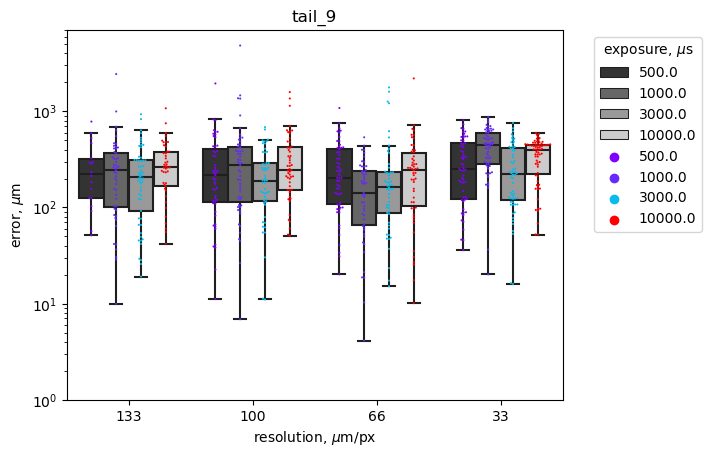

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


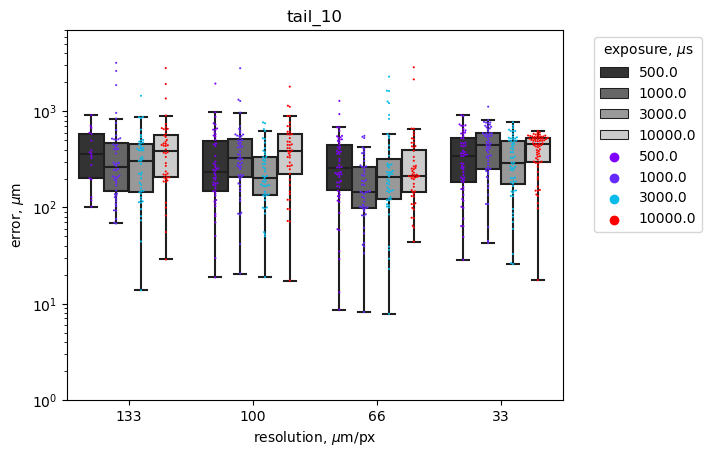

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


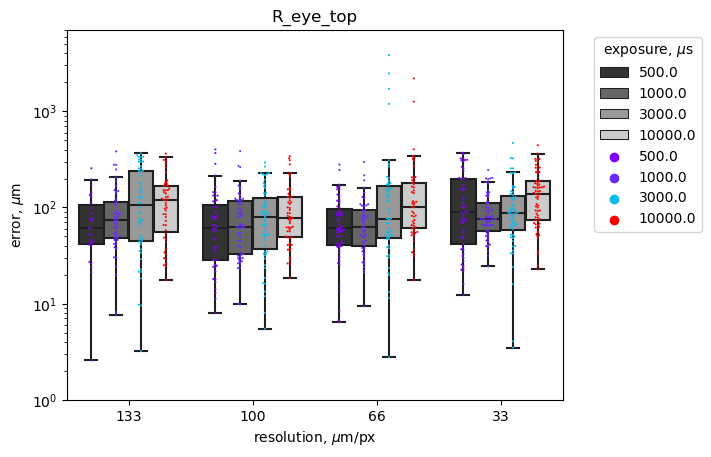

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


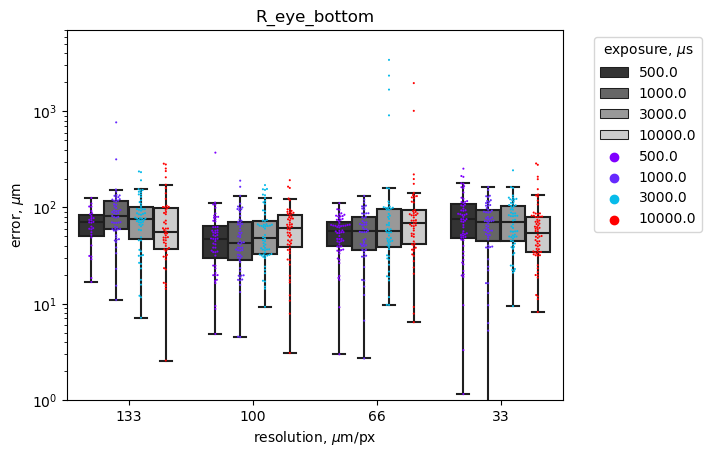

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


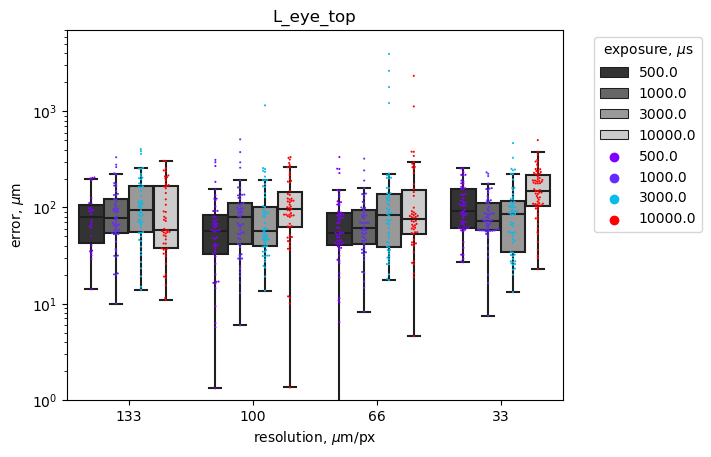

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


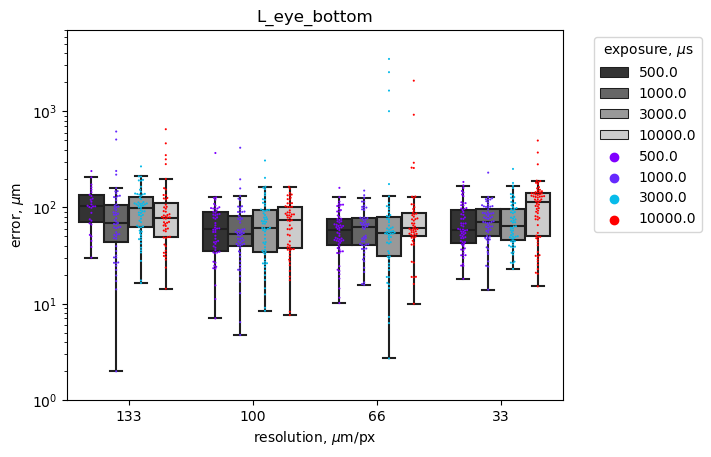

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


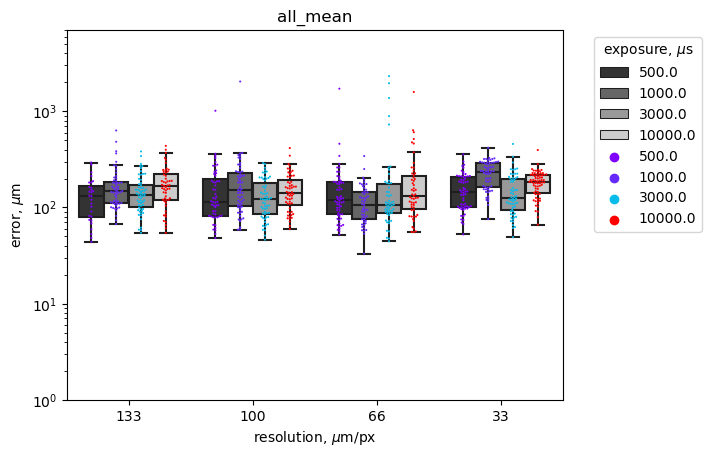

In [19]:
for sleap_network, sleap_suffix in SLEAP_nx_suffixes.items():
    for keypt in ['swim_bladder', 'tail_1',
       'tail_2', 'tail_3', 'tail_4', 'tail_5', 'tail_6', 'tail_7', 'tail_8',
       'tail_9', 'tail_10', 'R_eye_top', 'R_eye_bottom', 'L_eye_top',
       'L_eye_bottom', 'all_mean']:

        network_mask = full_SLEAP_error_df['method'] == sleap_network

        sns.boxplot(data=full_SLEAP_error_df[network_mask], x='resolution', y=keypt, hue='exposure', palette='grey', dodge=True, fliersize=0, label='_Hidden')
        plt.legend().remove()
        sns.swarmplot(data=full_SLEAP_error_df[network_mask], x='resolution', y=keypt, hue='exposure', palette='rainbow', dodge=True, size=1.5)
        plt.xticks(ticks=[0,1,2,3], labels=[133, 100, 66, 33])
        plt.xlabel(r'resolution, $ \mu $m/px')
        plt.ylabel(r'error, $ \mu $m')
        plt.legend(title='exposure, $ \mu $s', bbox_to_anchor=(1.05, 1.0))
        plt.ylim([1,7000])
        plt.yscale('log')
        plt.title(keypt)
        if downsampled_flag:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+sleap_network+'_downsampled.svg'))
        else:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+sleap_network+'_.svg'))
        plt.show()

In [20]:
error_methods_df = pd.concat((full_SLEAP_error_df, full_DLC_error_df))

In [21]:
if downsampled_flag:
    error_methods_df_DS.to_hdf(os.path.join(path_to_videos, 'DSAMPLED_error_tracking_methods_202505.h5'), key='error_methods_df')
if not downsampled_flag:
    error_methods_df.to_hdf(os.path.join(path_to_videos, 'error_tracking_methods_202505.h5'), key='error_methods_df')

### 2 - Run euclidean distance computations for downsampled dataset

In [22]:
downsampled_flag = True
path_to_verif_frames = r"D:\DLC_Paper\DLC_TestsDS\labeled-data"
path_to_videos = r"D:\DLC_Paper\DLC_TestsDS"

In [23]:
videos_list = glob.glob(os.path.join(path_to_verif_frames,'**'))
videos_list = [video for video in videos_list if os.path.isdir(video)]
pprint(videos_list[:10])

['D:\\DLC_Paper\\DLC_TestsDS\\labeled-data\\CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-41-56_well_1',
 'D:\\DLC_Paper\\DLC_TestsDS\\labeled-data\\CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-2-STIM-FLASH--2024-9-3-15-41-56_well_1',
 'D:\\DLC_Paper\\DLC_TestsDS\\labeled-data\\CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-3-STIM-FLASH--2024-9-3-15-41-56_well_1',
 'D:\\DLC_Paper\\DLC_TestsDS\\labeled-data\\CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-4-STIM-FLASH--2024-9-3-15-41-56_well_1',
 'D:\\DLC_Paper\\DLC_TestsDS\\labeled-data\\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1',
 'D:\\DLC_Paper\\DLC_TestsDS\\labeled-data\\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-15-41-56_well_1',
 'D:\\DLC_Paper\\DLC_TestsDS\\labeled-data\\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-15-41-56_well_2',
 'D:\\DLC_Paper\\DLC_TestsDS\\l

In [24]:
video_frames_to_get = dict()
for video in videos_list: 
    video_name = os.path.split(video)[-1]
    selected_frames = glob.glob(os.path.join(video,'*.png'))
    frames_list = []
    for frame in selected_frames:
        frame_num = int(re.findall('\d+', frame)[-1])
        frames_list.extend([frame_num])
    video_frames_to_get.update({video_name: frames_list})

pprint(video_frames_to_get)

{'CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-41-56_well_1': [1418,
                                                                                                  1419,
                                                                                                  1420,
                                                                                                  2001,
                                                                                                  2014,
                                                                                                  2015,
                                                                                                  2016,
                                                                                                  2461,
                                                                                                  2944,
                                                                

In [25]:
for DLC_network, DLC_suffix in DLC_nx_suffixes.items():
    for video_name, frames_to_get in video_frames_to_get.items():
        dlc_results_list = glob.glob(os.path.join(path_to_videos,'**','*'+DLC_suffix+'.h5'))
        for dlc_result in dlc_results_list:
            if video_name in dlc_result:
                print(video_name)
                print(frames_to_get)
                result_df = pd.read_hdf(dlc_result)
                frames_df = result_df.iloc[frames_to_get,:]
                frames_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+DLC_network+'.csv'))


CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-41-56_well_1
[1418, 1419, 1420, 2001, 2014, 2015, 2016, 2461, 2944, 2946]
CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-2-STIM-FLASH--2024-9-3-15-41-56_well_1
[1418, 1419, 1420, 2001, 2014, 2015, 2016, 2461, 2944, 2946]
CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-3-STIM-FLASH--2024-9-3-15-41-56_well_1
[1418, 1419, 1420, 2001, 2014, 2015, 2016, 2461, 2944, 2946]
CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-4-STIM-FLASH--2024-9-3-15-41-56_well_1
[1418, 1419, 1420, 2001, 2014, 2015, 2016, 2461, 2944, 2946]
CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1
[1749, 1750, 1752, 1757, 1760, 1764, 1768, 2196, 2197, 2205]
CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-15-41-56_well_1
[1581, 1582, 1583, 1584, 1585, 1586, 1587, 1588, 2003, 2008]
CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-TAP--2024-9-3-15-

## 2.1 - Compare DLC tracked data against annotated data - downsampled dataset

In [26]:
if 'full_DLC_error_df_DS' in globals().keys():
    del full_DLC_error_df_DS

In [27]:
resolution = {1: 133, 2: 100, 3: 66, 4: 33}

for DLC_network, DLC_suffix in DLC_nx_suffixes.items():
    for video in videos_list: 
        # load the annotations and dlc tracking results files 
        annotation_path = glob.glob(os.path.join(video, '*LAS-TM-CL.csv'))[0]
        annotations_df = pd.read_csv(annotation_path, header=[0,1,2])

        video_name = os.path.split(video)[-1]
        dlc_df = pd.read_csv(os.path.join(path_to_verif_frames, video_name+'_'+DLC_network+'.csv'), header=[0,1,2])

        annot_lvl = annotations_df.columns.get_level_values(0)[-1]
        dlc_lvl = dlc_df.columns.get_level_values(0)[-1]

        #  order keypoints nicely
        keypoints = np.unique(annotations_df.columns.get_level_values(1)[3:])
        keypoints = keypoints[[4,5,7,8,9,10,11,12,13,14,6,3,2,1,0]]

        res, exp = get_metadata_from_video_name(video_name)
        error = {'video_name': [video_name]*len(dlc_df), 'resolution' : np.ones((len(dlc_df),))*res, 'exposure': np.ones((len(dlc_df),))*exp}
        
        for keypoint in keypoints:
            if downsampled_flag:
                if res <=3:
                    divider = {3: 2.03, 2: 2.99, 1: 3.925}
                    MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')]/divider[res] - dlc_df[dlc_lvl].loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                if res == 4:
                    MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - dlc_df[dlc_lvl].loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
            else:
                MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - dlc_df[dlc_lvl].loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
            
            MSE = MSE * resolution[res]
            error.update({keypoint: MSE})
        
        error_df = pd.DataFrame(error)
        error_df['all_mean'] = error_df[keypoints].mean(axis=1)
        error_df['all_std'] = error_df[keypoints].mean(axis=1)
        error_df['method'] = DLC_network
        
        error_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+DLC_network+'_ERROR.csv'))

        if 'full_DLC_error_df_DS' in globals().keys():
            full_DLC_error_df_DS = pd.concat((full_DLC_error_df_DS, error_df), ignore_index=True)
        else:
            full_DLC_error_df_DS = error_df

full_DLC_error_df_DS.replace(0, np.nan, inplace=True)

In [28]:
full_DLC_error_df_DS.describe()

,resolution,exposure,swim_bladder,tail_1,tail_2,tail_3,tail_4,tail_5,tail_6,tail_7,tail_8,tail_9,tail_10,R_eye_top,R_eye_bottom,L_eye_top,L_eye_bottom,all_mean,all_std
count,2000.000000,2000.000000,1992.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,2.500000,3880.000000,147.820000,159.906179,179.524840,195.299448,214.272453,235.340538,245.210978,267.526833,286.786854,321.136490,362.972699,144.842845,138.985027,135.244397,132.550501,211.121920,211.121920
std,1.118314,3925.978433,379.503680,391.115627,550.371221,584.747806,618.807147,646.197533,573.062164,643.415143,665.280452,736.191852,777.072079,405.224156,419.881491,355.279033,342.345616,470.359990,470.359990
min,1.000000,500.000000,0.821594,4.780798,1.918590,1.814753,4.747707,4.590632,3.960853,1.082505,1.268841,7.368376,8.715778,2.241733,1.940148,0.198990,5.125207,34.260312,34.260312
25%,1.750000,1000.000000,73.414606,74.244075,80.883844,85.379851,85.765988,90.567086,95.949119,95.224139,104.962777,118.980239,134.502200,68.744661,62.623229,66.228993,68.086885,106.489513,106.489513
50%,2.500000,3000.000000,112.800411,124.662890,127.201697,132.985633,140.320710,151.803944,157.953572,168.899274,174.264501,197.915816,218.710227,113.000595,107.090396,107.300052,111.602331,147.782151,147.782151
75%,3.250000,10000.000000,170.793292,185.079411,195.079334,208.484339,217.022802,233.913033,254.072622,267.469238,286.412713,312.094709,357.088045,167.220601,164.836599,159.545501,160.310905,208.309077,208.309077
max,4.000000,10000.000000,14187.729051,14285.259119,15918.837211,15921.649376,15915.383390,15961.904873,13925.565165,12924.980817,12776.250837,12661.720425,12489.279464,13607.492156,13703.616209,13861.789930,14225.239182,13845.869260,13845.869260


c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 5.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


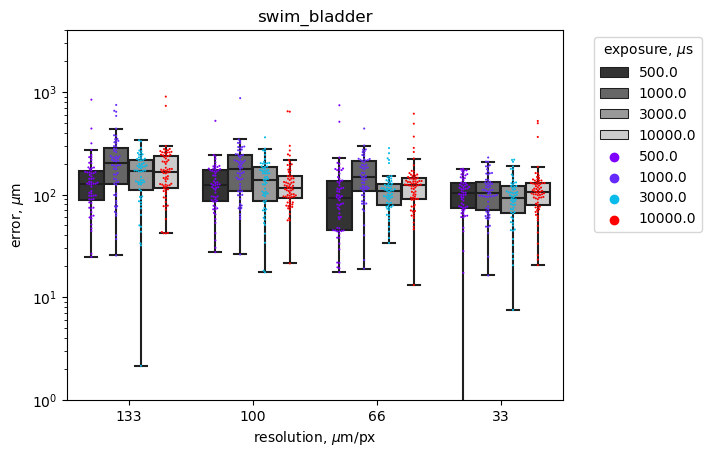

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


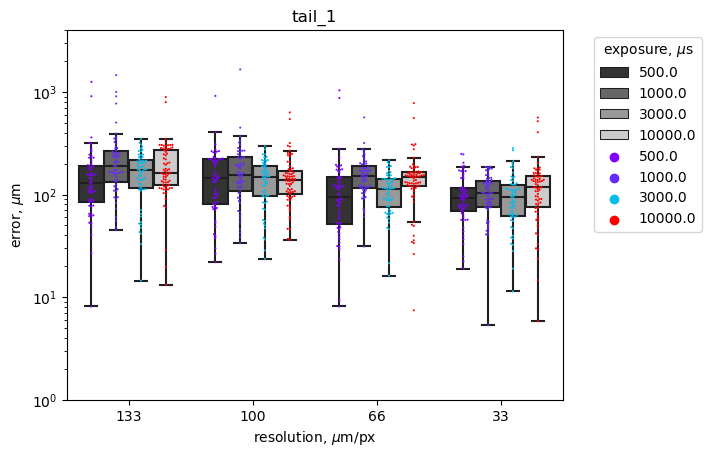

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


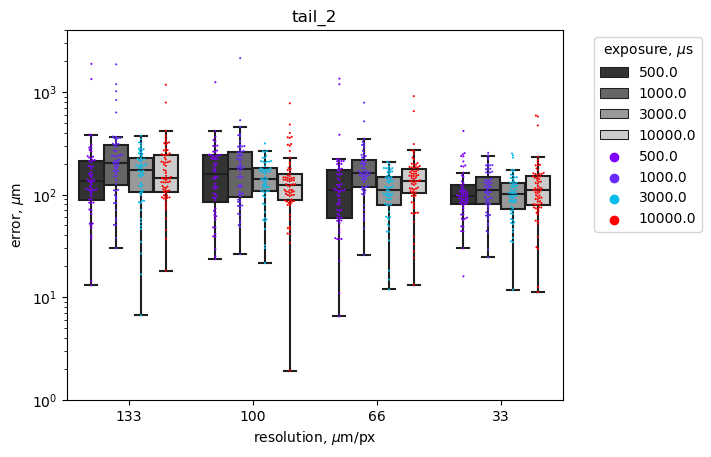

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


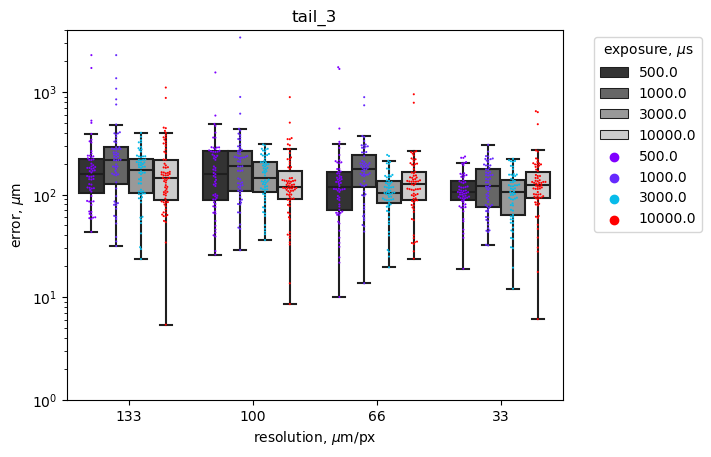

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


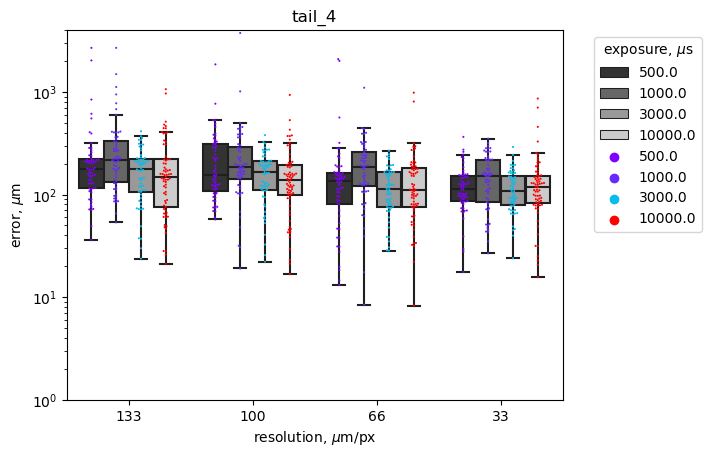

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


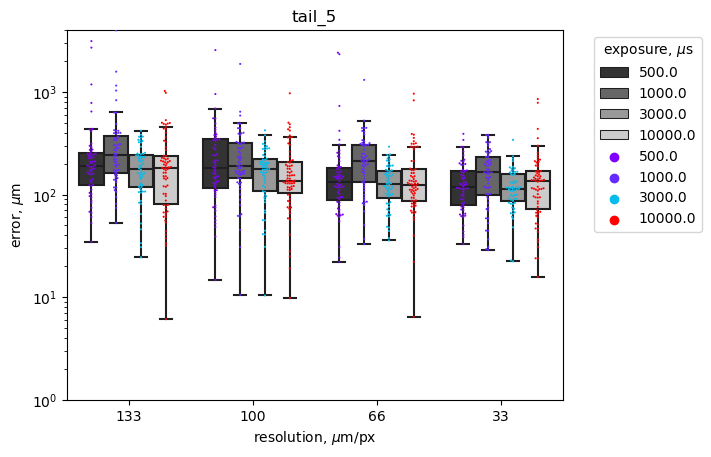

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


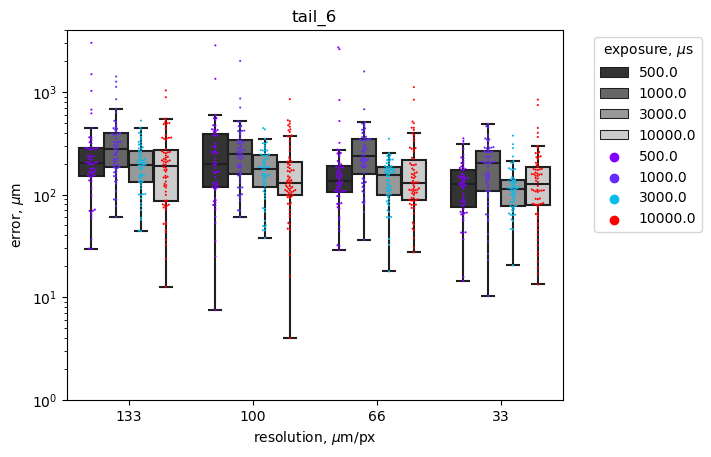

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


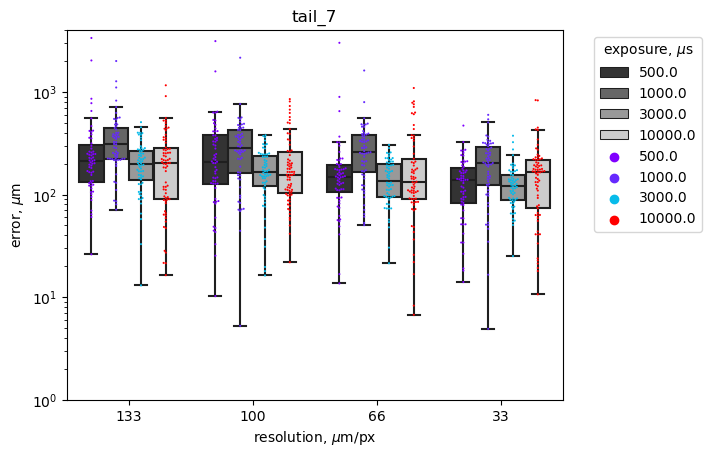

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


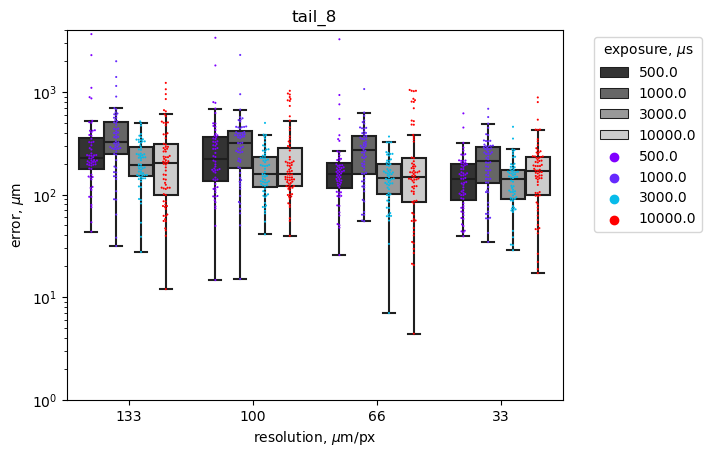

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


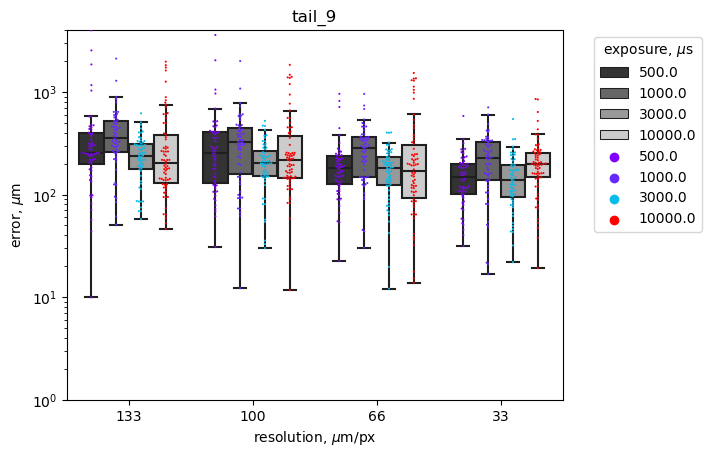

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


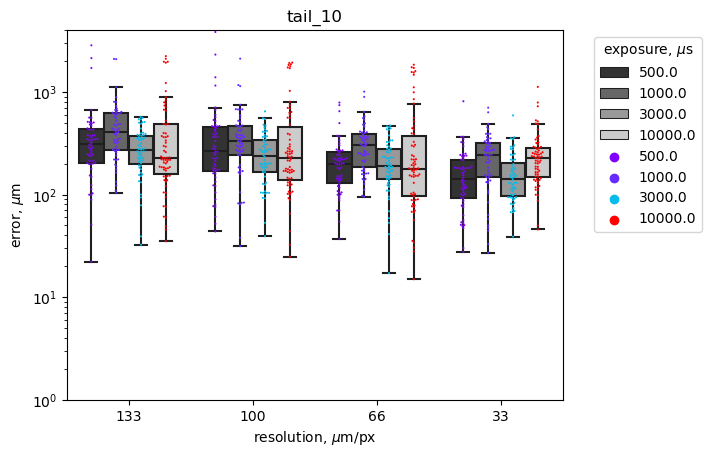

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


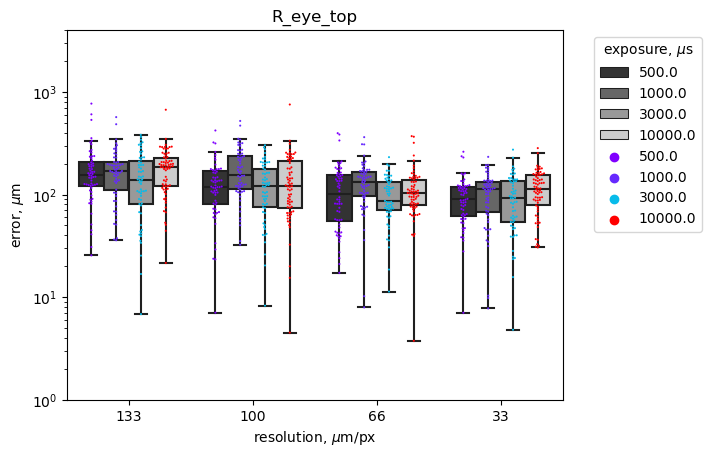

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


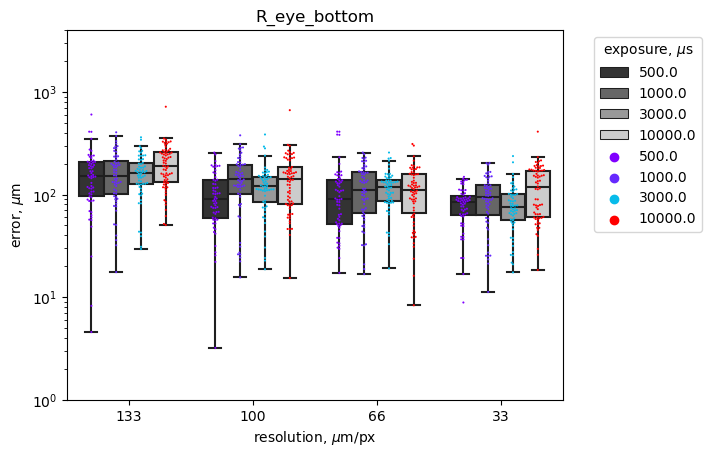

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


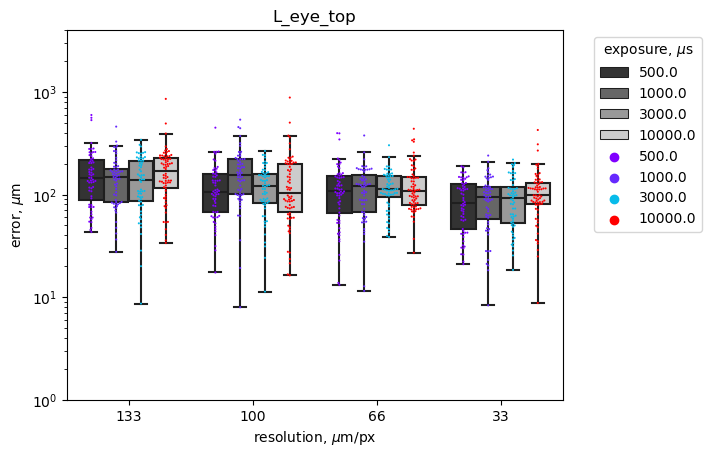

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


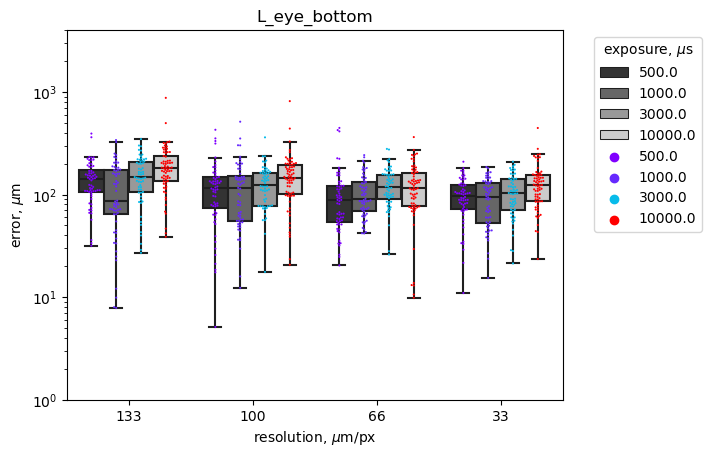

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


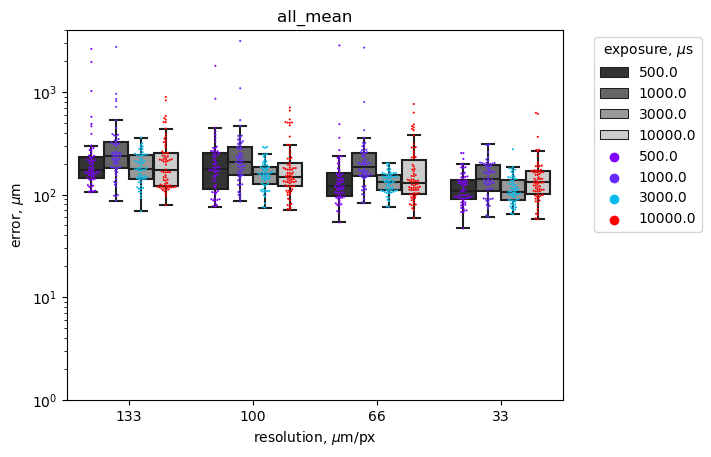

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


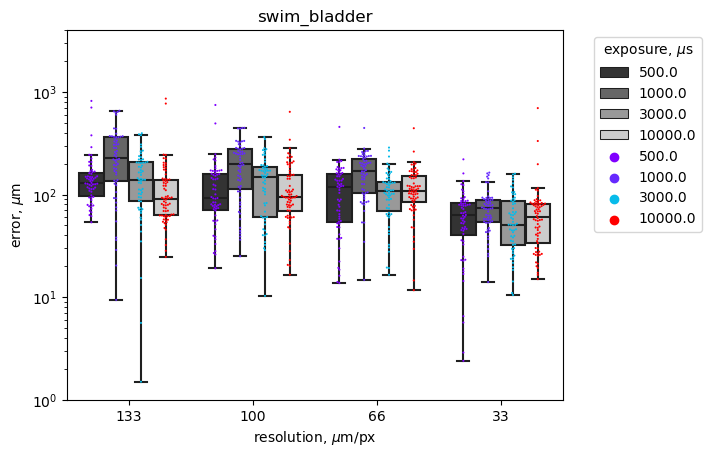

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


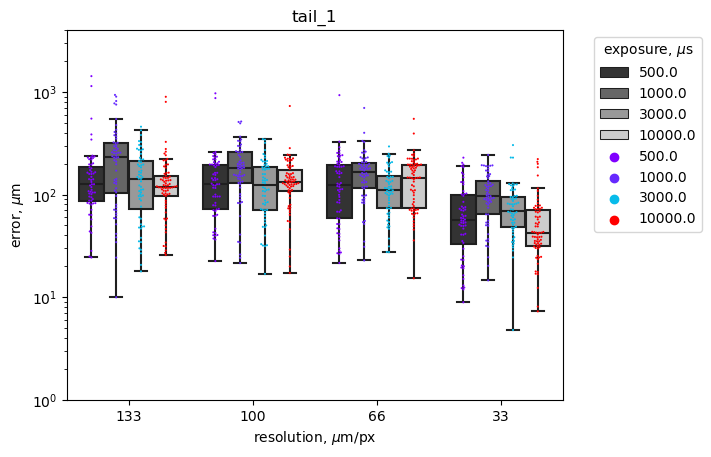

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 17.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


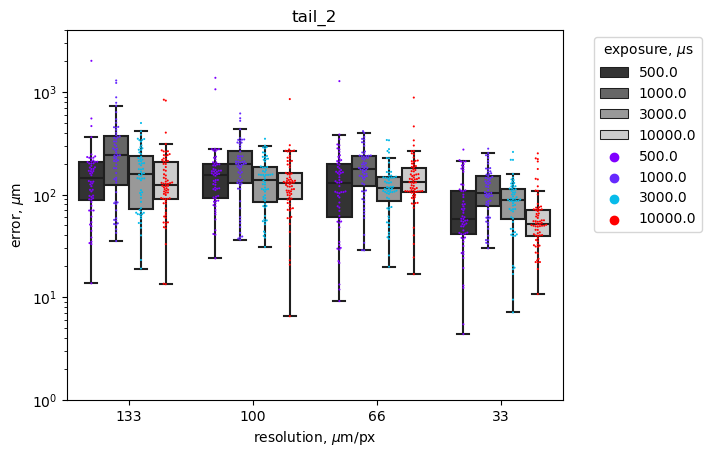

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 17.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


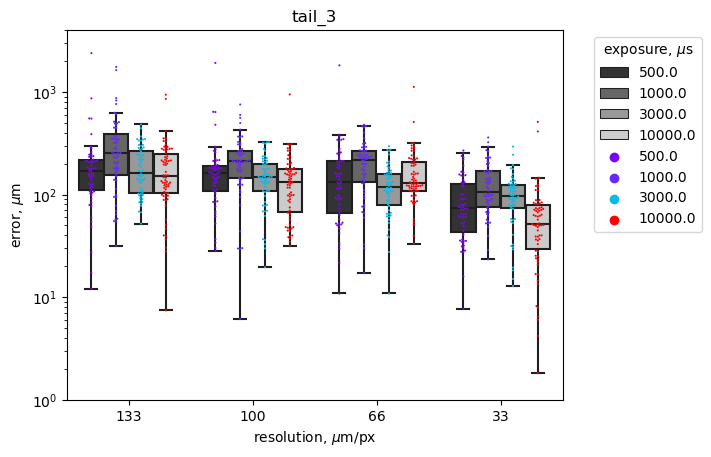

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


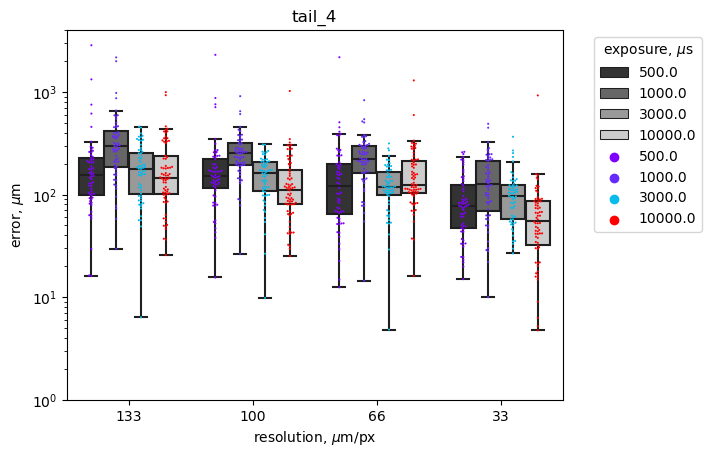

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


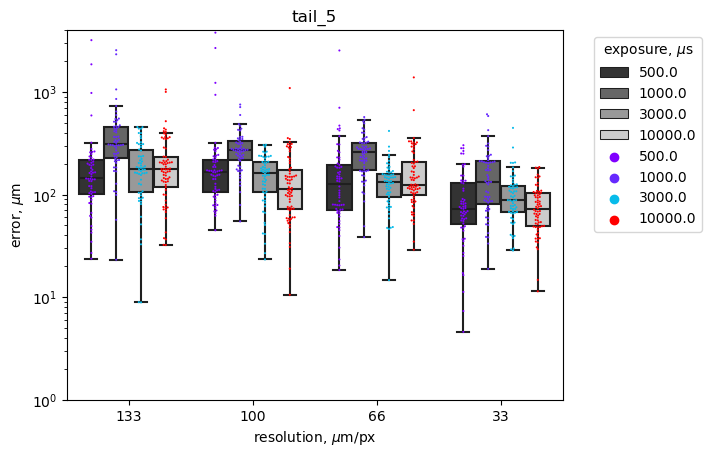

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


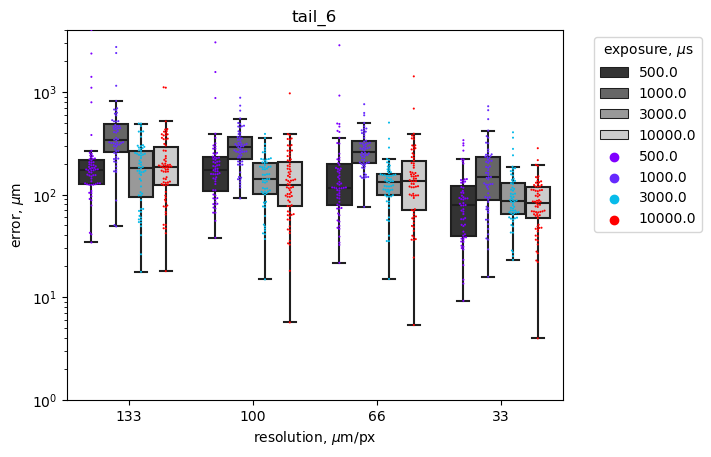

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


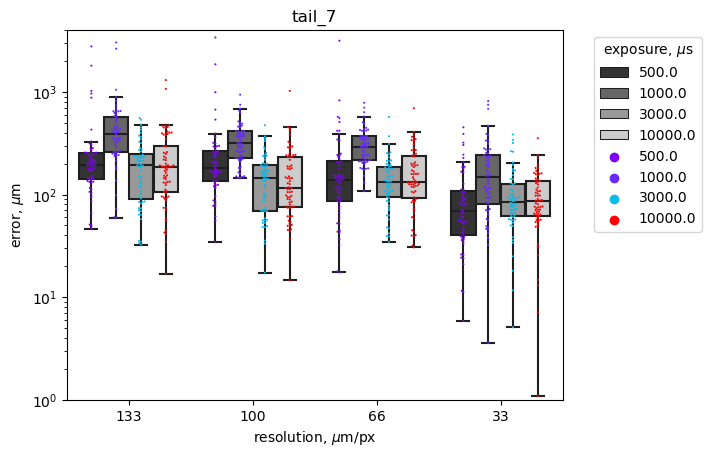

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


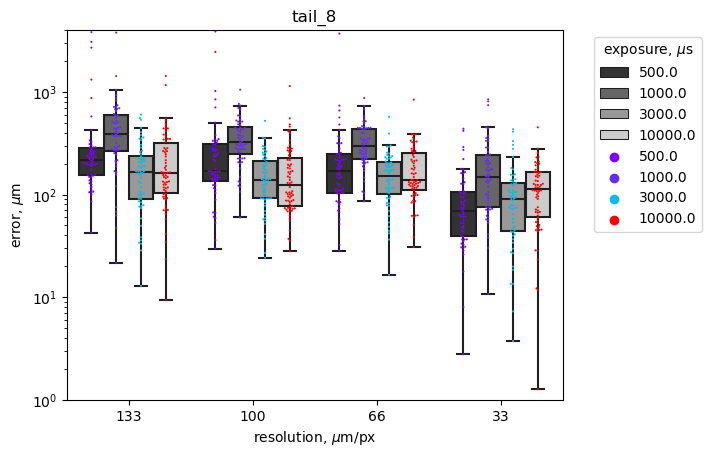

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


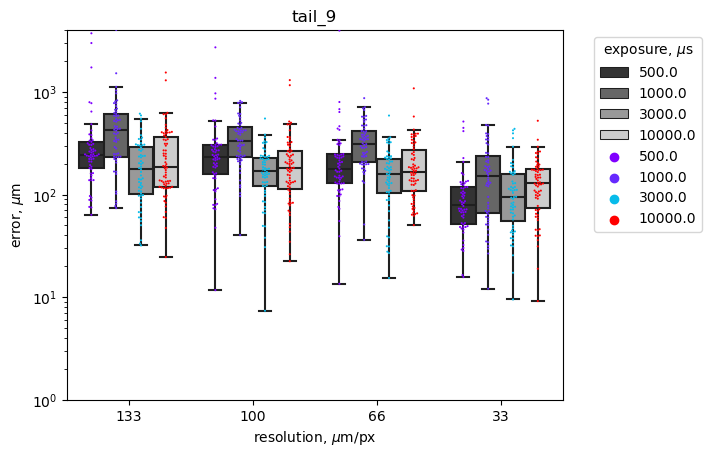

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


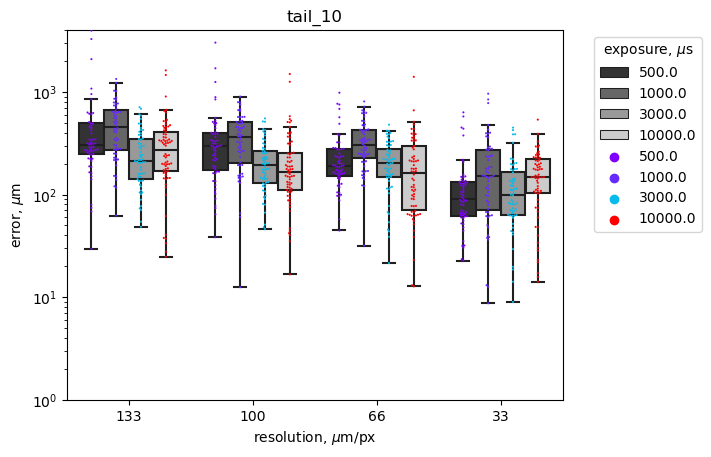

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


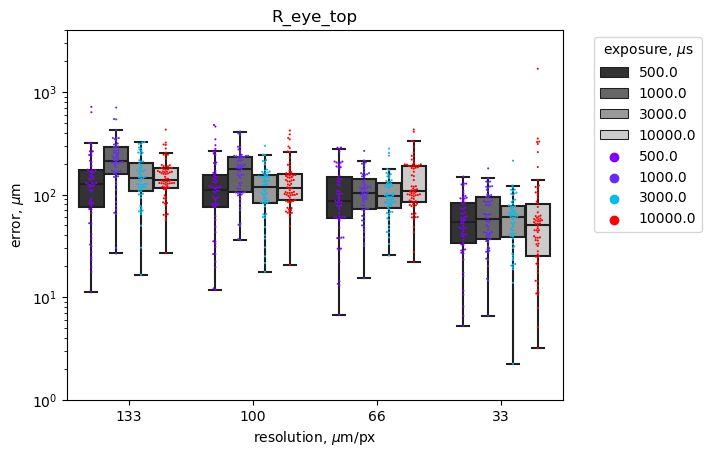

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


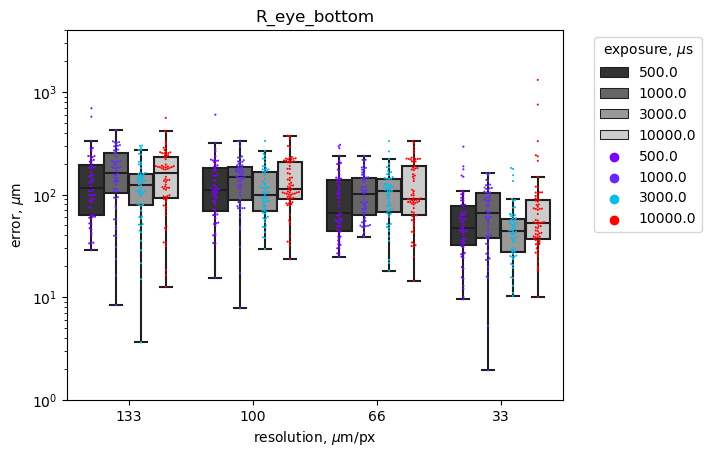

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


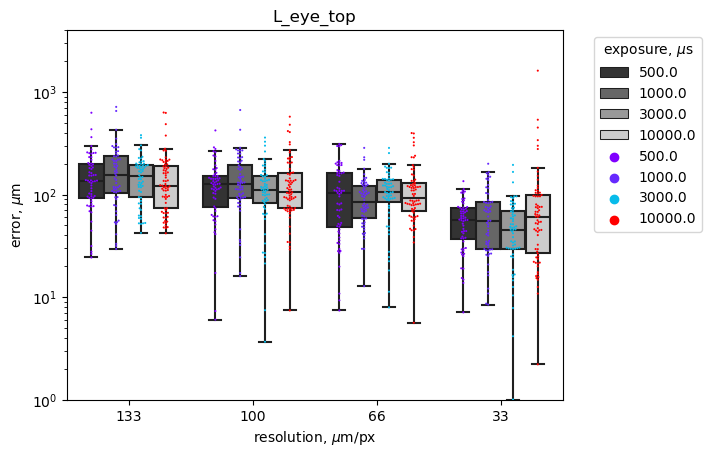

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


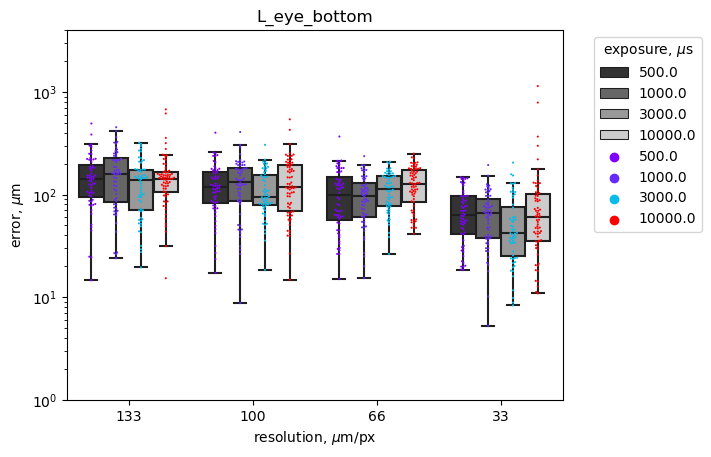

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


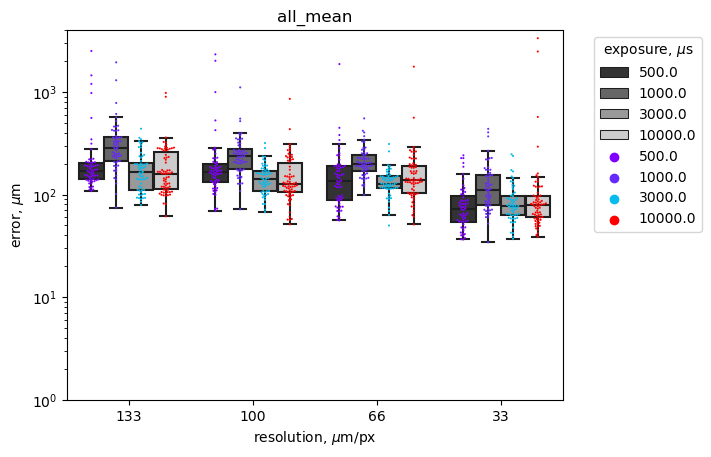

In [29]:
for DLC_network, DLC_suffix in DLC_nx_suffixes.items():
    for keypt in ['swim_bladder', 'tail_1',
       'tail_2', 'tail_3', 'tail_4', 'tail_5', 'tail_6', 'tail_7', 'tail_8',
       'tail_9', 'tail_10', 'R_eye_top', 'R_eye_bottom', 'L_eye_top',
       'L_eye_bottom', 'all_mean']:

        network_mask = full_DLC_error_df_DS['method'] == DLC_network
        sns.boxplot(data=full_DLC_error_df_DS[network_mask], x='resolution', y=keypt, hue='exposure', palette='grey', dodge=True, fliersize=0, label='_Hidden')
        sns.swarmplot(data=full_DLC_error_df_DS[network_mask], x='resolution', y=keypt, hue='exposure', palette='rainbow', dodge=True, size=1.5)
        plt.xticks(ticks=[0,1,2,3], labels=[133, 100, 66, 33])
        plt.xlabel(r'resolution, $ \mu $m/px')
        plt.ylabel(r'error, $ \mu $m')
        plt.yscale('log')
        plt.legend(title='exposure, $ \mu $s', bbox_to_anchor=(1.05, 1.0))
        plt.ylim([1,4000])
        # plt.yticks(np.arange(500,3001,500))
        plt.title(keypt)
        if downsampled_flag:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+DLC_network+'_downsampled.svg'))
        else:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+DLC_network+'.svg'))
        plt.show()

## 2.2 - Compare SLEAP tracked data against annotated data - independent dataset

In [30]:
for sleap_network, sleap_suffix in SLEAP_nx_suffixes.items():
    # code to get only the SLEAP results from the frames that were annotated
    for video_name, frames_to_get in video_frames_to_get.items():
        sleap_results_list = glob.glob(os.path.join(path_to_videos,'**','*'+sleap_suffix+'.h5'))
        for sleap_result in sleap_results_list:
            if video_name in sleap_result:
                print(video_name)
                print(frames_to_get)
                print("video {} is in sleap_result {}".format(video_name, sleap_result))
                
                frames_df = sleap_to_dlc_format(sleap_result, indices=frames_to_get)
                frames_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+sleap_network+'.csv'))

CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-41-56_well_1
[1418, 1419, 1420, 2001, 2014, 2015, 2016, 2461, 2944, 2946]
video CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-41-56_well_1 is in sleap_result D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-500\CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-41-56_well_1.sim.pred.h5
CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-2-STIM-FLASH--2024-9-3-15-41-56_well_1
[1418, 1419, 1420, 2001, 2014, 2015, 2016, 2461, 2944, 2946]
video CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-2-STIM-FLASH--2024-9-3-15-41-56_well_1 is in sleap_result D:\DLC_Paper\DLC_TestsDS\RES-2-EXPOSURE-500\CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-2-STIM-FLASH--2024-9-3-15-41-56_well_1.sim.pred.h5
CLAS-Batch-11-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-3-STIM-FLASH--2024-9-3-15-41-56_well_1
[1418, 1419, 1420, 2001, 2014, 2015, 2016, 2461, 2944, 2946]
vide

In [31]:
if 'full_SLEAP_error_df_DS' in globals().keys():
    del full_SLEAP_error_df_DS

In [32]:
resolution = {1: 133, 2: 100, 3: 66, 4: 33}
for sleap_network, sleap_suffix in SLEAP_nx_suffixes.items():
    for video in videos_list: 
        # load the annotations and dlc tracking results files 
        annotation_path = glob.glob(os.path.join(video, '*LAS-TM-CL.csv'))[0]
        annotations_df = pd.read_csv(annotation_path, header=[0,1,2])

        video_name = os.path.split(video)[-1]
        if 'CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_4' not in video_name:
            sleap_df = pd.read_csv(os.path.join(path_to_verif_frames, video_name+'_'+sleap_network+'.csv'), header=[0,1])

            annot_lvl = annotations_df.columns.get_level_values(0)[-1]

            #  order keypoints nicely
            keypoints = np.unique(annotations_df.columns.get_level_values(1)[3:])
            keypoints = keypoints[[4,5,7,8,9,10,11,12,13,14,6,3,2,1,0]]

            res, exp = get_metadata_from_video_name(video_name)
            error = {'video_name': [video_name]*len(sleap_df), 'resolution' : np.ones((len(sleap_df),))*res, 'exposure': np.ones((len(sleap_df),))*exp}
            
            for keypoint in keypoints:
                if downsampled_flag:
                    if res <=3:
                        divider = {3: 2.03, 2: 2.99, 1: 3.925}
                        MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')]/divider[res] - sleap_df.loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                    if res == 4:
                        MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - sleap_df.loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                else:
                    MSE = np.sqrt(np.sum((annotations_df[annot_lvl].loc[:,keypoint].loc[:,('x', 'y')] - sleap_df.loc[:,keypoint].loc[:,('x', 'y')])**2, axis=1)).values
                
                MSE = MSE * resolution[res]
                error.update({keypoint: MSE})
            
            error_df = pd.DataFrame(error)
            error_df['all_mean'] = error_df[keypoints].mean(axis=1)
            error_df['all_std'] = error_df[keypoints].mean(axis=1)
            error_df['method'] = sleap_network

            error_df.to_csv(os.path.join(path_to_verif_frames, video_name+'_'+sleap_network+'_ERROR.csv'))

            if 'full_SLEAP_error_df_DS' in globals().keys():
                full_SLEAP_error_df_DS = pd.concat((full_SLEAP_error_df_DS, error_df), ignore_index=True)
            else:
                full_SLEAP_error_df_DS = error_df

full_SLEAP_error_df_DS.replace(0,np.nan, inplace=True)

In [33]:
full_SLEAP_error_df_DS.describe()

,resolution,exposure,swim_bladder,tail_1,tail_2,tail_3,tail_4,tail_5,tail_6,tail_7,tail_8,tail_9,tail_10,R_eye_top,R_eye_bottom,L_eye_top,L_eye_bottom,all_mean,all_std
count,2000.000000,2000.000000,1982.000000,1991.000000,1984.000000,1984.000000,1984.000000,1983.000000,1979.000000,1971.000000,1964.000000,1956.000000,1939.000000,1955.000000,1978.000000,1959.000000,1978.000000,1992.000000,1992.000000
mean,2.500000,3880.000000,101.482737,117.529698,129.138789,151.698324,176.351464,202.109718,210.504342,233.576639,246.932209,261.691108,289.507948,148.502100,163.918017,198.738750,163.842913,184.274240,184.274240
std,1.118314,3925.978433,75.877911,97.122384,82.515489,93.034940,112.687046,133.200327,152.740665,174.952812,191.058097,205.052173,250.421397,97.375608,187.409424,575.782152,203.001528,91.087315,91.087315
min,1.000000,500.000000,0.505706,2.443258,1.602343,2.903155,4.521376,3.125545,2.417325,0.800798,7.315769,7.556314,4.362219,3.486640,0.953931,4.262733,6.062505,43.260447,43.260447
25%,1.750000,1000.000000,54.904323,61.765902,73.270916,87.837089,95.917898,106.817077,104.127987,110.835344,113.486371,118.672740,122.146101,74.461245,63.174488,76.042079,66.646983,125.434850,125.434850
50%,2.500000,3000.000000,87.996240,101.030244,117.356054,134.395665,155.858672,178.213111,178.092962,193.282227,197.307273,207.530460,224.152697,126.608610,113.745425,125.860253,117.636192,168.499403,168.499403
75%,3.250000,10000.000000,131.800736,147.674461,167.161225,198.393277,231.265448,267.808106,280.972247,319.404776,339.378495,356.068549,409.604944,200.482999,234.434843,227.743304,205.627663,223.631626,223.631626
max,4.000000,10000.000000,925.762531,1148.432349,1141.413720,783.435940,1248.053631,1609.790691,1937.594280,2310.480264,2537.669217,2712.887276,2856.144872,838.392908,6209.580386,15701.644742,7201.124325,1156.479492,1156.479492


c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


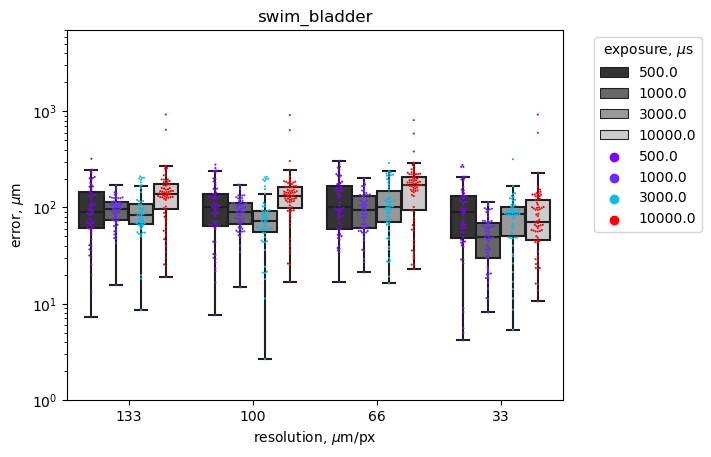

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


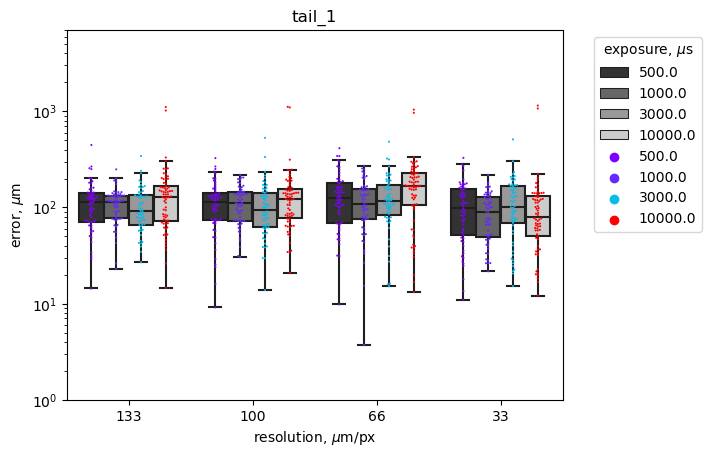

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


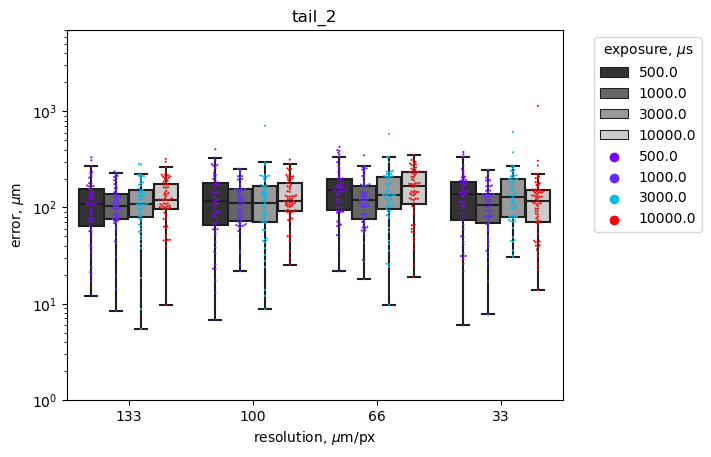

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


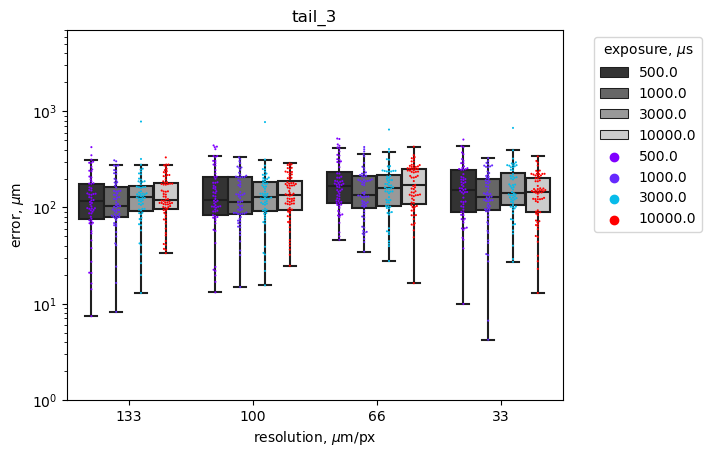

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


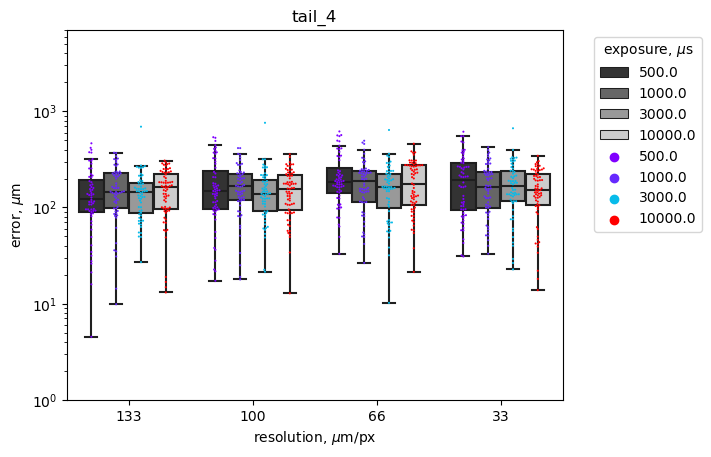

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


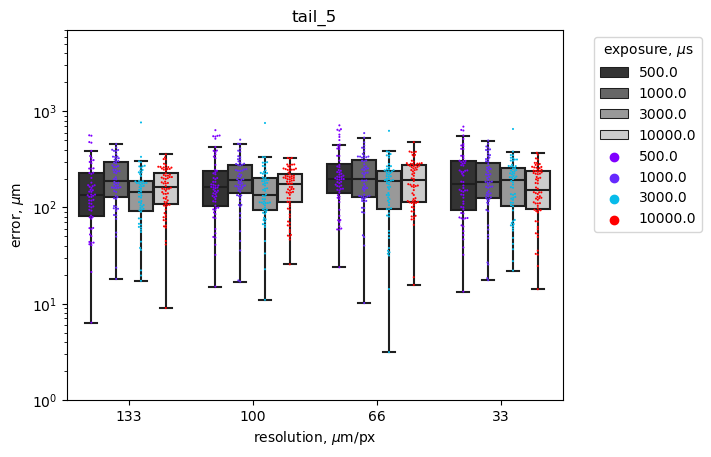

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


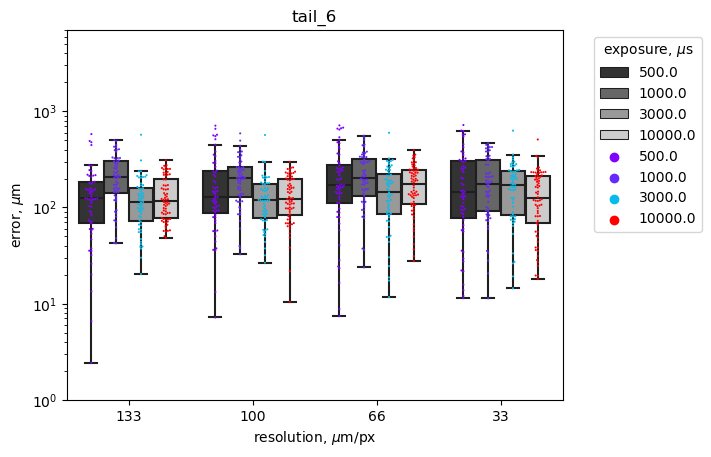

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


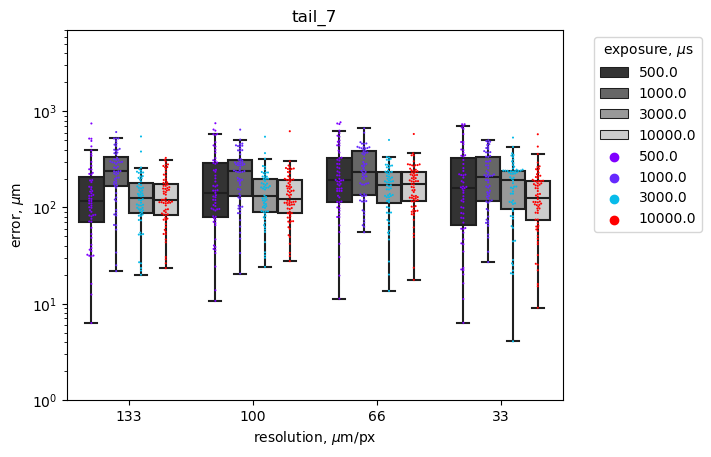

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


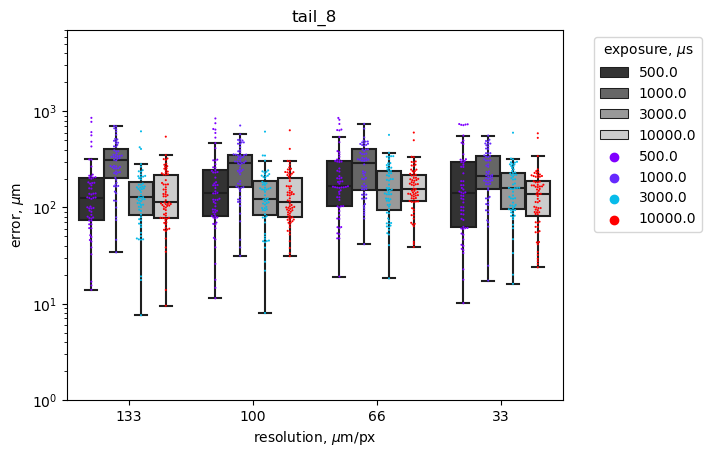

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


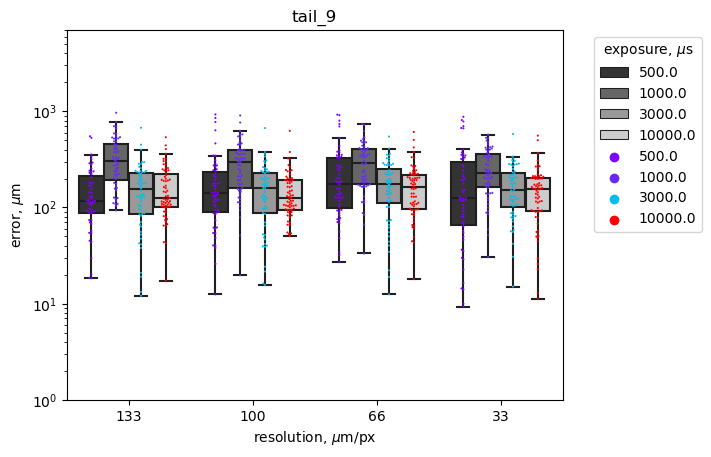

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


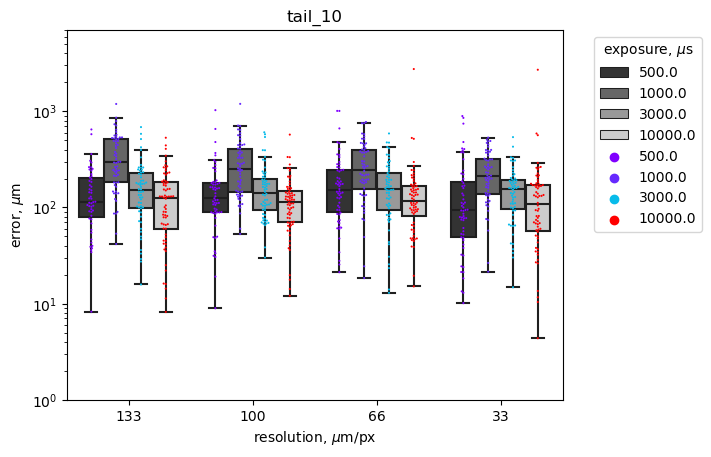

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


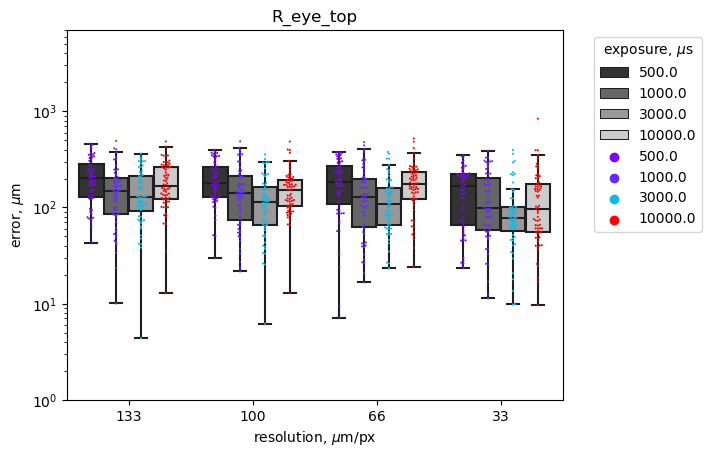

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


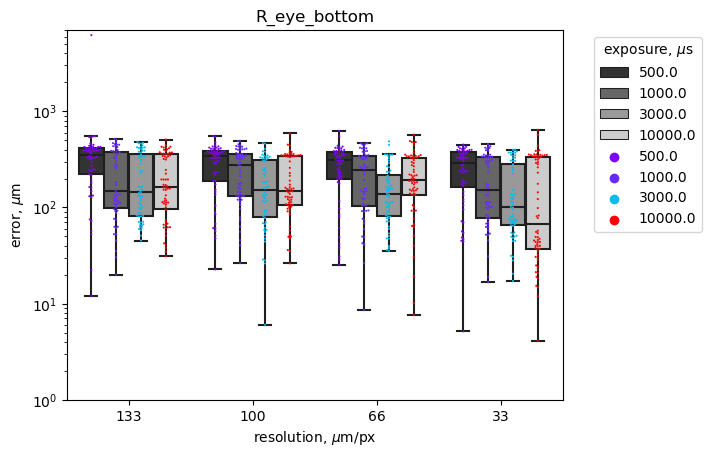

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


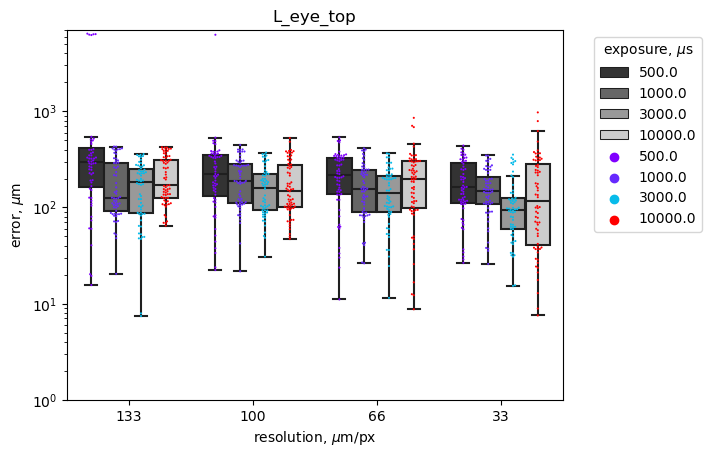

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


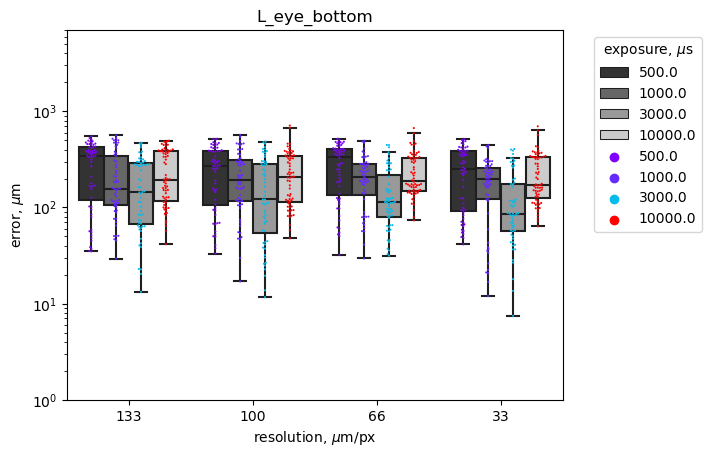

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


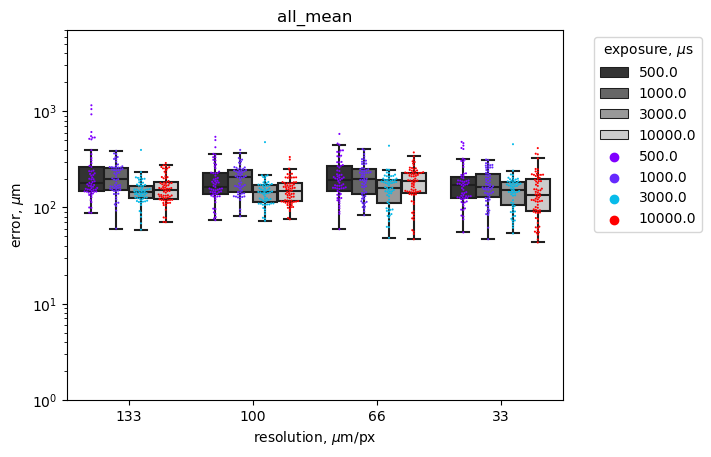

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


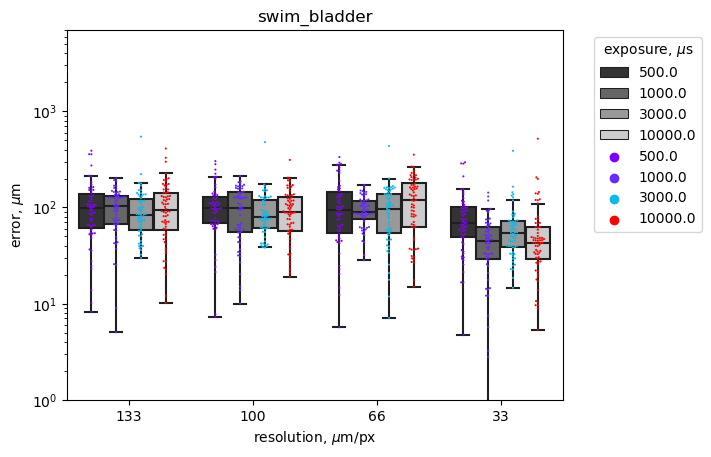

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


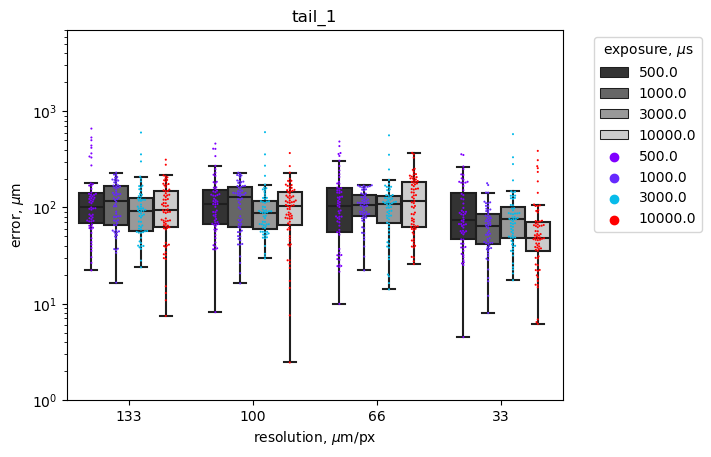

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


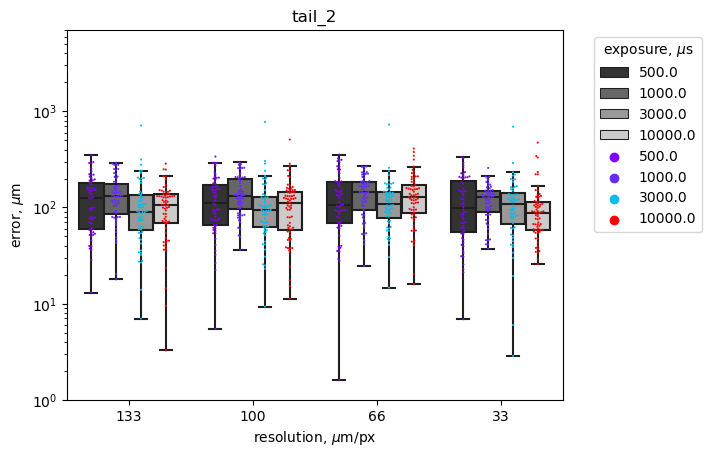

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


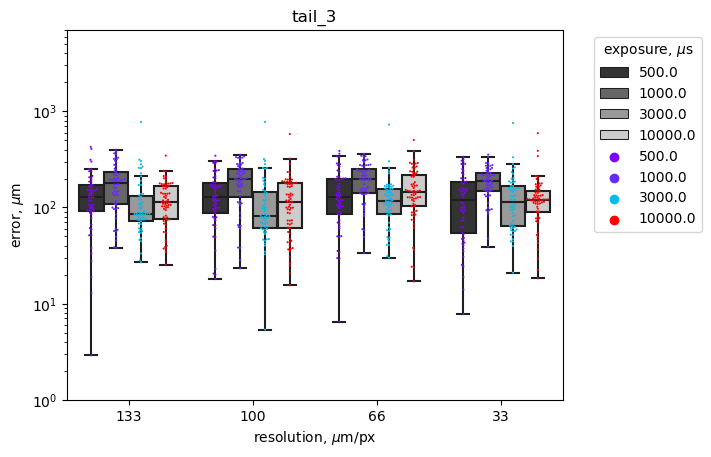

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


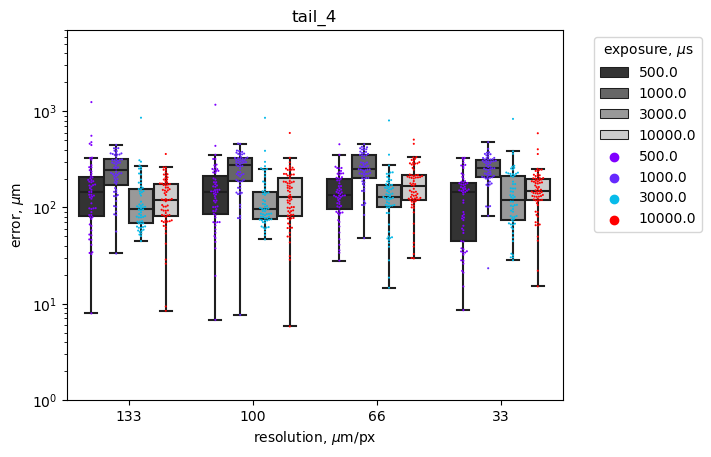

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


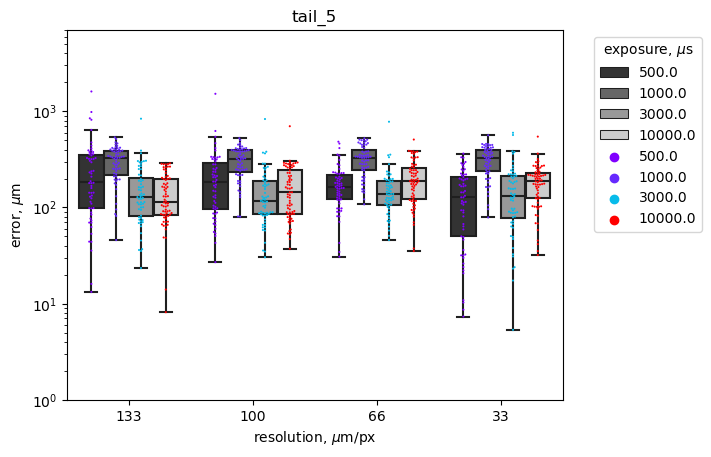

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


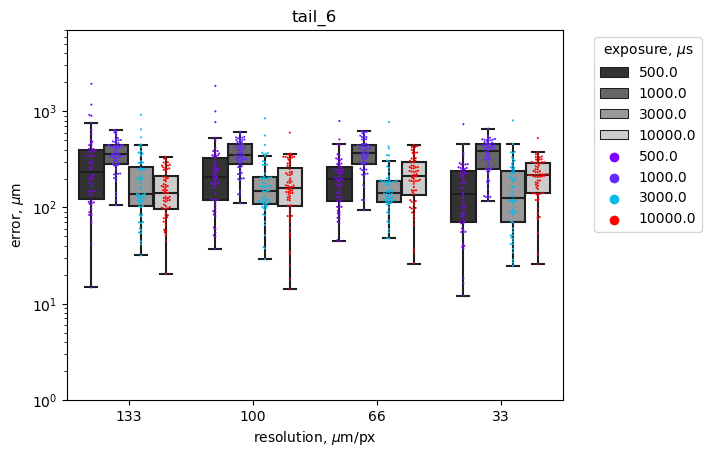

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


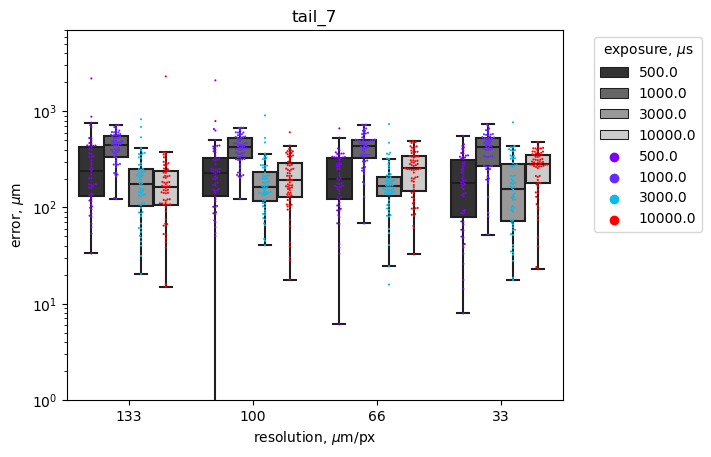

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


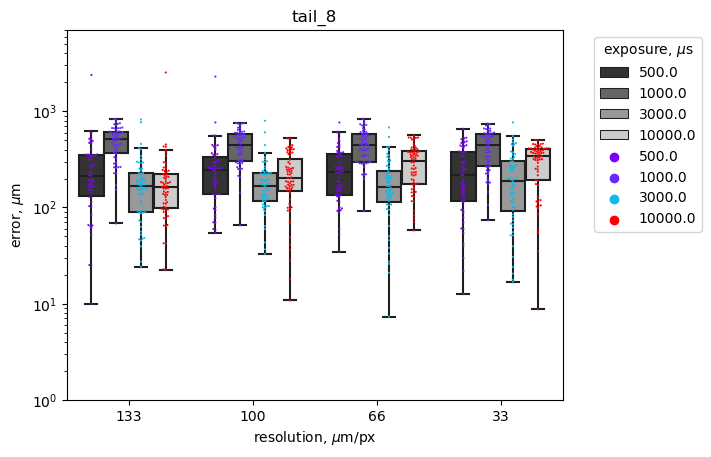

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


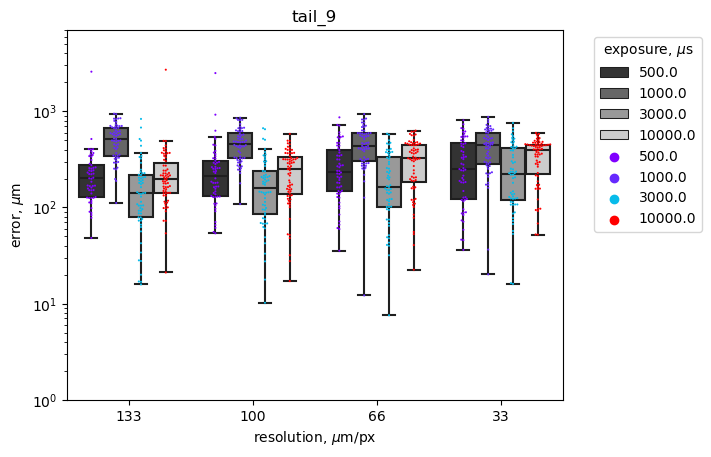

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


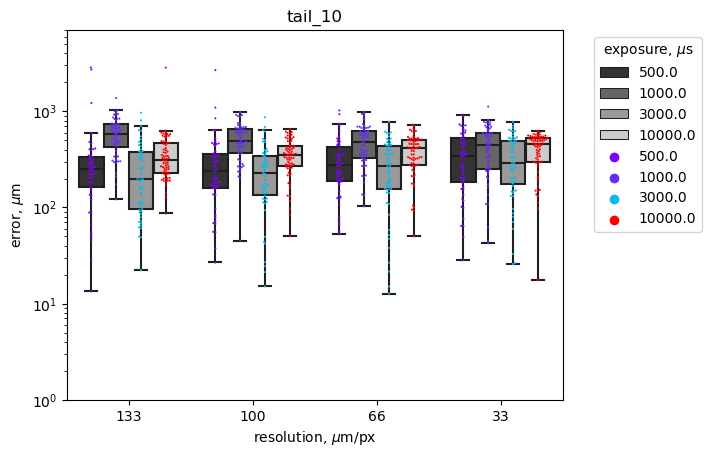

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


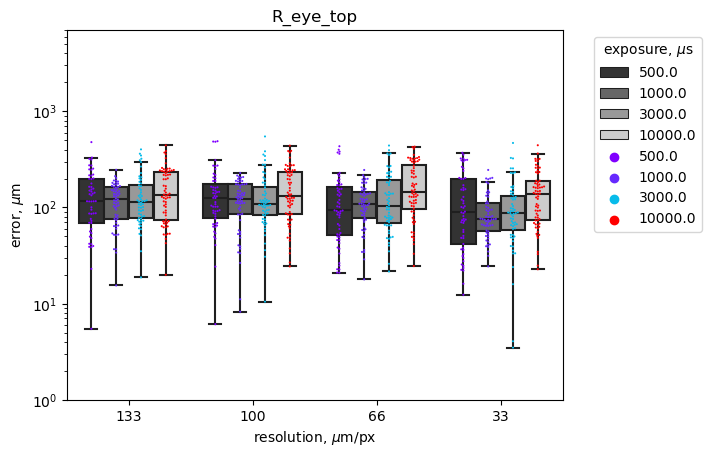

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


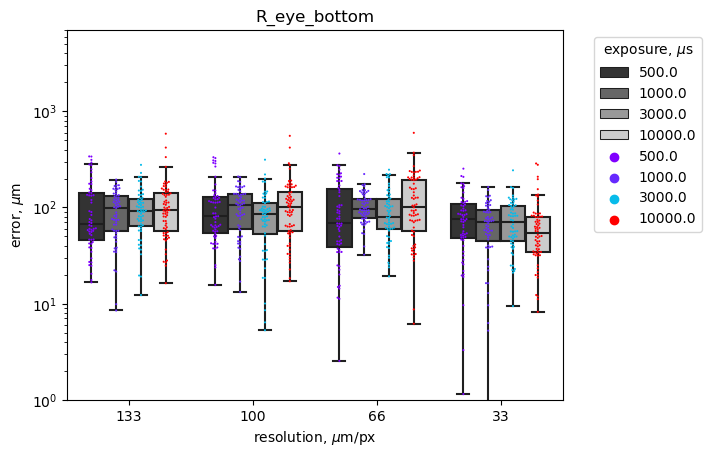

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


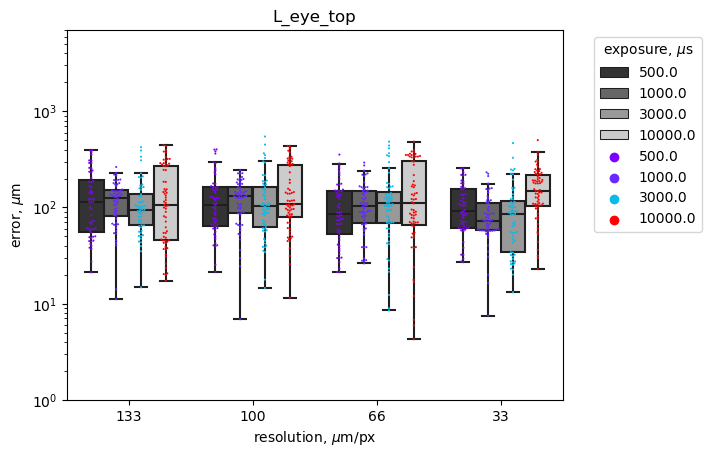

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


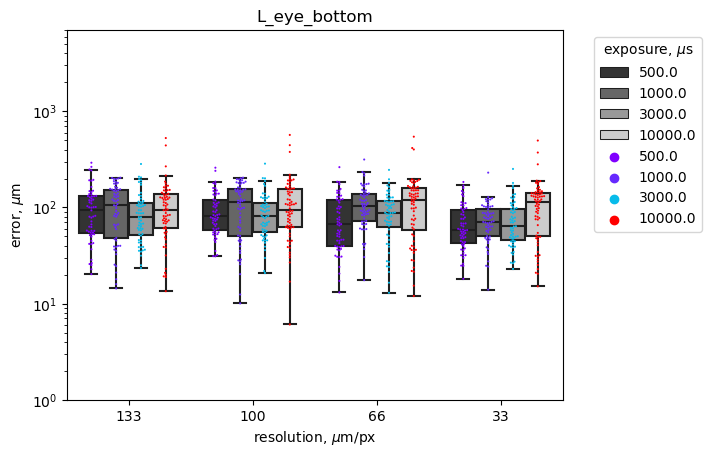

c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\lscholz\.conda\envs\analysis_basic\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


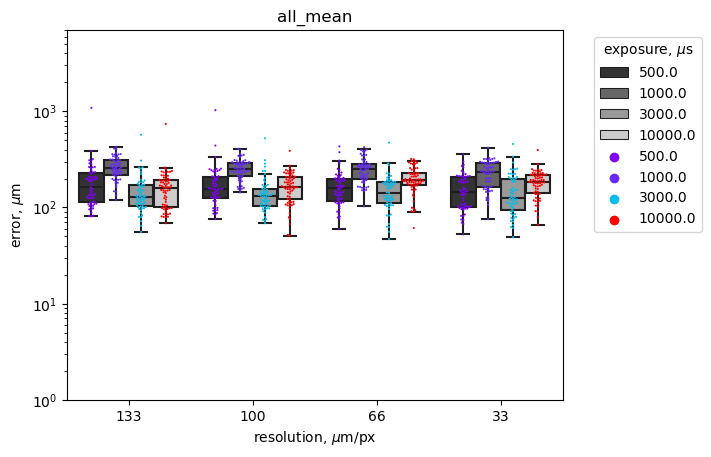

In [34]:
for sleap_network, sleap_suffix in SLEAP_nx_suffixes.items():
    for keypt in ['swim_bladder', 'tail_1',
       'tail_2', 'tail_3', 'tail_4', 'tail_5', 'tail_6', 'tail_7', 'tail_8',
       'tail_9', 'tail_10', 'R_eye_top', 'R_eye_bottom', 'L_eye_top',
       'L_eye_bottom', 'all_mean']:

        network_mask = full_SLEAP_error_df_DS['method'] == sleap_network

        sns.boxplot(data=full_SLEAP_error_df_DS[network_mask], x='resolution', y=keypt, hue='exposure', palette='grey', dodge=True, fliersize=0, label='_Hidden')
        plt.legend().remove()
        sns.swarmplot(data=full_SLEAP_error_df_DS[network_mask], x='resolution', y=keypt, hue='exposure', palette='rainbow', dodge=True, size=1.5)
        plt.xticks(ticks=[0,1,2,3], labels=[133, 100, 66, 33])
        plt.xlabel(r'resolution, $ \mu $m/px')
        plt.ylabel(r'error, $ \mu $m')
        plt.legend(title='exposure, $ \mu $s', bbox_to_anchor=(1.05, 1.0))
        plt.ylim([1,7000])
        plt.yscale('log')
        plt.title(keypt)
        if downsampled_flag:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+sleap_network+'_downsampled.svg'))
        else:
            plt.savefig(os.path.join(path_to_videos, 'result_'+keypt+'_'+sleap_network+'_.svg'))
        plt.show()

In [35]:
error_methods_df_DS = pd.concat((full_SLEAP_error_df_DS, full_DLC_error_df_DS))

In [36]:
if downsampled_flag:
    error_methods_df_DS.to_hdf(os.path.join(path_to_videos, 'DSAMPLED_error_tracking_methods_202505.h5'), key='error_methods_df')
if not downsampled_flag:
    error_methods_df.to_hdf(os.path.join(path_to_videos, 'error_tracking_methods_202505.h5'), key='error_methods_df')

### Load errors that were calculated and saved previously to plot results

In [ ]:
path_to_videos = r'D:\DLC_Paper\DLC_Tests'

In [ ]:
error_methods_df = pd.read_hdf(os.path.join(path_to_videos,'error_tracking_methods_202505.h5'), key='error_methods_df')
error_methods_df_DS = pd.read_hdf(os.path.join(path_to_videos+'DS','DSAMPLED_error_tracking_methods_202505.h5'), key='error_methods_df')

### 3 - Plot euclidean distance errors grouped by resolution and exposure

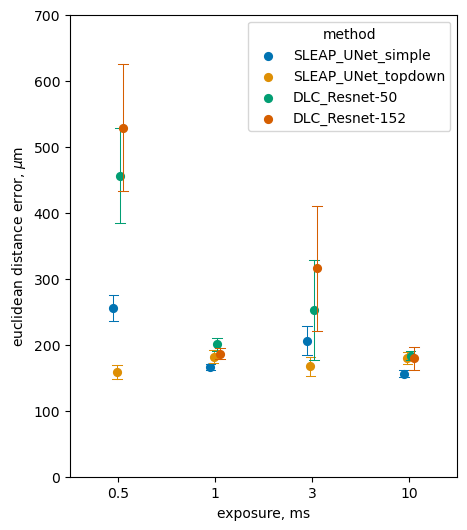

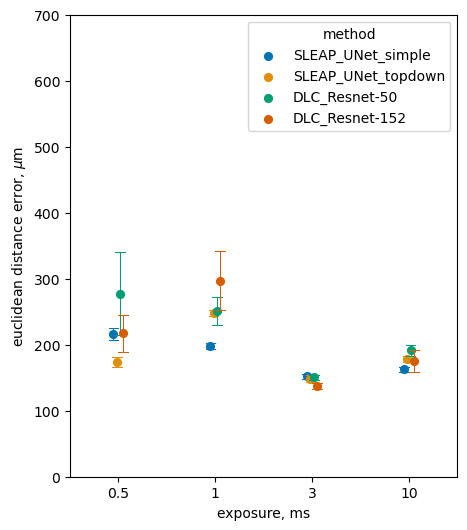

In [37]:
var = 'exposure'
keypoint = 'all_mean'

plt.rcParams['figure.figsize']=(5,6)
sns.pointplot(data=error_methods_df, x=var,y=keypoint, errorbar='se', hue='method', estimator='mean', dodge=True, errwidth=0.75, capsize=0.1, linestyles="none", scale=0.75, palette=sns.color_palette("colorblind"))
plt.xticks(ticks=[0,1,2,3], labels=['0.5', '1', '3', '10'])
plt.ylabel('euclidean distance error, $\mu$m')
plt.xlabel('exposure, ms')
plt.ylim([0,700])
# plt.savefig(os.path.join(path_to_videos,var+'_'+keypoint+'_mean_SEM.svg'))
plt.show()

plt.rcParams['figure.figsize']=(5,6)
sns.pointplot(data=error_methods_df_DS, x=var,y=keypoint, errorbar='se', hue='method', estimator='mean', dodge=True, errwidth=0.75, capsize=0.1, linestyles="none", scale=0.75, palette=sns.color_palette("colorblind"))
plt.xticks(ticks=[0,1,2,3], labels=['0.5', '1', '3', '10'])
plt.ylabel('euclidean distance error, $\mu$m')
plt.xlabel('exposure, ms')
plt.ylim([0,700])
# plt.savefig(os.path.join(path_to_videos, var+'_'+keypoint+'_mean_SEM_DS.svg'))
plt.show()

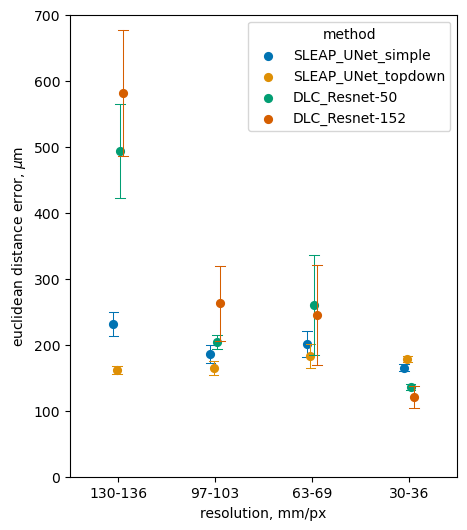

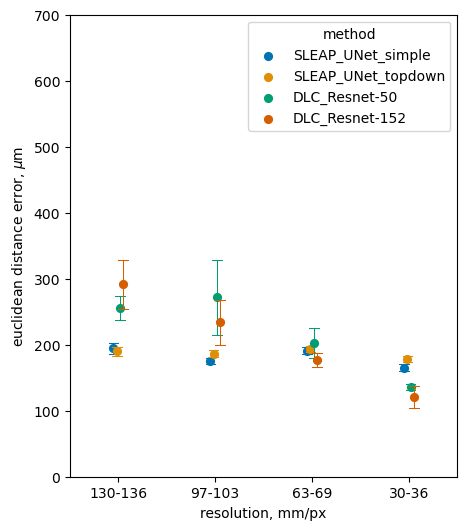

In [38]:
var = 'resolution'
keypoint = 'all_mean'

plt.rcParams['figure.figsize']=(5,6)
sns.pointplot(data=error_methods_df, x=var,y=keypoint, errorbar='se', hue='method', estimator='mean', dodge=True, errwidth=0.75, capsize=0.1, linestyles="none", scale=0.75, palette=sns.color_palette("colorblind"))
plt.xticks(ticks=[0,1,2,3], labels=['130-136', '97-103', '63-69', '30-36'])
plt.xlabel('resolution, mm/px')
plt.ylabel('euclidean distance error, $\mu$m')
plt.ylim([0,700])
# plt.savefig(os.path.join(path_to_videos,var+'_'+keypoint+'_mean_SEM.svg'))
plt.show()

plt.rcParams['figure.figsize']=(5,6)
sns.pointplot(data=error_methods_df_DS, x=var,y=keypoint, errorbar='se', hue='method', estimator='mean', dodge=True, errwidth=0.75, capsize=0.1, linestyles="none", scale=0.75,palette=sns.color_palette("colorblind"))
plt.xticks(ticks=[0,1,2,3], labels=['130-136', '97-103', '63-69', '30-36'])
plt.xlabel('resolution, mm/px')
plt.ylabel('euclidean distance error, $\mu$m')
plt.ylim([0,700])
# plt.savefig(os.path.join(path_to_videos, var+'_'+keypoint+'_mean_SEM_DS.svg'))
plt.show()

In [39]:
for method in np.unique(error_methods_df['method']):
    for resolution in np.unique(error_methods_df['resolution']):

        idx = np.logical_and(error_methods_df['resolution']==resolution, error_methods_df['method']==method)
        print("method {}, resolution {} error: {:.2f} +- {:.2f} (MEAN +- STD)".format(method, resolution, np.nanmean(error_methods_df[idx]['all_mean']), np.nanstd(error_methods_df[idx]['all_mean'])/np.sqrt(len(error_methods_df[idx]['all_mean']))))

print('######')
for method in np.unique(error_methods_df['method']):
    for EXP in np.unique(error_methods_df['exposure']):

        idx = np.logical_and(error_methods_df['exposure']==EXP, error_methods_df['method']==method)
        print("method {}, exposure {} error: {:.2f} +- {:.2f} (MEAN +- STD)".format(method, EXP, np.nanmean(error_methods_df[idx]['all_mean']), np.nanstd(error_methods_df[idx]['all_mean'])/np.sqrt(len(error_methods_df[idx]['all_mean']))))

method DLC_Resnet-152, resolution 1.0 error: 581.58 +- 95.71 (MEAN +- STD)
method DLC_Resnet-152, resolution 2.0 error: 262.78 +- 56.77 (MEAN +- STD)
method DLC_Resnet-152, resolution 3.0 error: 244.94 +- 74.50 (MEAN +- STD)
method DLC_Resnet-152, resolution 4.0 error: 120.94 +- 16.51 (MEAN +- STD)
method DLC_Resnet-50, resolution 1.0 error: 493.41 +- 71.52 (MEAN +- STD)
method DLC_Resnet-50, resolution 2.0 error: 204.28 +- 10.06 (MEAN +- STD)
method DLC_Resnet-50, resolution 3.0 error: 259.66 +- 74.75 (MEAN +- STD)
method DLC_Resnet-50, resolution 4.0 error: 136.12 +- 4.28 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 1.0 error: 231.78 +- 18.09 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 2.0 error: 185.50 +- 13.48 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 3.0 error: 200.56 +- 19.31 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 4.0 error: 165.44 +- 4.97 (MEAN +- STD)
method SLEAP_UNet_topdown, resolution 1.0 error: 161.34 +- 5.42 (MEAN +- STD)
method SLEAP_UNe

In [40]:
for method in np.unique(error_methods_df_DS['method']):
    for resolution in np.unique(error_methods_df_DS['resolution']):

        idx = np.logical_and(error_methods_df_DS['resolution']==resolution, error_methods_df_DS['method']==method)
        print("method {}, resolution {} error: {:.2f} +- {:.2f} (MEAN +- STD)".format(method, resolution, np.nanmean(error_methods_df_DS[idx]['all_mean']), np.nanstd(error_methods_df_DS[idx]['all_mean'])/np.sqrt(len(error_methods_df_DS[idx]['all_mean']))))

print('######')
for method in np.unique(error_methods_df_DS['method']):
    for EXP in np.unique(error_methods_df_DS['exposure']):

        idx = np.logical_and(error_methods_df_DS['exposure']==EXP, error_methods_df_DS['method']==method)
        print("method {}, exposure {} error: {:.2f} +- {:.2f} (MEAN +- STD)".format(method, EXP, np.nanmean(error_methods_df_DS[idx]['all_mean']), np.nanstd(error_methods_df_DS[idx]['all_mean'])/np.sqrt(len(error_methods_df_DS[idx]['all_mean']))))

method DLC_Resnet-152, resolution 1.0 error: 291.30 +- 36.67 (MEAN +- STD)
method DLC_Resnet-152, resolution 2.0 error: 233.71 +- 34.50 (MEAN +- STD)
method DLC_Resnet-152, resolution 3.0 error: 176.86 +- 10.53 (MEAN +- STD)
method DLC_Resnet-152, resolution 4.0 error: 120.94 +- 16.51 (MEAN +- STD)
method DLC_Resnet-50, resolution 1.0 error: 255.11 +- 17.96 (MEAN +- STD)
method DLC_Resnet-50, resolution 2.0 error: 271.94 +- 56.55 (MEAN +- STD)
method DLC_Resnet-50, resolution 3.0 error: 203.00 +- 22.57 (MEAN +- STD)
method DLC_Resnet-50, resolution 4.0 error: 136.12 +- 4.27 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 1.0 error: 194.37 +- 8.04 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 2.0 error: 175.01 +- 4.67 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 3.0 error: 191.16 +- 5.22 (MEAN +- STD)
method SLEAP_UNet_simple, resolution 4.0 error: 165.44 +- 4.97 (MEAN +- STD)
method SLEAP_UNet_topdown, resolution 1.0 error: 189.98 +- 6.68 (MEAN +- STD)
method SLEAP_UNet_t

# 4 - calculate the statistical differences between the euclidean distance error results

In [41]:
p_values = {}

The following cell is used to set for which keypoint you want to calculate the statistical differences

In [42]:
keypoint = 'all_mean'

In [43]:
for var in ['exposure', 'resolution']:
    for dataset in ['downsampled', 'independent']:

        p_values.update({dataset+'_'+var+'_'+keypoint: {}})

        test_df = {}
        if dataset == 'downsampled':
            for j,v in enumerate(np.unique(error_methods_df_DS[var])):
                var_idx = error_methods_df_DS[var]==v
                for i,net in enumerate(np.unique(error_methods_df_DS['method'])):
                    method_idx = np.logical_and(var_idx, error_methods_df_DS['method']==net)
                    id = str(v)+"_"+net
                    vals = error_methods_df_DS[keypoint][method_idx].values
                    not_nans =  np.isnan(vals) == False
                    vals = vals[not_nans]
                    test_df.update({id: vals})

        if dataset == 'independent':
            for j,v in enumerate(np.unique(error_methods_df[var])):
                    var_idx = error_methods_df[var]==v
                    for i,net in enumerate(np.unique(error_methods_df['method'])):
                        method_idx = np.logical_and(var_idx, error_methods_df['method']==net)
                        id = str(v)+"_"+net
                        vals = error_methods_df[keypoint][method_idx].values
                        not_nans =  np.isnan(vals) == False
                        vals = vals[not_nans]
                        test_df.update({id: vals})

        if var == 'exposure':
            statistic, p = kruskal(test_df['500.0_DLC_Resnet-152'], 
                            test_df['500.0_DLC_Resnet-50'],
                            test_df['500.0_SLEAP_UNet_simple'],
                            test_df['500.0_SLEAP_UNet_topdown'],
                            test_df['1000.0_DLC_Resnet-152'], 
                            test_df['1000.0_DLC_Resnet-50'],
                            test_df['1000.0_SLEAP_UNet_simple'],
                            test_df['1000.0_SLEAP_UNet_topdown'],
                            test_df['3000.0_DLC_Resnet-152'], 
                            test_df['3000.0_DLC_Resnet-50'],
                            test_df['3000.0_SLEAP_UNet_simple'],
                            test_df['3000.0_SLEAP_UNet_topdown'],
                            test_df['10000.0_DLC_Resnet-152'], 
                            test_df['10000.0_DLC_Resnet-50'],
                            test_df['10000.0_SLEAP_UNet_simple'],
                            test_df['10000.0_SLEAP_UNet_topdown'],
                            )
        if var == 'resolution':
            statistic, p = kruskal(test_df['1.0_DLC_Resnet-152'], 
                            test_df['1.0_DLC_Resnet-50'],
                            test_df['1.0_SLEAP_UNet_simple'],
                            test_df['1.0_SLEAP_UNet_topdown'],
                            test_df['2.0_DLC_Resnet-152'], 
                            test_df['2.0_DLC_Resnet-50'],
                            test_df['2.0_SLEAP_UNet_simple'],
                            test_df['2.0_SLEAP_UNet_topdown'],
                            test_df['3.0_DLC_Resnet-152'], 
                            test_df['3.0_DLC_Resnet-50'],
                            test_df['3.0_SLEAP_UNet_simple'],
                            test_df['3.0_SLEAP_UNet_topdown'],
                            test_df['4.0_DLC_Resnet-152'], 
                            test_df['4.0_DLC_Resnet-50'],
                            test_df['4.0_SLEAP_UNet_simple'],
                            test_df['4.0_SLEAP_UNet_topdown'])
        
        print(p)
        p_values[dataset+'_'+var+'_'+keypoint].update({'KW': p})

        if var == 'exposure':
            p = posthoc_dunn([test_df[i] for i in test_df.keys()], p_adjust='bonferroni')
        if var == 'resolution':
            p = posthoc_dunn([test_df[i] for i in test_df.keys()], p_adjust='bonferroni')

        p.columns = list(test_df.keys())
        p.index = list(test_df.keys())
        p_values[dataset+'_'+var+'_'+keypoint].update({'Dunn-Bonferroni': p})

3.819084003786866e-108
8.805777538574915e-24
3.260623464542186e-103
6.206757073418877e-116


## 4.1 - plot binary matrix where white represent pairs with significant differences between each other

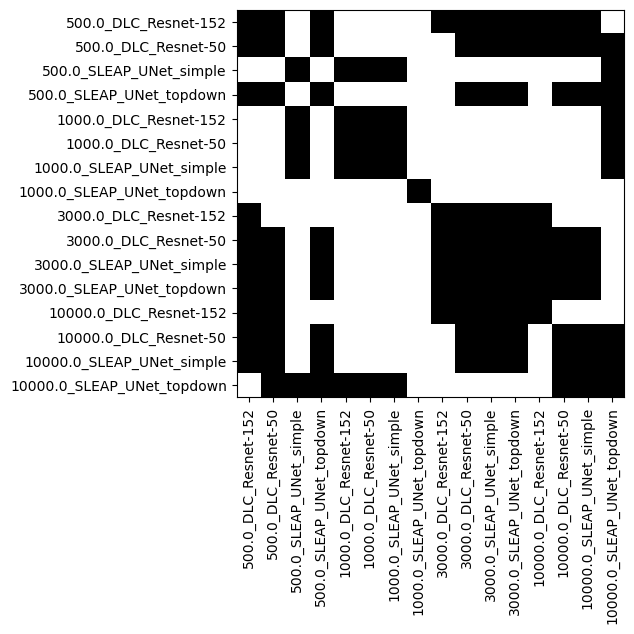

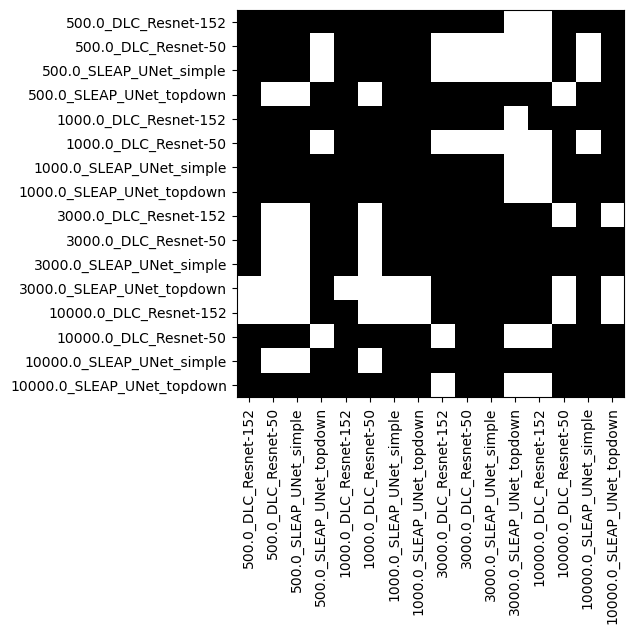

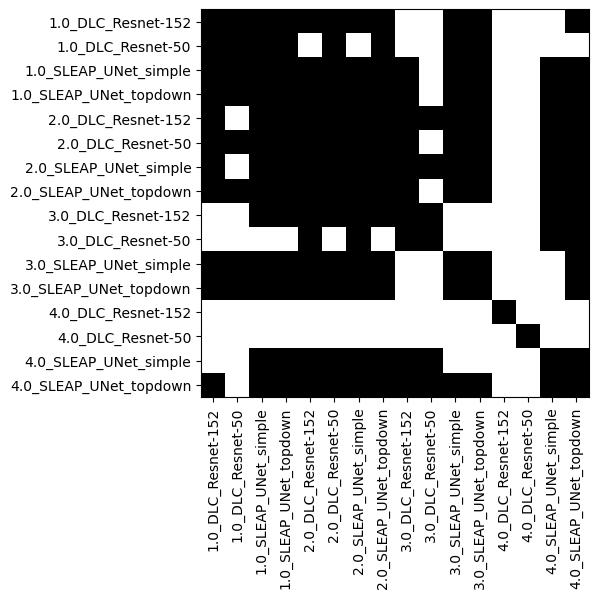

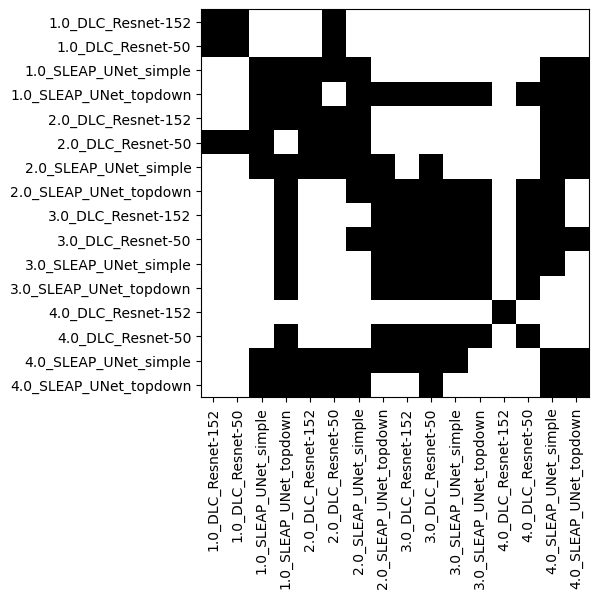

In [44]:
# plot binary matrix where white represent pairs with significant differences between each other
for var in ['exposure', 'resolution']:
    for dataset in ['downsampled', 'independent']:
        plt.imshow(p_values[dataset+'_'+var+'_'+keypoint]['Dunn-Bonferroni'] < 0.05, cmap='grey')
        plt.xticks(ticks=np.arange(0,16), labels=p_values[dataset+'_'+var+'_'+keypoint]['Dunn-Bonferroni'].columns, rotation=90)
        plt.yticks(ticks=np.arange(0,16), labels=p_values[dataset+'_'+var+'_'+keypoint]['Dunn-Bonferroni'].columns)
        plt.show()

In [45]:
p_values.keys()

dict_keys(['downsampled_exposure_all_mean', 'independent_exposure_all_mean', 'downsampled_resolution_all_mean', 'independent_resolution_all_mean'])

In [46]:
for dataset in ['independent', 'downsampled']:
    for var in ['resolution', 'exposure']:
        temp_df = pd.DataFrame.from_dict(p_values[dataset+'_'+var+'_all_mean']['Dunn-Bonferroni'])
        temp_df.to_csv('D:\\DLC_Paper\\'+dataset+'_'+var+'_all_mean_p_values.csv')

# 4.2 - Plot matrix as heatmap (triangular) with p significant pairwise differences. 

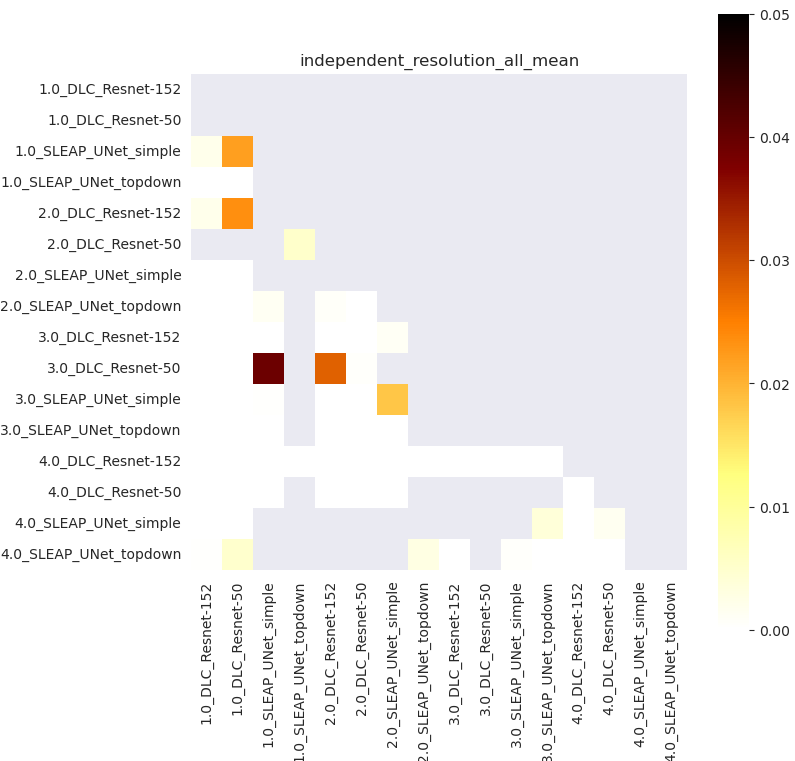

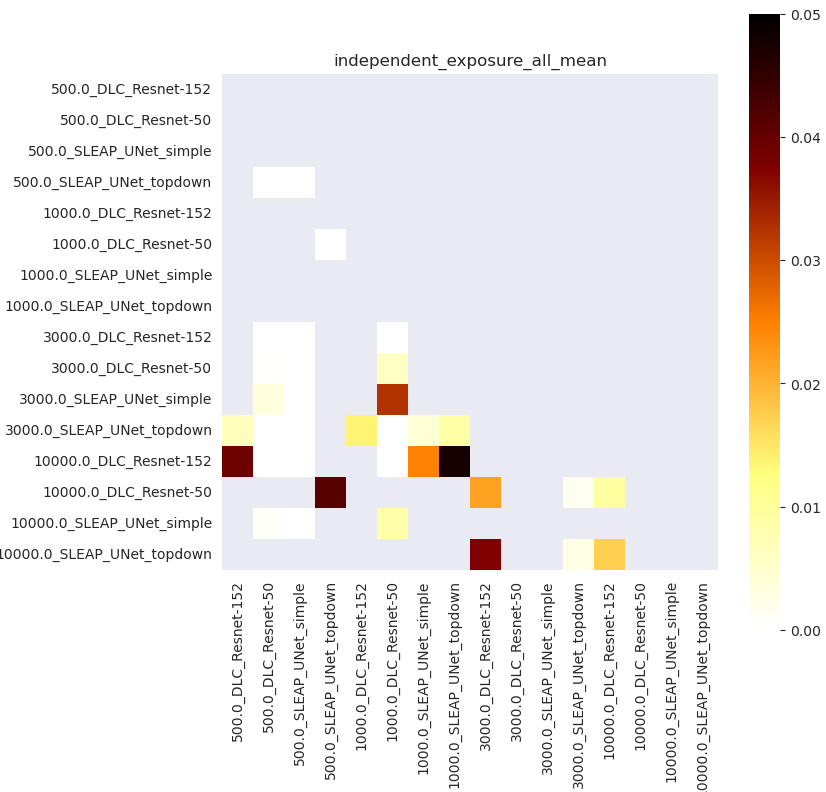

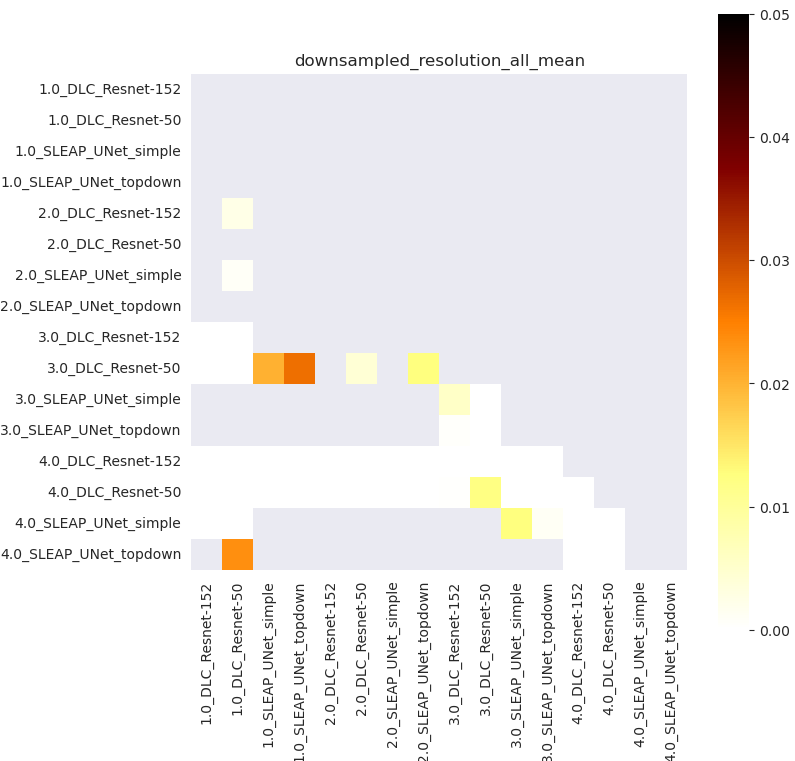

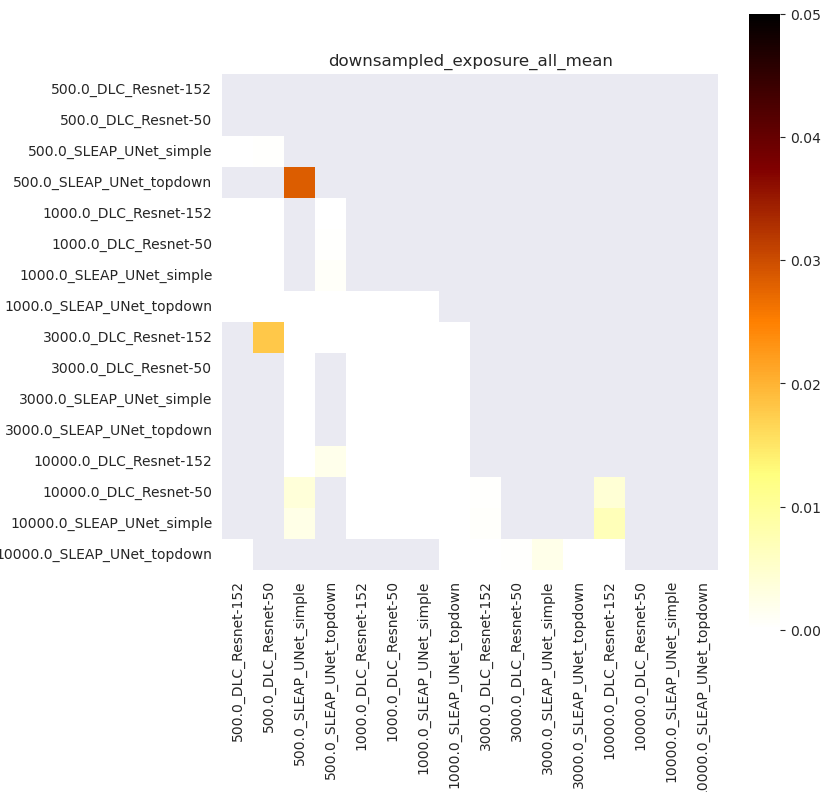

In [47]:
plt.rcParams['figure.figsize']=(8,8)
for dataset in ['independent', 'downsampled']:
    for var in ['resolution', 'exposure']:
        p = pd.DataFrame.from_dict(p_values[dataset+'_'+var+'_all_mean']['Dunn-Bonferroni'])
        with sns.axes_style('dark'):
            sns.heatmap(data=p, cmap='afmhot_r', vmin=0,vmax=0.05, mask=np.logical_or(np.triu(p), p>0.05))

        plt.title(dataset+'_'+var+'_'+keypoint)
        plt.gca().set_aspect('equal')
        plt.savefig(os.path.join(path_to_videos, dataset+'_'+var+'_'+keypoint+'Dunn-Bonferroni.svg'))
        plt.show()

# 5 - Plot example result frames, with predictions (coloured dots) and groundtruth (black dots)

load and plot example frames (these will be within the github repo as well, so change their path below)

In [48]:
test_set_frames = pd.read_csv(r'C:\Users\lscholz\OneDrive - The University of Melbourne\UQ\DLC-SLEAP_paper\Test_dataset_frames.csv')

In [49]:
test_set_frames

,Video,row,col,Frame,x1,y1,x2,y2
0,D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-500\CLAS...,0,0,2061,26,79,45,101
1,D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-1000\CLA...,0,1,1361,80,139,105,155
2,D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-3000\CLA...,0,2,1517,123,108,139,136
3,D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-10000\CL...,0,3,1013,67,85,97,105
4,D:\DLC_Paper\DLC_Tests\RES-2-EXPOSURE-500\CLAS...,1,0,2072,158,120,184,142
5,D:\DLC_Paper\DLC_Tests\RES-2-EXPOSURE-1000\CLA...,1,1,1077,134,31,173,68
6,D:\DLC_Paper\DLC_Tests\RES-2-EXPOSURE-3000\CLA...,1,2,2021,88,8,117,44
7,D:\DLC_Paper\DLC_Tests\RES-2-EXPOSURE-10000\CL...,1,3,79,182,105,204,134
8,D:\DLC_Paper\DLC_Tests\RES-3-EXPOSURE-500\CLAS...,2,0,1840,222,165,283,203
9,D:\DLC_Paper\DLC_Tests\RES-3-EXPOSURE-1000\CLA...,2,1,5,93,79,146,122


## 5.1 - Plot example frames from the independent dataset

#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-500\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1.avi 2061
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-1000\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7.avi 1361
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-3000\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1.avi 1517
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-10000\CLAS-Batch-5-Trial-6-FPS-100-GAIN-0-EXPOSURE-10000-RES-1-STI

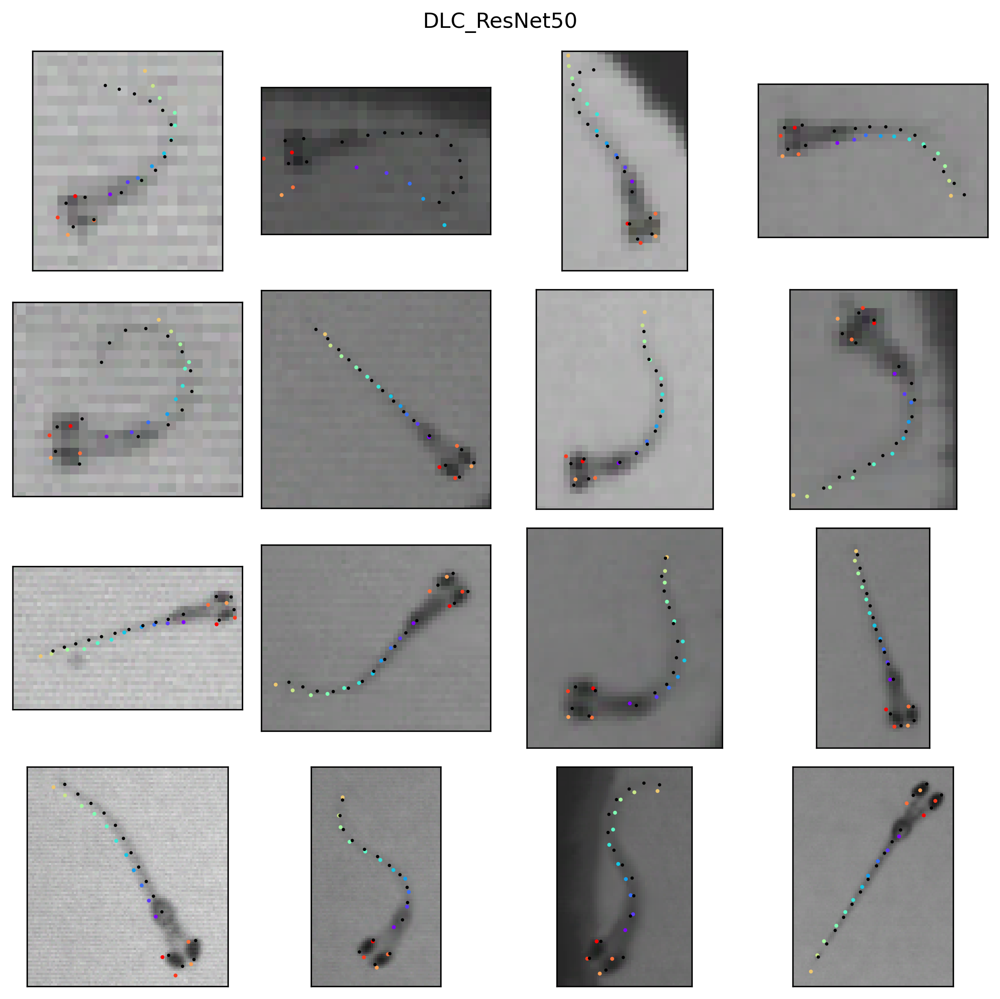

#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-500\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1.avi 2061
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-1000\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7.avi 1361
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-3000\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1.avi 1517
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-10000\CLAS-Batch-5-Trial-6-FPS-100-GAIN-0-EXPOSURE-10000-RES-1-STI

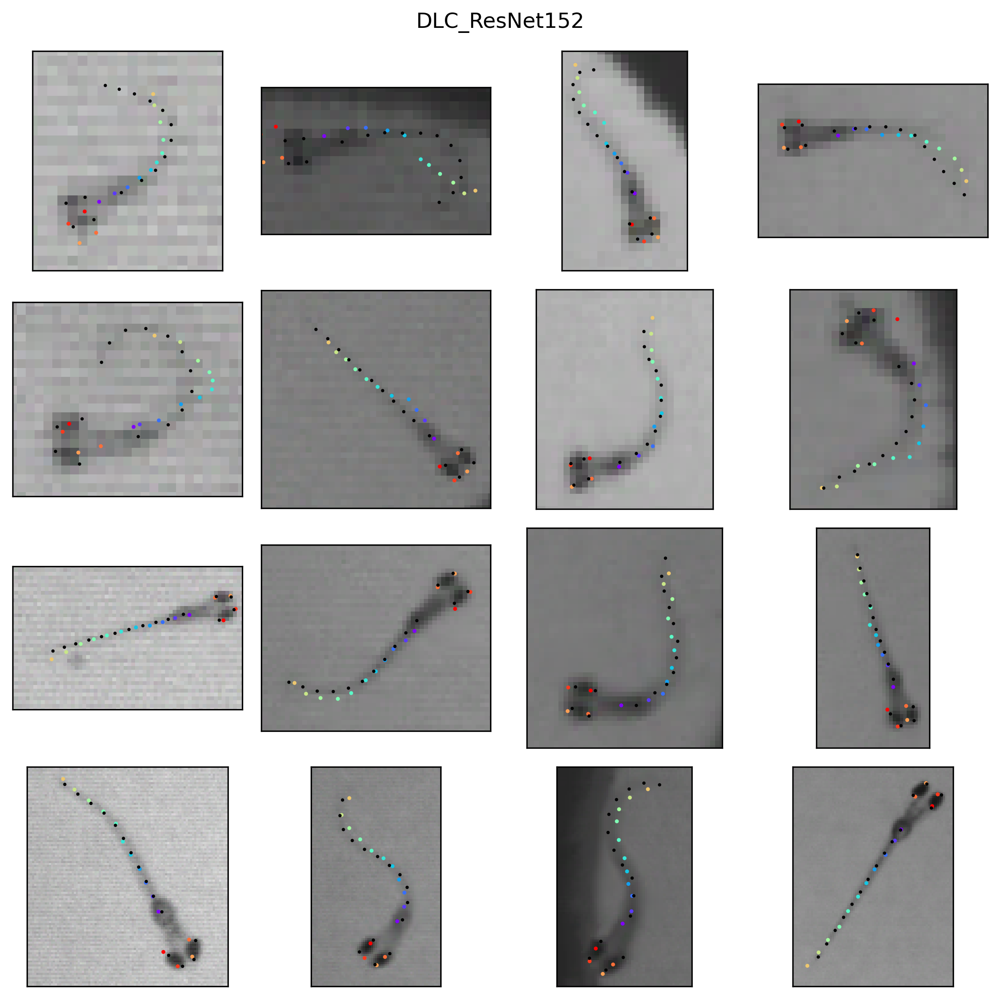

#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-500\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1.avi 2061
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-1000\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7.avi 1361
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-3000\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1.avi 1517
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-10000\CLAS-Batch-5-Trial-6-FPS-100-GAIN-0-EXPOSURE-10000-RES-1-STI

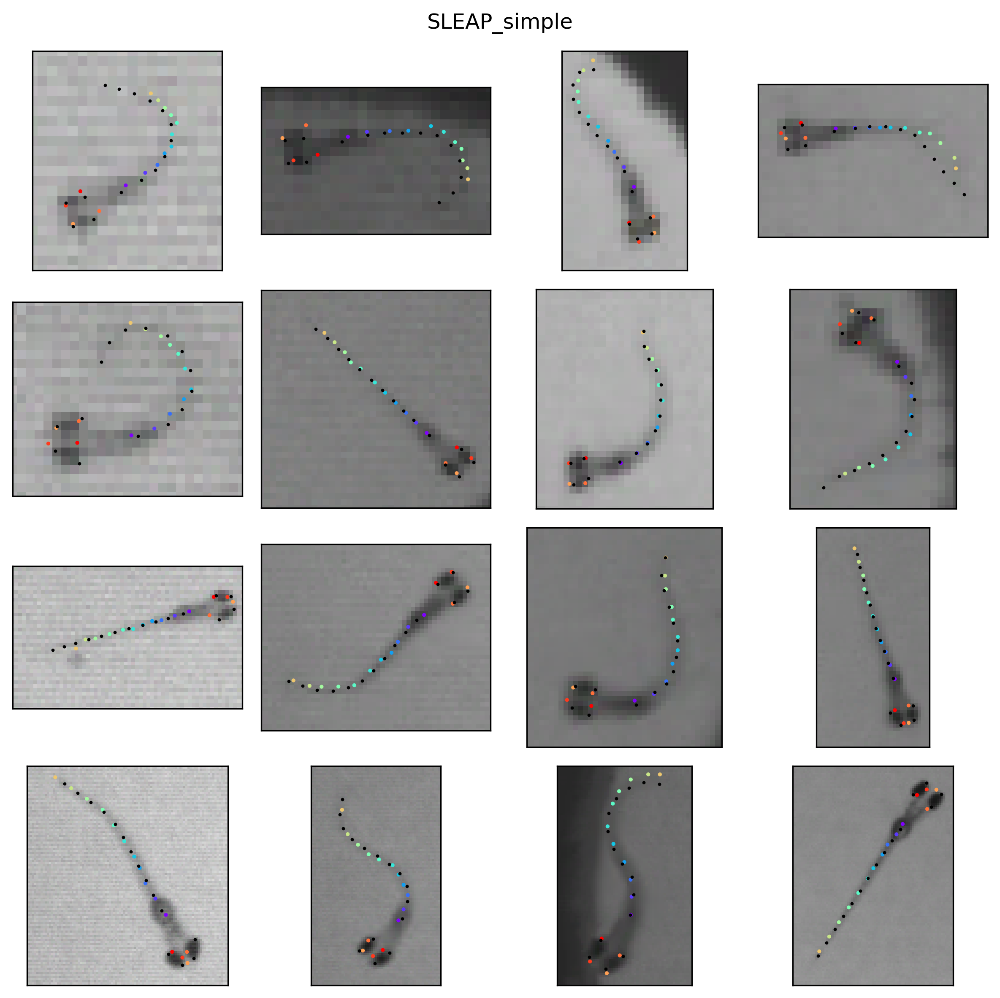

#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-500\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1.avi 2061
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-9-40-42_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-1000\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7.avi 1361
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-2-Trial-4-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-BURST--2024-9-3-10-4-10_well_7\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-3000\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1.avi 1517
D:\DLC_Paper\DLC_Tests\labeled-data\CLAS-Batch-3-Trial-6-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-BURST--2024-9-3-11-2-45_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_Tests\RES-1-EXPOSURE-10000\CLAS-Batch-5-Trial-6-FPS-100-GAIN-0-EXPOSURE-10000-RES-1-STI

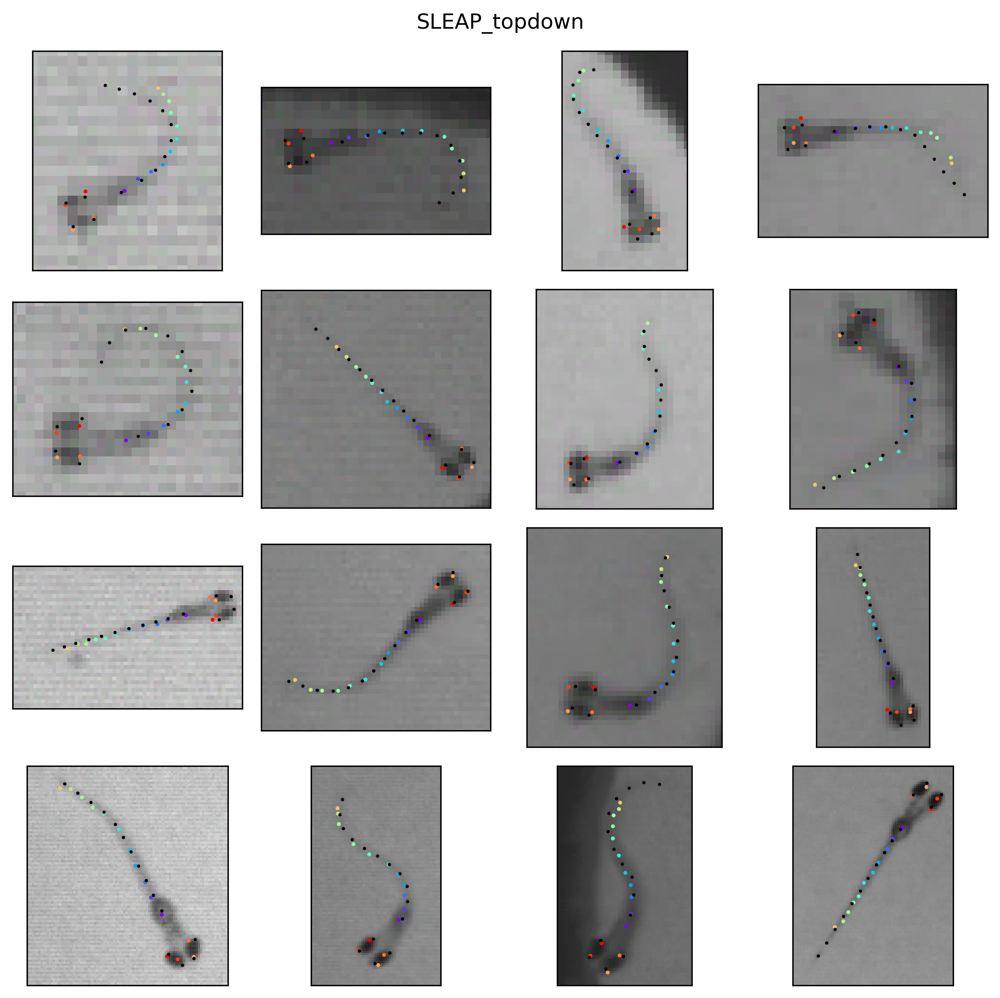

In [50]:
cmap = plt.get_cmap('rainbow', 15)
colors = cmap(np.linspace(0,1,15))

net_dict = {'DLC_ResNet50': 'shuffle0', 'DLC_ResNet152': 'shuffle1', 'SLEAP_simple': 'sim.pred', 'SLEAP_topdown': 'td.pred'}
plt.rcParams['figure.dpi'] = 300

for net, pattern in net_dict.items():

    fig, ax = plt.subplots(4,4,layout='tight')
    for i, video in enumerate(test_set_frames['Video']): 
        print('#######')
        print(video, test_set_frames.loc[i,'Frame'])
        cap = cv2.VideoCapture(video)
        cap.set(cv2.CAP_PROP_POS_FRAMES, test_set_frames.loc[i,'Frame'])
        res, frame = cap.read()
        cap.release()

        ax[test_set_frames['row'][i], test_set_frames['col'][i]].imshow(frame, cmap='grey')
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_xlim([test_set_frames['x1'][i], test_set_frames['x2'][i]])
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_ylim([test_set_frames['y1'][i], test_set_frames['y2'][i]])
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_xticks([])
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_yticks([])

        tracking_results = glob.glob(str(Path(video.replace(Path(video).suffix,'')))+'*'+pattern+'*h5')
        # print(tracking_results)
        
        if 'DLC' in net:
            result_df = pd.read_hdf(tracking_results[0])
            dlc_lvl = result_df.columns.get_level_values(0)[-1]
            keypoints = np.unique(result_df.columns.get_level_values(1)).reshape(-1,)[[4,5,7,8,9,10,11,12,13,14,6,0,1,2,3]]
            # print(keypoints)
            xy_coords = []
            row = copy(result_df.loc[test_set_frames.loc[i,'Frame'],:])
            row = row.droplevel([0])
            # print(row)
            xy_coords = row.values.reshape((-1,3))[:,:2]
            # print(xy_coords)
            
            ax[test_set_frames['row'][i], test_set_frames['col'][i]].scatter(xy_coords[:,0], xy_coords[:,1],c=colors, s=1.5)

        if 'SLEAP' in net: 
            result_df = sleap_to_dlc_format(tracking_results[0], indices=[test_set_frames.loc[i,'Frame']])
            xy_coords = result_df.values.reshape(-1,2)
            ax[test_set_frames['row'][i], test_set_frames['col'][i]].scatter(xy_coords[:,0], xy_coords[:,1],c=colors, s=1.5)

        # ------------
        # plot GT data
        # ------------
        print(str(Path(r"D:\DLC_Paper\DLC_Tests\labeled-data", Path(video).stem, Path("CollectedData*h5"))))
        gt_results = glob.glob(str(Path(r"D:\DLC_Paper\DLC_Tests\labeled-data", Path(video).stem, Path("CollectedData*h5"))))
        # print(gt_results)

        result_df = pd.read_hdf(gt_results[0])
        dlc_lvl = result_df.columns.get_level_values(0)[-1]
        keypoints = np.unique(result_df.columns.get_level_values(1)).reshape(-1,)[[4,5,7,8,9,10,11,12,13,14,6,0,1,2,3]]
        # print(result_df.loc[("labeled-data", Path(video).stem, "img"+str(test_set_frames.loc[i,'Frame']).zfill(4)+".png"),dlc_lvl])

        GT_xy_coords = []
        row = copy(result_df.loc[("labeled-data", Path(video).stem, "img"+str(test_set_frames.loc[i,'Frame']).zfill(4)+".png"),dlc_lvl])
        row = row.droplevel([0])
        # print(row)
        GT_xy_coords = row.values.reshape((-1,2))[:,:2]
        # print(xy_coords)
        
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].scatter(GT_xy_coords[:,0], GT_xy_coords[:,1],c='k', s=0.75)
        # ax[test_set_frames['row'][i], test_set_frames['col'][i]].plot(GT_xy_coords[0,:], xy_coords[0,:],c='k')
    fig.suptitle(net)
    plt.savefig(os.path.join(r'D:\DLC_Paper\DLC_Tests',net + '_testset_frame_examples_v2_INDEPENDENT.svg'))
    plt.show()
    plt.close()


## 5.2 - Plot example frames now for the downsampled dataset

In [51]:
### load and plot example frames 
test_set_frames = pd.read_csv(r'C:\Users\lscholz\OneDrive - The University of Melbourne\UQ\DLC-SLEAP_paper\Test_dataset_frames_DS3.csv')
test_set_frames_GT = pd.read_csv(r'C:\Users\lscholz\OneDrive - The University of Melbourne\UQ\DLC-SLEAP_paper\Test_dataset_frames_DS_GT2.csv')

In [52]:
test_set_frames

,Video,row,col,Frame,x1,y1,x2,y2,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11
0,D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-500\CL...,0,0,2196,110,42,134,69,NaN,NaN,NaN,NaN
1,D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-1000\C...,0,1,2007,115,45,132,73,NaN,NaN,NaN,NaN
2,D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-3000\C...,0,2,2016,0,74,15,99,NaN,NaN,NaN,NaN
3,D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-10000\...,0,3,1012,47,78,77,93,NaN,NaN,NaN,NaN
4,D:\DLC_Paper\DLC_TestsDS\RES-2-EXPOSURE-500\CL...,1,0,2196,144,56,176,91,NaN,NaN,NaN,NaN
5,D:\DLC_Paper\DLC_TestsDS\RES-2-EXPOSURE-1000\C...,1,1,2007,151,59,173,96,NaN,NaN,NaN,NaN
6,D:\DLC_Paper\DLC_TestsDS\RES-2-EXPOSURE-3000\C...,1,2,2016,0,98,20,130,NaN,NaN,NaN,NaN
7,D:\DLC_Paper\DLC_TestsDS\RES-2-EXPOSURE-10000\...,1,3,1012,62,103,101,122,NaN,NaN,NaN,NaN
8,D:\DLC_Paper\DLC_TestsDS\RES-3-EXPOSURE-500\CL...,2,0,2196,212,82,260,134,NaN,NaN,NaN,NaN
9,D:\DLC_Paper\DLC_TestsDS\RES-3-EXPOSURE-1000\C...,2,1,2007,223,86,255,141,NaN,NaN,NaN,NaN


In [53]:
test_set_frames_GT

,Video,row,col,Frame,x1,y1,x2,y2
0,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-500\CLAS...,0,0,2196,430,166,527,272
1,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-1000\CLA...,0,1,2007,452,175,518,287
2,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-3000\CLA...,0,2,2016,1,292,60,388
3,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-10000\CL...,0,3,1012,185,307,302,364
4,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-500\CLAS...,1,0,2196,430,166,527,272
5,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-1000\CLA...,1,1,2007,452,175,518,287
6,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-3000\CLA...,1,2,2016,1,292,60,388
7,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-10000\CL...,1,3,1012,185,307,302,364
8,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-500\CLAS...,2,0,2196,430,166,527,272
9,D:\DLC_Paper\DLC_Tests\RES-4-EXPOSURE-1000\CLA...,2,1,2007,452,175,518,287


#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-500\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1.avi 2196
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-1000\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1.avi 2007
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-3000\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1.avi 2016
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-10000\CLAS-Batch-13-Trial-6-FPS-100-GAIN-0-EXPOSURE-

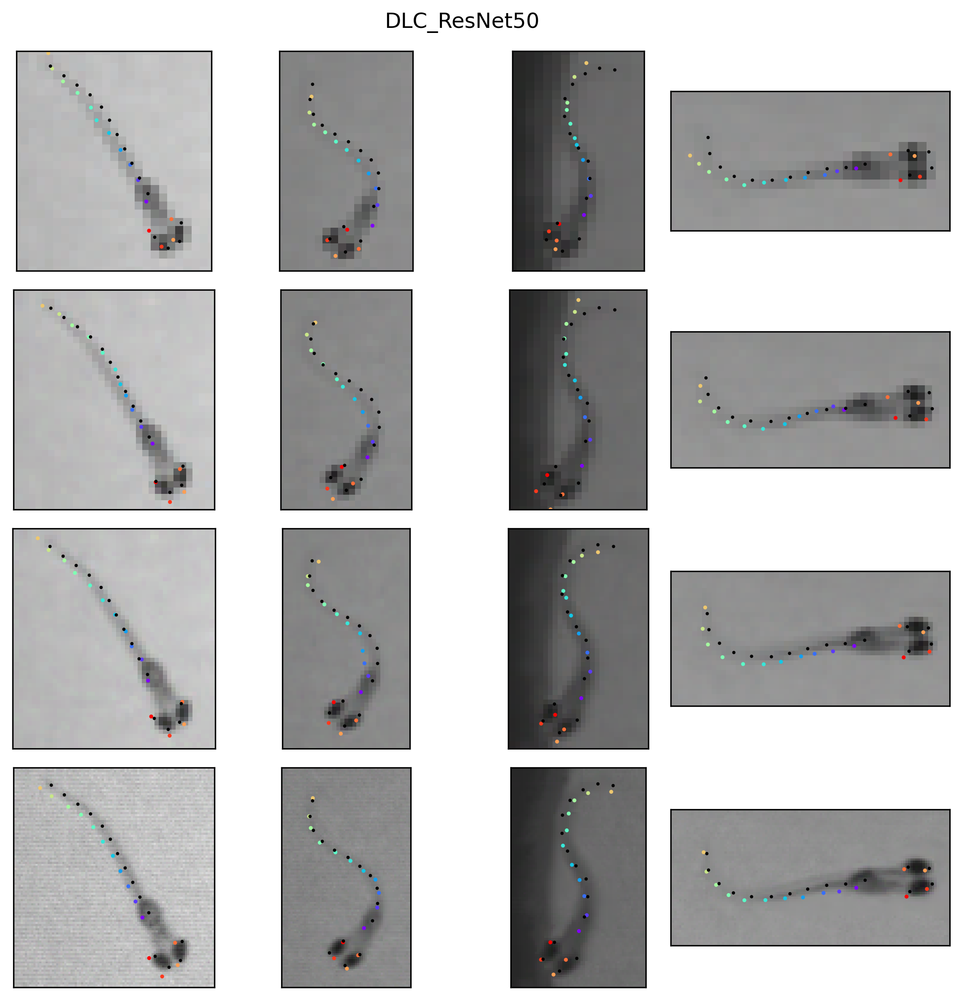

#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-500\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1.avi 2196
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-1000\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1.avi 2007
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-3000\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1.avi 2016
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-10000\CLAS-Batch-13-Trial-6-FPS-100-GAIN-0-EXPOSURE-

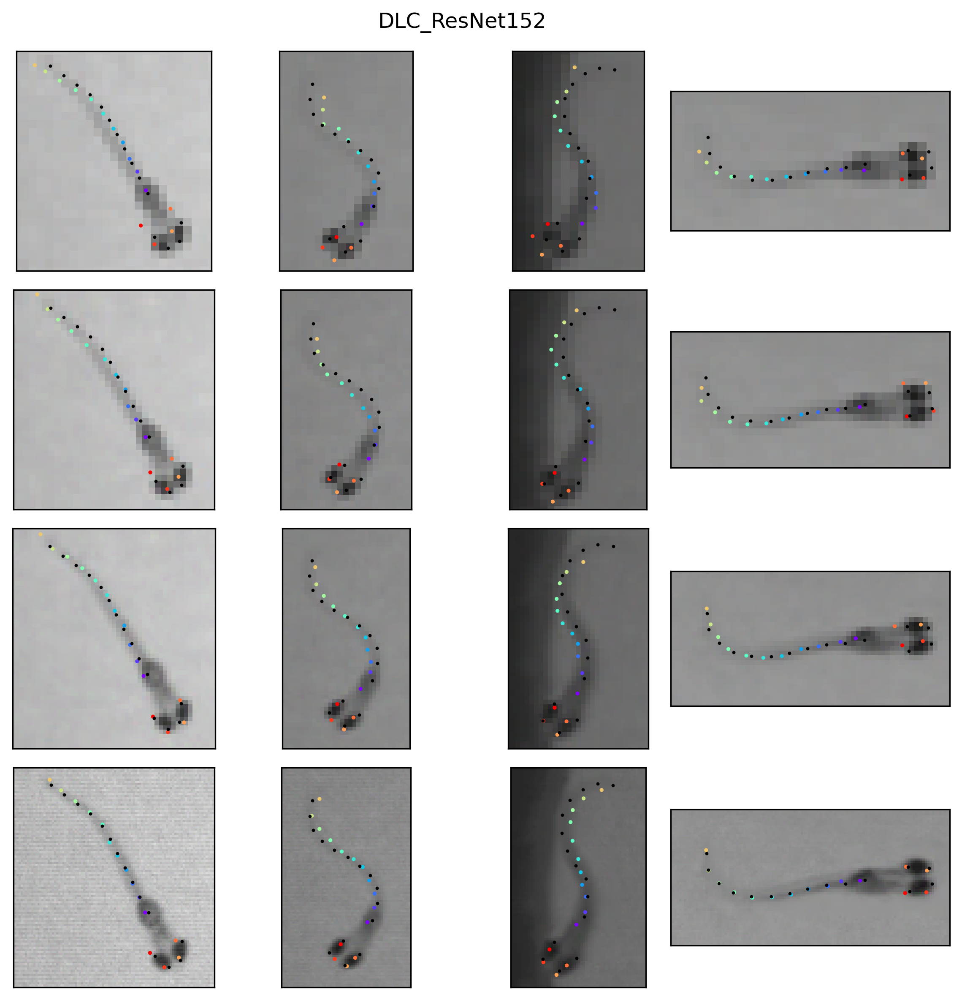

#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-500\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1.avi 2196
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-1000\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1.avi 2007
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-3000\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1.avi 2016
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-10000\CLAS-Batch-13-Trial-6-FPS-100-GAIN-0-EXPOSURE-

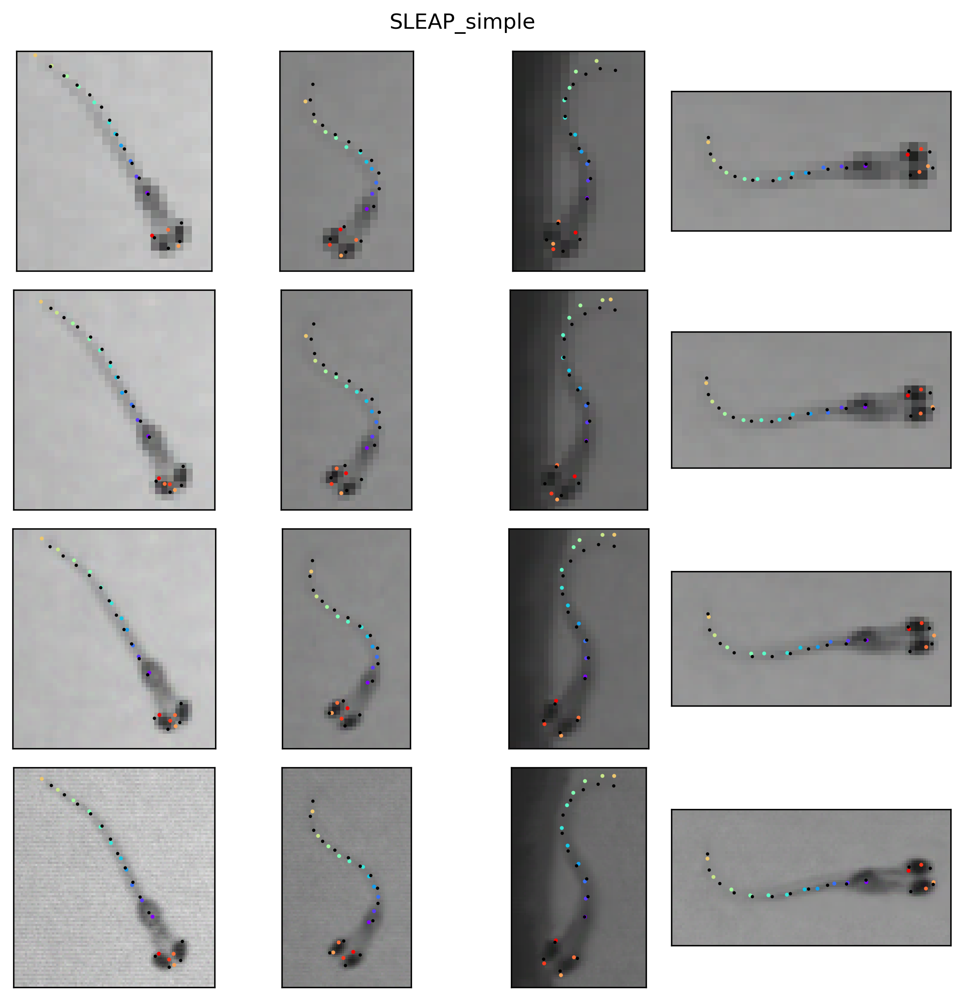

#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-500\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1.avi 2196
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-11-Trial-2-FPS-200-GAIN-3-EXPOSURE-500-RES-1-STIM-FLASH--2024-9-3-15-54-18_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-1000\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1.avi 2007
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-12-Trial-3-FPS-200-GAIN-2-EXPOSURE-1000-RES-1-STIM-TAP--2024-9-3-16-6-30_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-3000\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1.avi 2016
D:\DLC_Paper\DLC_TestsDS\labeled-data\CLAS-Batch-13-Trial-1-FPS-200-GAIN-0-EXPOSURE-3000-RES-1-STIM-TAP--2024-9-3-16-19-4_well_1\CollectedData*h5
#######
D:\DLC_Paper\DLC_TestsDS\RES-1-EXPOSURE-10000\CLAS-Batch-13-Trial-6-FPS-100-GAIN-0-EXPOSURE-

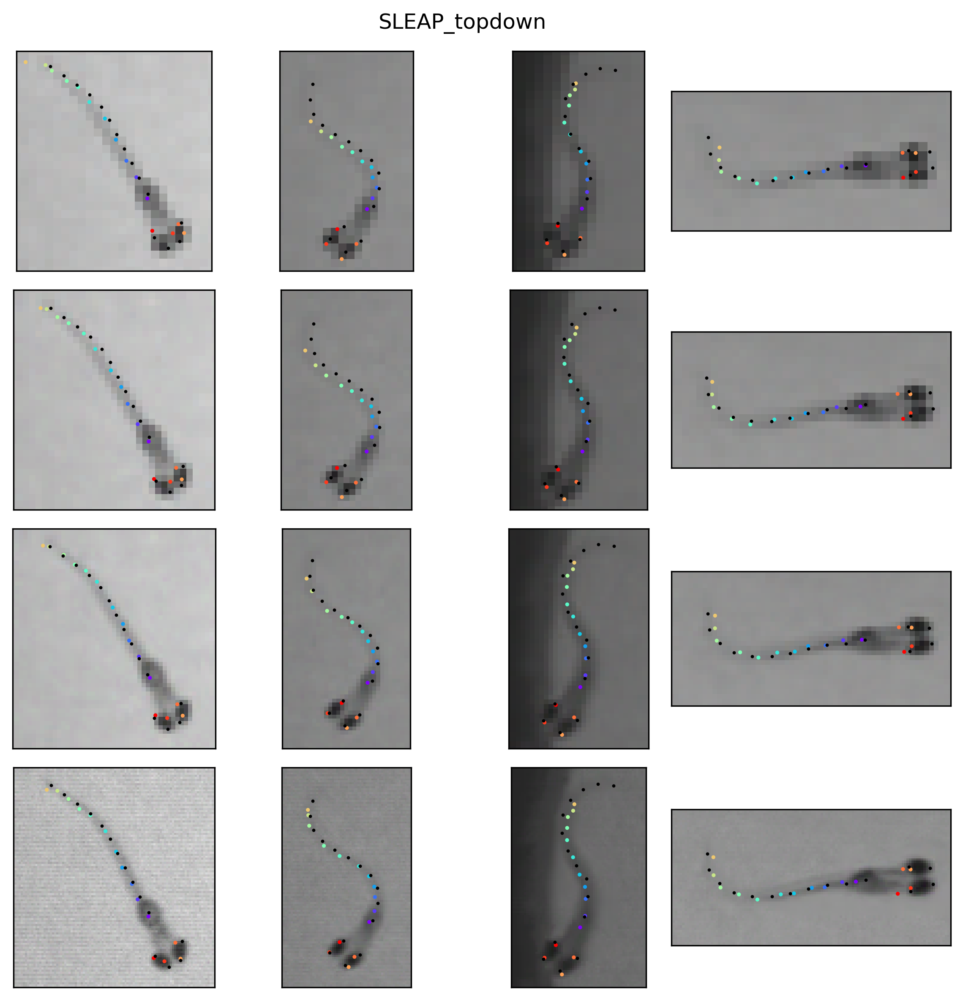

In [54]:
cmap = plt.get_cmap('rainbow', 15)
colors = cmap(np.linspace(0,1,15))

net_dict = {'DLC_ResNet50': 'shuffle0', 'DLC_ResNet152': 'shuffle1', 'SLEAP_simple': 'sim.pred', 'SLEAP_topdown': 'td.pred'}
plt.rcParams['figure.dpi'] = 300

for net, pattern in net_dict.items():

    fig, ax = plt.subplots(4,4,layout='tight')
    for i, video in enumerate(test_set_frames['Video']): 
        print('#######')
        print(video, test_set_frames.loc[i,'Frame'])
        cap = cv2.VideoCapture(video)

        if test_set_frames['col'][i] in [1,2,3] and  test_set_frames['row'][i] in [0,1,2] :
            cap.set(cv2.CAP_PROP_POS_FRAMES, test_set_frames.loc[i,'Frame']+8) # for some reason, to match the frame some videos are 8 frames behind
        if test_set_frames['col'][i] == 0 or test_set_frames['row'][i] == 3:
            cap.set(cv2.CAP_PROP_POS_FRAMES, test_set_frames.loc[i,'Frame'])
            
        res, frame = cap.read()
        cap.release()

        ax[test_set_frames['row'][i], test_set_frames['col'][i]].imshow(frame, cmap='grey')
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_xlim([test_set_frames['x1'][i], test_set_frames['x2'][i]])
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_ylim([test_set_frames['y1'][i], test_set_frames['y2'][i]])
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_xticks([])
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].set_yticks([])

        tracking_results = glob.glob(str(Path(video.replace(Path(video).suffix,'')))+'*'+pattern+'*h5')
        # print(tracking_results)
        
        if 'DLC' in net:
            result_df = pd.read_hdf(tracking_results[0])
            dlc_lvl = result_df.columns.get_level_values(0)[-1]
            keypoints = np.unique(result_df.columns.get_level_values(1)).reshape(-1,)[[4,5,7,8,9,10,11,12,13,14,6,0,1,2,3]]
            # print(keypoints)
            xy_coords = []
            row = copy(result_df.loc[test_set_frames.loc[i,'Frame'],:])
            row = row.droplevel([0])
            # print(row)
            xy_coords = row.values.reshape((-1,3))[:,:2]
            # print(xy_coords)
            
            ax[test_set_frames['row'][i], test_set_frames['col'][i]].scatter(xy_coords[:,0], xy_coords[:,1],c=colors, s=1.5)

        if 'SLEAP' in net: 
            result_df = sleap_to_dlc_format(tracking_results[0], indices=[test_set_frames.loc[i,'Frame']])
            xy_coords = result_df.values.reshape(-1,2)
            ax[test_set_frames['row'][i], test_set_frames['col'][i]].scatter(xy_coords[:,0], xy_coords[:,1],c=colors, s=1.5)

        # ------------
        # plot GT data
        # ------------
        print(str(Path(r"D:\DLC_Paper\DLC_TestsDS\labeled-data", Path(video).stem, Path("CollectedData*h5"))))
        gt_results = glob.glob(str(Path(r"D:\DLC_Paper\DLC_TestsDS\labeled-data", Path(video).stem, Path("CollectedData*h5"))))
        # print(gt_results)

        result_df = pd.read_hdf(gt_results[0])
        dlc_lvl = result_df.columns.get_level_values(0)[-1]
        keypoints = np.unique(result_df.columns.get_level_values(1)).reshape(-1,)[[4,5,7,8,9,10,11,12,13,14,6,0,1,2,3]]
        
        RES = re.findall('RES-\d',  Path(video).stem)
        # print("CURR RES: {}".format(RES))
        new_PATH_GT = Path(video).stem.replace(RES[0], 'RES-4')
        # print("NEW RES TO FIND GT POINTS: {}".format(new_PATH_GT))
        # print(result_df.loc[("labeled-data", new_PATH_GT, "img"+str(test_set_frames_GT.loc[i,'Frame']).zfill(4)+".png"),dlc_lvl])

        GT_xy_coords = []
        row = copy(result_df.loc[("labeled-data", new_PATH_GT, "img"+str(test_set_frames_GT.loc[i,'Frame']).zfill(4)+".png"),dlc_lvl])
        row = row.droplevel([0])
        # print(row)
        GT_xy_coords = row.values.reshape((-1,2))[:,:2]
        # print(xy_coords)
        
        divider = {3: 1, 2: 2.03, 1: 2.99, 0: 3.925} #based on row index, divide the GT coordinates by a certain amount
        row_div = test_set_frames['row'][i]
        ax[test_set_frames['row'][i], test_set_frames['col'][i]].scatter(GT_xy_coords[:,0]/divider[row_div], GT_xy_coords[:,1]/divider[row_div],c='k', s=0.75)
        # ax[test_set_frames['row'][i], test_set_frames['col'][i]].plot(GT_xy_coords[0,:], xy_coords[0,:],c='k')
    fig.suptitle(net)
    plt.savefig(os.path.join(r'D:\DLC_Paper\DLC_Tests',net + '_testset_frame_examples_v2_DS.svg'))
    plt.show()
    plt.close()


# 6 - Calculate the number of false positives from each network predictions by group (resolution and exposure time)

In [55]:
false_positives_df = []
for method in np.unique(error_methods_df['method']):
    for resolution in [1,2,3,4]:
        for exposure in [500, 1000, 3000, 10000]:
            for video in np.unique(error_methods_df['video_name']):
                res_exp_mask = np.logical_and(error_methods_df['resolution'] == resolution, error_methods_df['exposure'] == exposure)
                meth_res_exp_mask = np.logical_and(res_exp_mask, np.logical_and(error_methods_df['method'] == method, error_methods_df['video_name'] == video))
                res_exp_idx = np.where(meth_res_exp_mask)[0]
                total_pts = np.product(error_methods_df.iloc[res_exp_idx,3:18].shape)
                print("{}, {}, {}".format(method, resolution, exposure))
                print("     There are {} points in this (res,exp) pair".format(total_pts))
                total_nan = np.sum(np.isnan(error_methods_df.iloc[res_exp_idx,2:17].values))
                percent_FP = 100*(total_nan/total_pts)
                print("     % of false negatives: {:.2f}".format(percent_FP))     
                res = [method, resolution, exposure, video, total_pts, total_nan, percent_FP]   
                false_positives_df.extend([res])    

DLC_Resnet-152, 1, 500
     There are 150 points in this (res,exp) pair
     % of false negatives: 0.00
DLC_Resnet-152, 1, 500
     There are 150 points in this (res,exp) pair
     % of false negatives: 0.67
DLC_Resnet-152, 1, 500
     There are 150 points in this (res,exp) pair
     % of false negatives: 7.33
DLC_Resnet-152, 1, 500
     There are 150 points in this (res,exp) pair
     % of false negatives: 10.67
DLC_Resnet-152, 1, 500
     There are 300 points in this (res,exp) pair
     % of false negatives: 0.00
DLC_Resnet-152, 1, 500
     There are 150 points in this (res,exp) pair
     % of false negatives: 9.33
DLC_Resnet-152, 1, 500
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 500
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 500
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 500
     There are 0 points in this (res,exp) pair
  

C:\Users\lscholz\AppData\Local\Temp\ipykernel_44948\1652468775.py:13: RuntimeWarning: invalid value encountered in scalar divide
  percent_FP = 100*(total_nan/total_pts)


DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of false negatives: nan
DLC_Resnet-152, 1, 1000
     There are 0 points in this (res,exp) pair
     % of f

In [56]:
false_positives_df = pd.DataFrame(false_positives_df, columns=['method', 'resolution', 'exposure', 'video_name', 'total_pts','total_nan','percent_false_positive'])

In [57]:
false_positives_df

,method,resolution,exposure,video_name,total_pts,total_nan,percent_false_positive
0,DLC_Resnet-152,1,500,CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-5...,150,0,0.000000
1,DLC_Resnet-152,1,500,CLAS-Batch-1-Trial-1-FPS-200-GAIN-3-EXPOSURE-5...,150,1,0.666667
2,DLC_Resnet-152,1,500,CLAS-Batch-1-Trial-2-FPS-200-GAIN-3-EXPOSURE-5...,150,11,7.333333
3,DLC_Resnet-152,1,500,CLAS-Batch-1-Trial-2-FPS-200-GAIN-3-EXPOSURE-5...,150,16,10.666667
4,DLC_Resnet-152,1,500,CLAS-Batch-1-Trial-3-FPS-200-GAIN-3-EXPOSURE-5...,300,0,0.000000
...,...,...,...,...,...,...,...
6075,SLEAP_UNet_topdown,4,10000,CLAS-Batch-9-Trial-3-FPS-200-GAIN-2-EXPOSURE-1...,0,0,NaN
6076,SLEAP_UNet_topdown,4,10000,CLAS-Batch-9-Trial-4-FPS-200-GAIN-0-EXPOSURE-3...,0,0,NaN
6077,SLEAP_UNet_topdown,4,10000,CLAS-Batch-9-Trial-4-FPS-200-GAIN-0-EXPOSURE-3...,0,0,NaN
6078,SLEAP_UNet_topdown,4,10000,CLAS-Batch-9-Trial-5-FPS-200-GAIN-0-EXPOSURE-3...,0,0,NaN


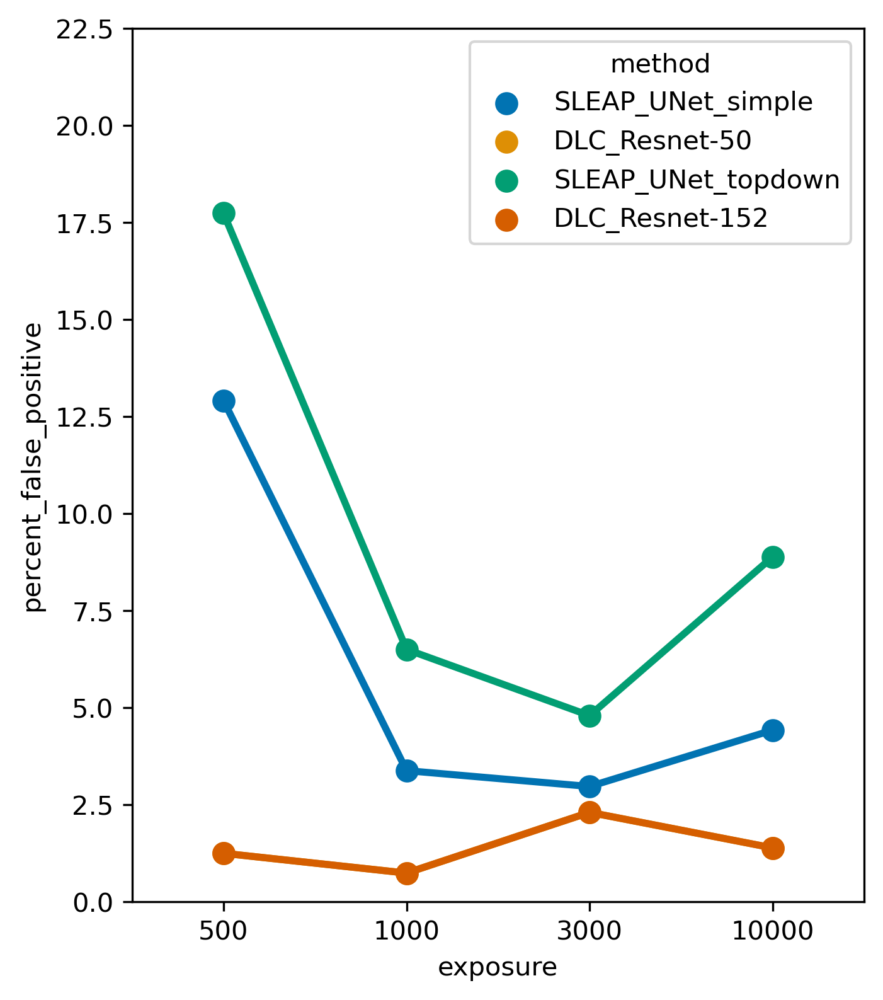

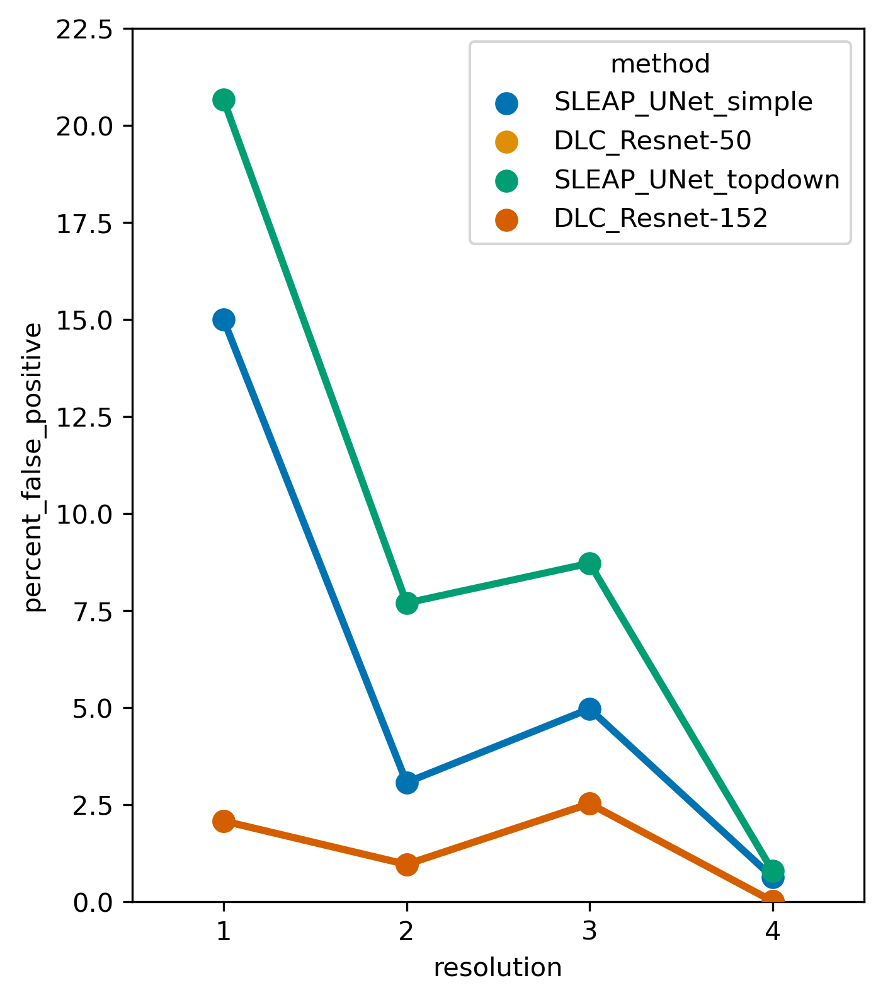

In [58]:

plt.rcParams['figure.figsize']=(5,6)
sns.pointplot(data=false_positives_df, x='exposure', y='percent_false_positive',hue='method', errwidth=0, palette=sns.color_palette("colorblind"), hue_order=['SLEAP_UNet_simple', 'DLC_Resnet-50', 'SLEAP_UNet_topdown', 'DLC_Resnet-152'])
plt.ylim([0,22.5])
plt.savefig(os.path.join(path_to_videos,'percent_false_positive_exposure.svg'))
plt.show()
sns.pointplot(data=false_positives_df, x='resolution', y='percent_false_positive',hue='method', errwidth=0, palette=sns.color_palette("colorblind"), hue_order=['SLEAP_UNet_simple', 'DLC_Resnet-50', 'SLEAP_UNet_topdown', 'DLC_Resnet-152'])
plt.ylim([0,22.5])
plt.savefig(os.path.join(path_to_videos,'percent_false_positive_resolution.svg'))
plt.show()

In [59]:
false_positives_df.groupby(by=['method', 'exposure']).describe()

resolution                                       \
                                 count mean       std  min   25%  50%   75%   
method             exposure                                                   
DLC_Resnet-152     500           380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   1000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   3000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   10000         380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
DLC_Resnet-50      500           380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   1000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   3000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   10000         380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
SLEAP_UNet_simple  500           380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   1000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   3000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   10000         380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
SLEAP_UNet_topdown 500           380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   1000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   3000          380.0  2.5  1.119508  1.0  1.75  2.5  3.25   
                   10000         380.0  2.5  1.119508  1.0  1.75  2.5  3.25   

                                 total_pts            ... total_nan         \
                             max     count      mean  ...       75%    max   
method             exposure                           ...                    
DLC_Resnet-152     500       4.0     380.0  9.868421  ...       0.0   16.0   
                   1000      4.0     380.0  9.434211  ...       0.0   14.0   
                   3000      4.0     380.0  9.473684  ...       0.0   70.0   
                   10000     4.0     380.0  9.868421  ...       0.0   22.0   
DLC_Resnet-50      500       4.0     380.0  9.868421  ...       0.0   16.0   
                   1000      4.0     380.0  9.434211  ...       0.0   14.0   
                   3000      4.0     380.0  9.473684  ...       0.0   70.0   
                   10000     4.0     380.0  9.868421  ...       0.0   22.0   
SLEAP_UNet_simple  500       4.0     380.0  9.473684  ...       0.0  137.0   
                   1000      4.0     380.0  9.434211  ...       0.0   57.0   
                   3000      4.0     380.0  9.473684  ...       0.0   70.0   
                   10000     4.0     380.0  9.868421  ...       0.0   27.0   
SLEAP_UNet_topdown 500       4.0     380.0  9.473684  ...       0.0  124.0   
                   1000      4.0     380.0  9.434211  ...       0.0  103.0   
                   3000      4.0     380.0  9.473684  ...       0.0   84.0   
                   10000     4.0     380.0  9.868421  ...       0.0   57.0   

                            percent_false_positive                             \
                                             count       mean        std  min   
method             exposure                                                     
DLC_Resnet-152     500                        24.0   1.250000   3.104072  0.0   
                   1000                       24.0   0.740741   2.074994  0.0   
                   3000                       23.0   2.304348   9.734305  0.0   
                   10000                      24.0   1.388889   3.312495  0.0   
DLC_Resnet-50      500                        24.0   1.250000   3.104072  0.0   
                   1000                       24.0   0.740741   2.074994  0.0   
                   3000                       23.0   2.304348   9.734305  0.0   
                   10000                      24.0   1.388889   3.312495  0.0   
SLEAP_UNet_simple  500                        23.0  12.913043  25.479288  0.0   
                   1000                       24.0   3.379630   8.01045

# 7 - Plot evaluation of DLC iterations

In [60]:
dlc_eval = pd.read_csv(r'D:\DLC_comparisons\CombinedEvaluation-results-shuffle1-ALL.csv')

In [61]:
dlc_eval.head()

,Unnamed: 0,Training iterations:,%Training dataset,Shuffle number,Train error(px),Validation error (px),Train + Validation (px)
0,0,100000,90,1,3.11,3.40,6.51
1,1,200000,90,1,1.77,1.91,3.68
2,2,300000,90,1,2.24,2.29,4.53
3,3,400000,90,1,1.86,2.05,3.91
4,4,500000,90,1,1.08,1.32,2.40


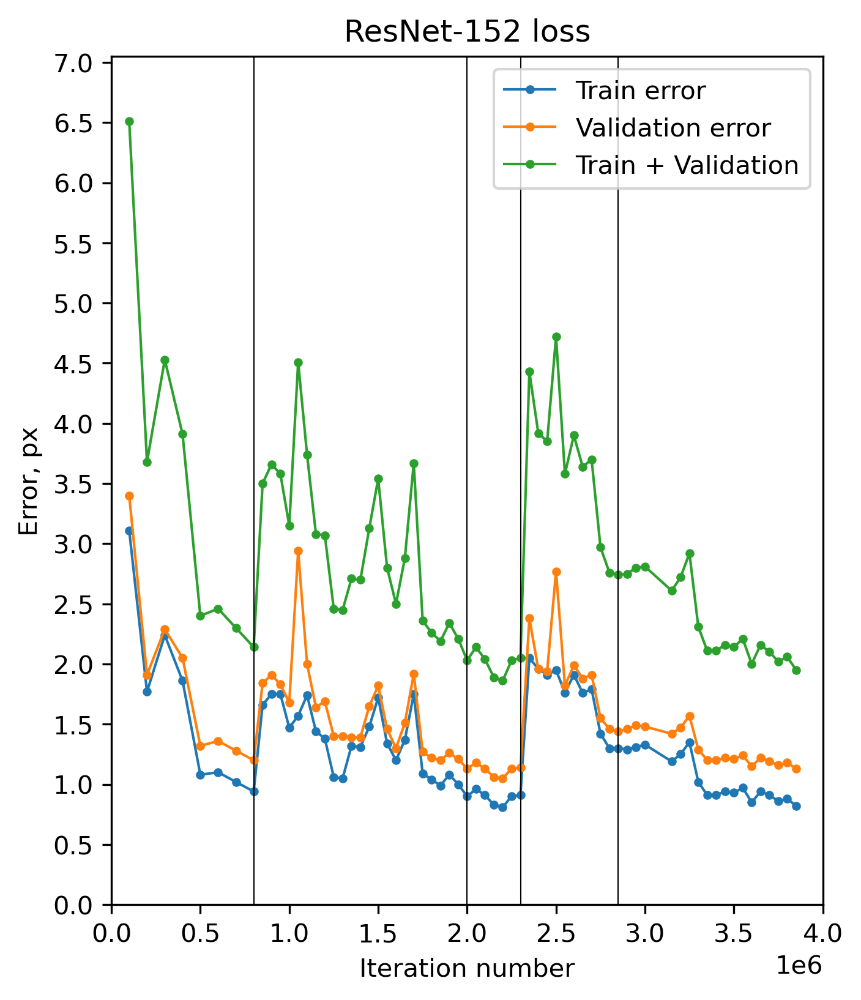

In [62]:
plt.plot(dlc_eval['Training iterations:'], dlc_eval['Train error(px)'], 'o-', markersize=2.5, linewidth=1)
plt.plot(dlc_eval['Training iterations:'], dlc_eval['Validation error (px)'], 'o-', markersize=2.5, linewidth=1)
plt.plot(dlc_eval['Training iterations:'], dlc_eval['Train + Validation (px)'], 'o-', markersize=2.5, linewidth=1)
plt.legend(['Train error','Validation error', 'Train + Validation'])
plt.xlabel('Iteration number')
plt.ylabel('Error, px')
plt.ylim([0, 7.05])
plt.xlim([0, 4000000])
plt.yticks(np.arange(0,7.05,0.5))
iteration_points = [800000, 2000000, 2300000, 2850000]
# 3850000
for point in iteration_points:
    plt.vlines(point, ymin=0, ymax=7.05, color='black', linewidth=0.5)
plt.title('ResNet-152 loss')
plt.show()
# plt.savefig('D:\DLC_comparisons\ResNet-152_errors.svg')

In [63]:
dlc_eval = pd.read_csv(r'D:\DLC_comparisons\CombinedEvaluation-results-shuffle0-ALL.csv')

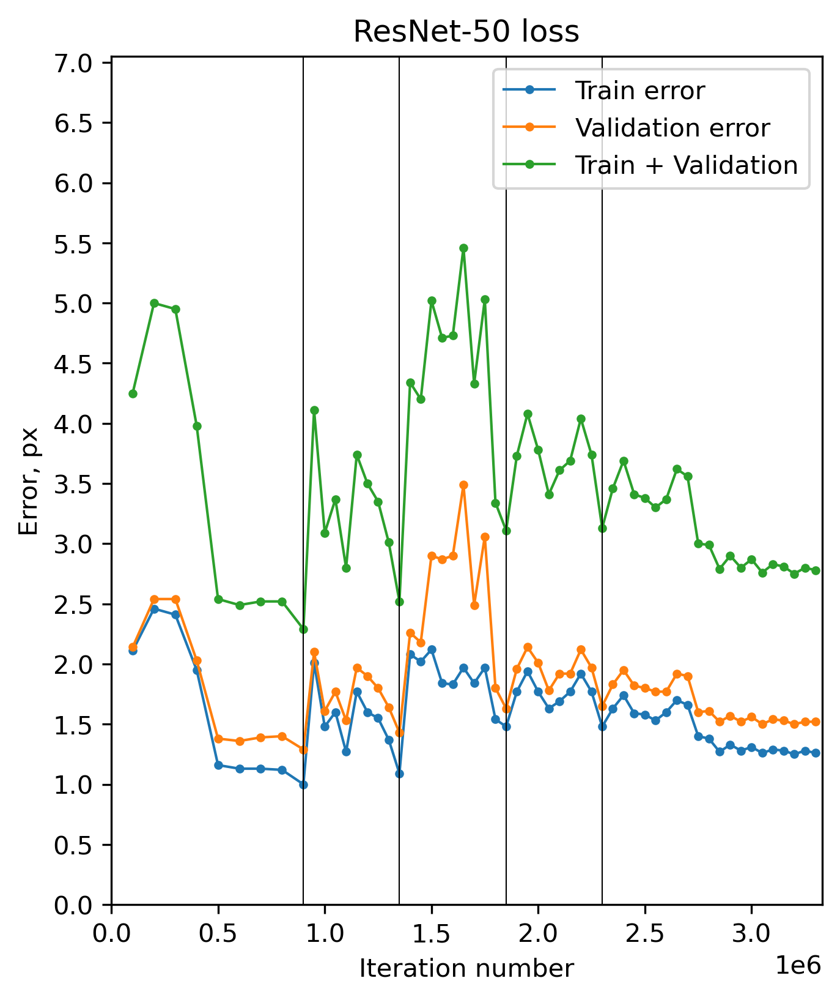

In [64]:
plt.plot(dlc_eval['Training iterations:'], dlc_eval['Train error(px)'], 'o-', markersize=2.5, linewidth=1)
plt.plot(dlc_eval['Training iterations:'], dlc_eval['Validation error (px)'], 'o-', markersize=2.5, linewidth=1)
plt.plot(dlc_eval['Training iterations:'], dlc_eval['Train + Validation (px)'], 'o-', markersize=2.5, linewidth=1)
plt.legend(['Train error','Validation error', 'Train + Validation'])
plt.xlabel('Iteration number')
plt.ylabel('Error, px')
plt.ylim([0, 7.05])
plt.xlim([0, 3330000])
plt.yticks(np.arange(0,7.05,0.5))
iteration_points = [900000, 1350000, 1850000, 2300000]
# 3850000
for point in iteration_points:
    plt.vlines(point, ymin=0, ymax=7.05, color='black', linewidth=0.5)
plt.title('ResNet-50 loss')
plt.show()
# plt.savefig('D:\DLC_comparisons\ResNet-50_errors.svg')